In [1]:
import torch
import time
import numpy as np
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets
from utils import Logger
import matplotlib.pyplot as plt
import torchvision.utils as vutils

In [2]:
def mnist_data():
    compose = transforms.Compose([transforms.ToTensor(),transforms.Normalize((.5,.5,.5),(.5,.5,.5))])
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir,train = True, transform = compose, download = True)

data = mnist_data()

data_loader = torch.utils.data.DataLoader(data, batch_size = 100, shuffle = True)

num_batches = len(data_loader)


In [3]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
discriminator = DiscriminatorNet()

In [4]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)


In [5]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
generator = GeneratorNet()

In [6]:
def noise(size):
    n = Variable(torch.randn(size, 100))
    return n

In [7]:

d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)
loss = nn.BCELoss()

def ones_target(size):
    data = Variable(torch.ones(size,1))
    return data
def zeros_target(size):
    data = Variable(torch.zeros(size,1))
    return data


In [8]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake


def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error
    
num_test_samples = 16
test_noise = noise(num_test_samples)
gen_error = []
dsc_error = []

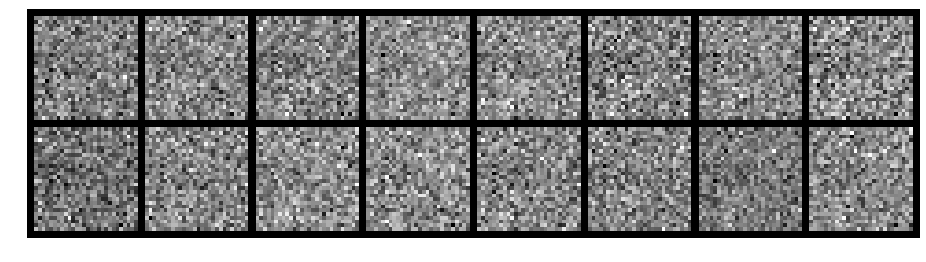

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.4033, Generator Loss: 0.6966
D(x): 0.4894, D(G(z)): 0.4977
0 min	 0.8536174297332764 sec


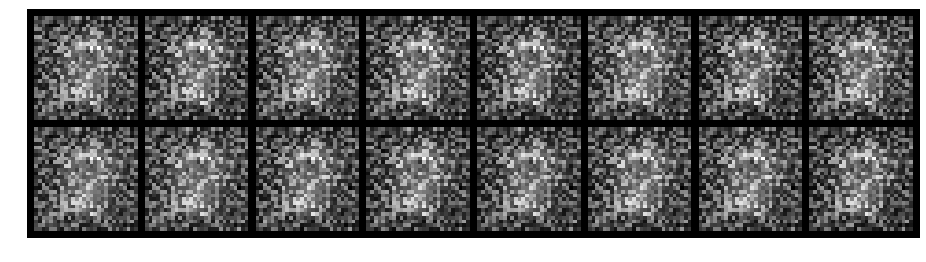

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 1.1630, Generator Loss: 1.9387
D(x): 0.6648, D(G(z)): 0.4220
0 min	 19.059794902801514 sec


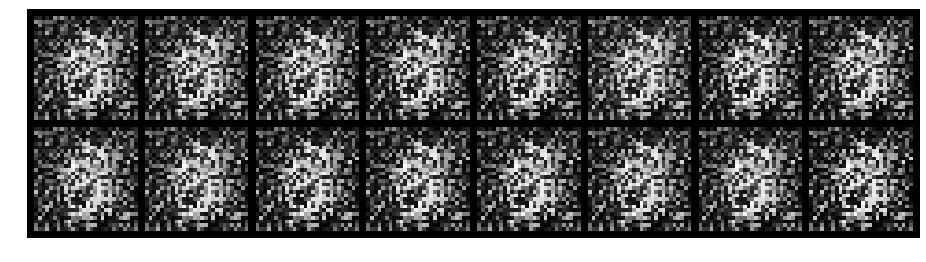

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 1.6448, Generator Loss: 1.8584
D(x): 0.6158, D(G(z)): 0.5764
0 min	 36.290839433670044 sec


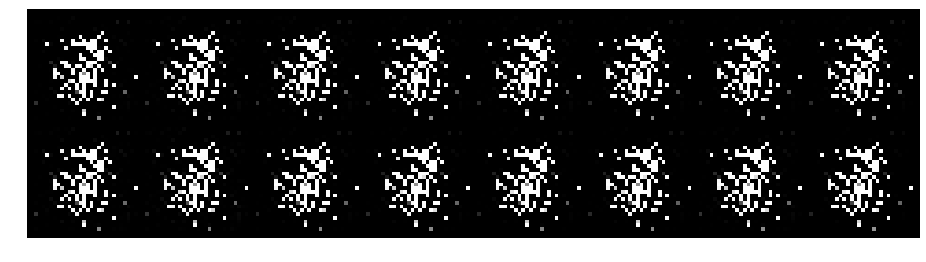

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.0293, Generator Loss: 5.3137
D(x): 0.9875, D(G(z)): 0.0155
0 min	 53.59727454185486 sec


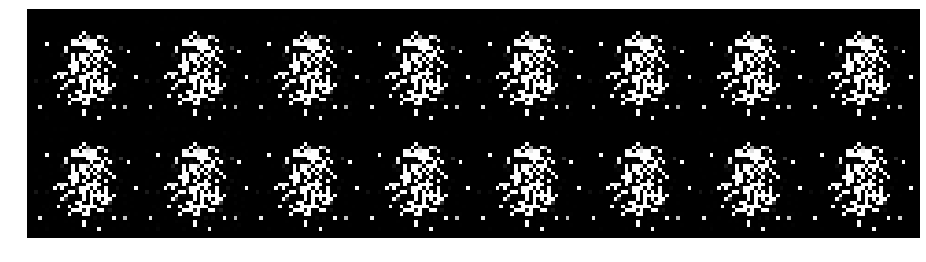

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.0054, Generator Loss: 7.8499
D(x): 0.9961, D(G(z)): 0.0015
1 min	 11.178493022918701 sec


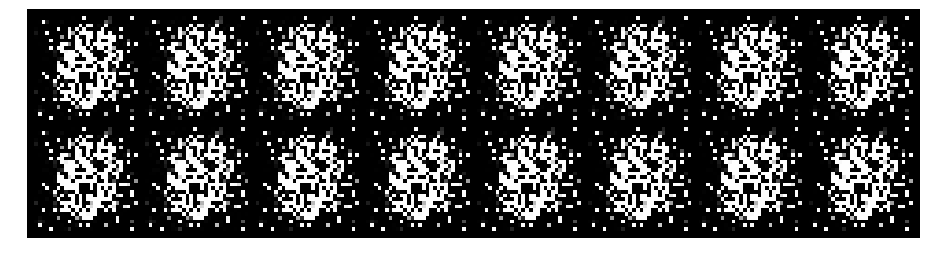

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 0.0081, Generator Loss: 7.9819
D(x): 0.9983, D(G(z)): 0.0063
1 min	 28.431857109069824 sec


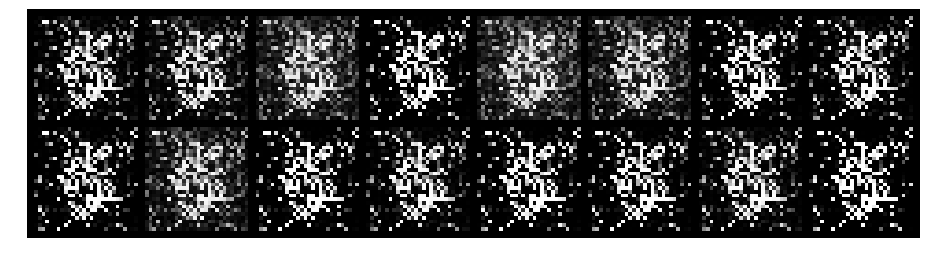

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 0.1777, Generator Loss: 6.4642
D(x): 0.9664, D(G(z)): 0.0737
1 min	 46.005139112472534 sec


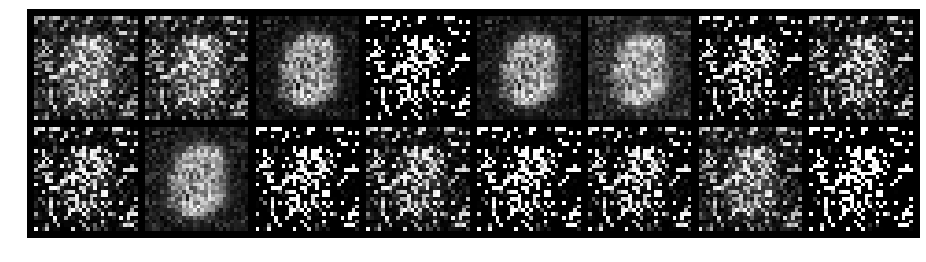

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.2415, Generator Loss: 6.7753
D(x): 0.8890, D(G(z)): 0.0700
2 min	 3.056135416030884 sec


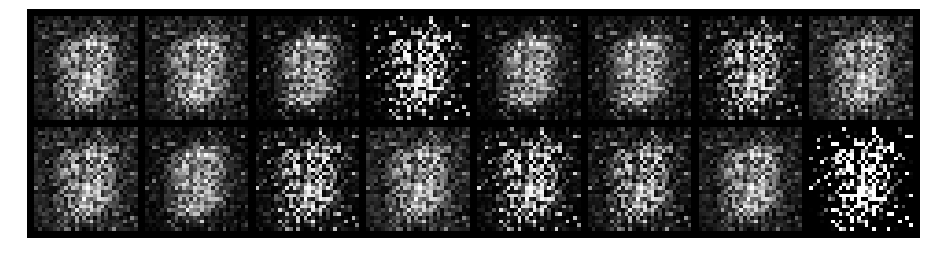

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.9234, Generator Loss: 4.0935
D(x): 0.7442, D(G(z)): 0.2983
2 min	 19.994537353515625 sec


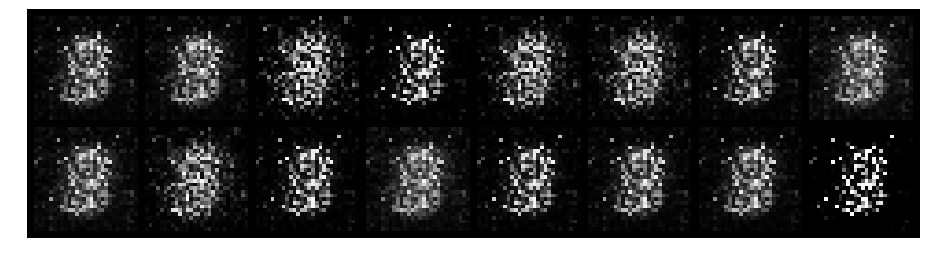

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 0.3095, Generator Loss: 5.2602
D(x): 0.8766, D(G(z)): 0.0633
2 min	 36.739500999450684 sec


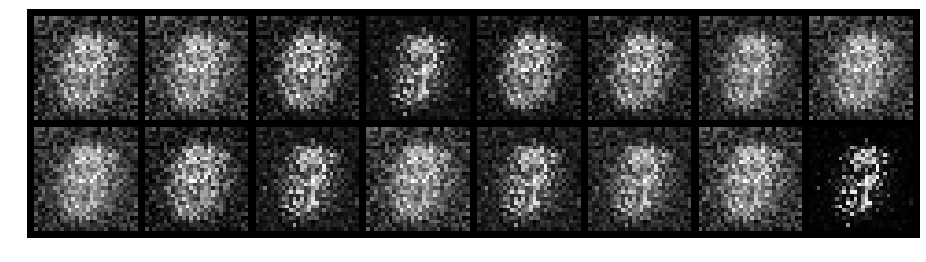

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 0.2197, Generator Loss: 5.6637
D(x): 0.9243, D(G(z)): 0.0945
2 min	 54.207632541656494 sec


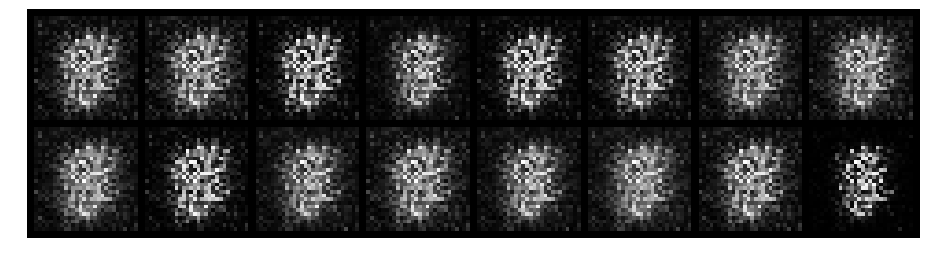

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 0.5569, Generator Loss: 4.1732
D(x): 0.8173, D(G(z)): 0.1953
3 min	 12.27642011642456 sec


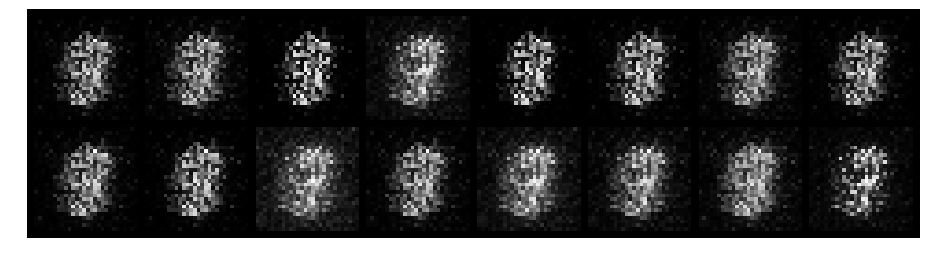

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 1.1644, Generator Loss: 1.8211
D(x): 0.7505, D(G(z)): 0.4741
3 min	 29.943447828292847 sec


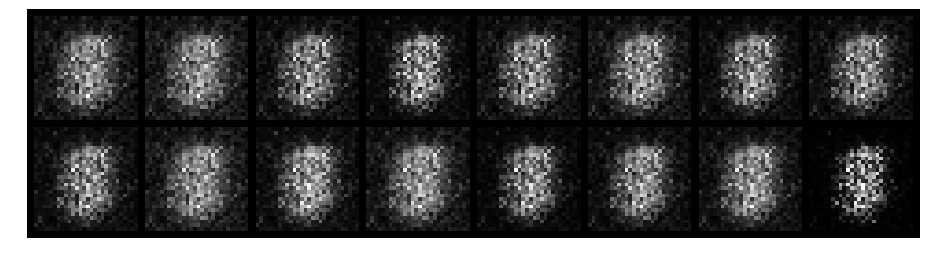

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 0.4730, Generator Loss: 3.3244
D(x): 0.8047, D(G(z)): 0.1359
3 min	 46.79505109786987 sec


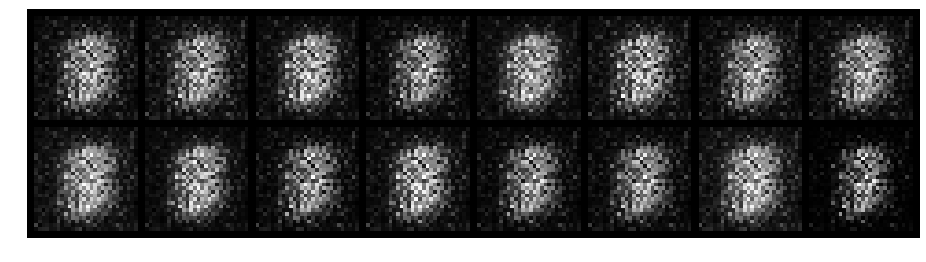

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.9244, Generator Loss: 2.2571
D(x): 0.7329, D(G(z)): 0.3043
4 min	 3.2731666564941406 sec


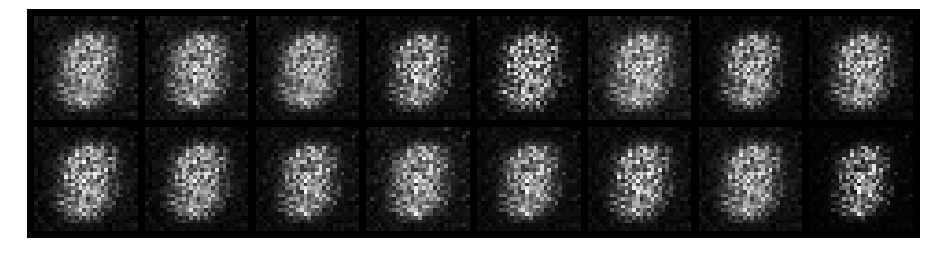

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 2.2992, Generator Loss: 1.5394
D(x): 0.5222, D(G(z)): 0.5791
4 min	 19.948192358016968 sec


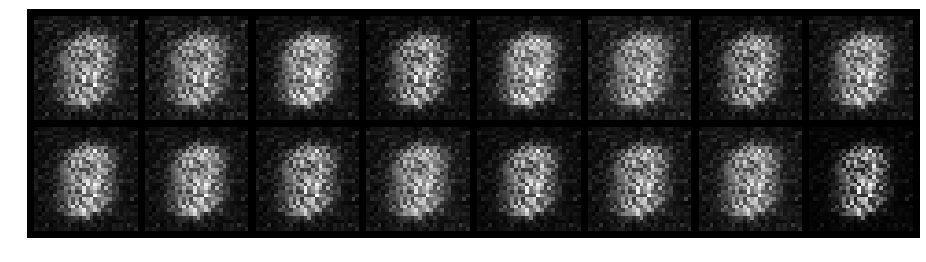

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 1.5413, Generator Loss: 1.2781
D(x): 0.6839, D(G(z)): 0.5735
4 min	 36.305779218673706 sec


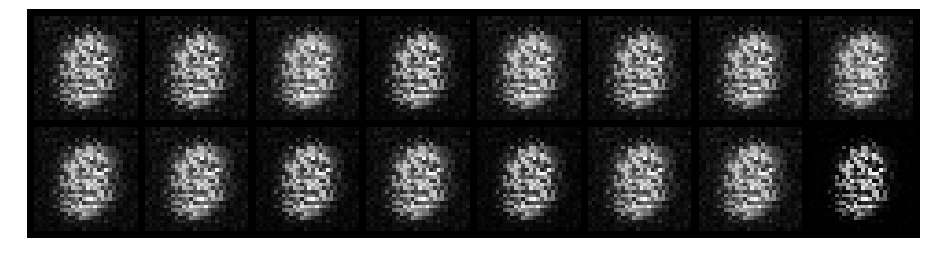

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 0.4126, Generator Loss: 3.1835
D(x): 0.8457, D(G(z)): 0.1708
4 min	 53.03139853477478 sec


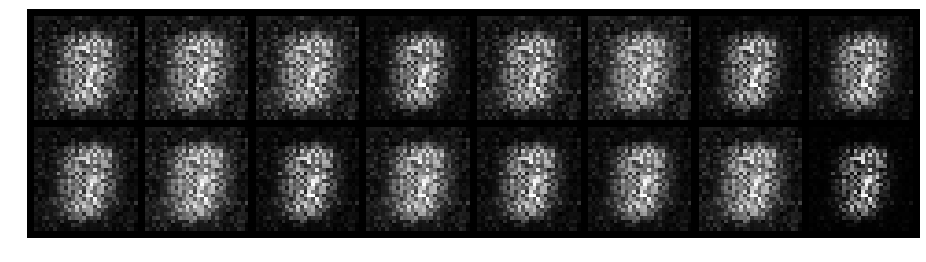

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.6719, Generator Loss: 2.2574
D(x): 0.8211, D(G(z)): 0.3024
5 min	 9.550681829452515 sec


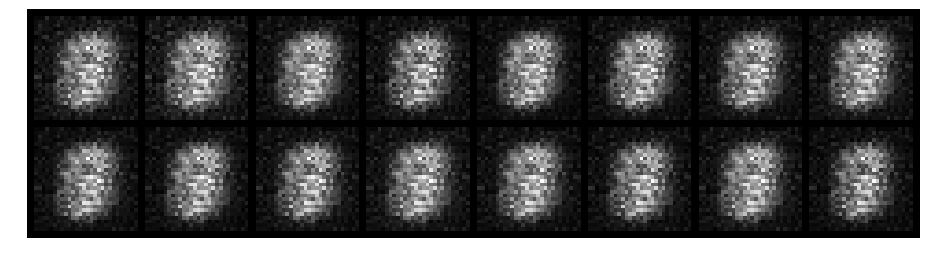

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.9853, Generator Loss: 1.1233
D(x): 0.6918, D(G(z)): 0.3204
5 min	 26.694429874420166 sec


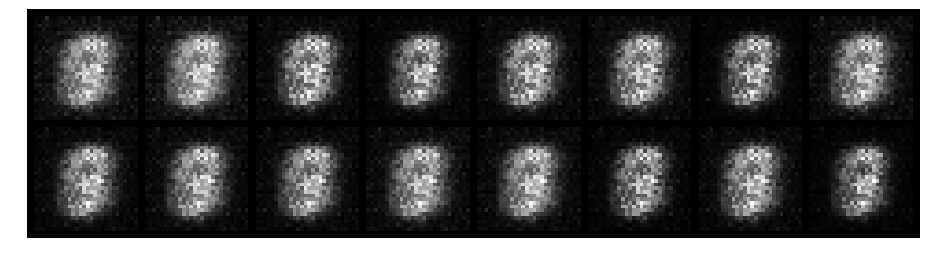

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 1.6665, Generator Loss: 1.3113
D(x): 0.6030, D(G(z)): 0.4211
5 min	 44.89267373085022 sec


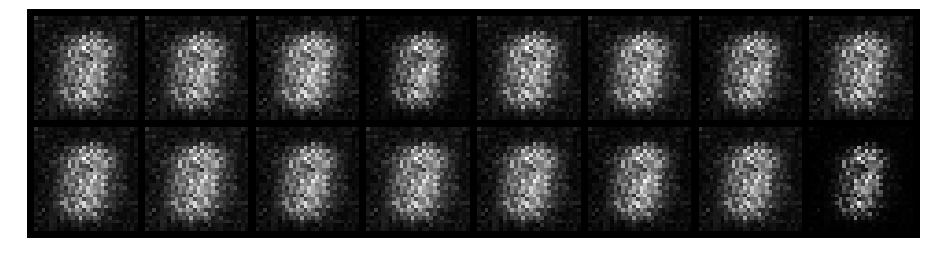

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.6708, Generator Loss: 1.6877
D(x): 0.7288, D(G(z)): 0.2418
6 min	 1.3459877967834473 sec


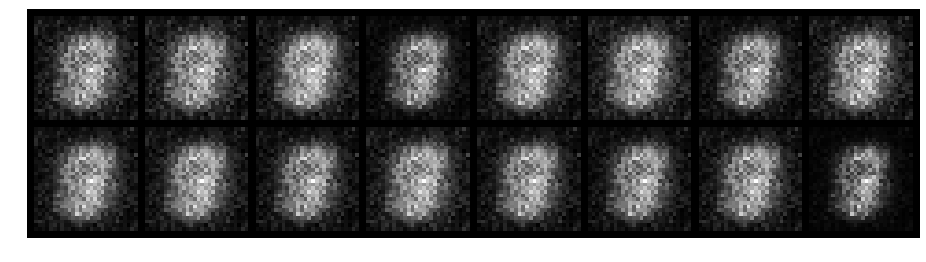

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.5721, Generator Loss: 2.9129
D(x): 0.8360, D(G(z)): 0.2276
6 min	 18.625638961791992 sec


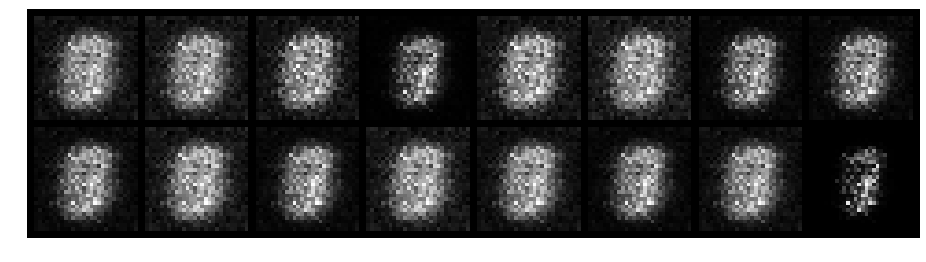

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.2961, Generator Loss: 3.1510
D(x): 0.8953, D(G(z)): 0.1130
6 min	 35.05167555809021 sec


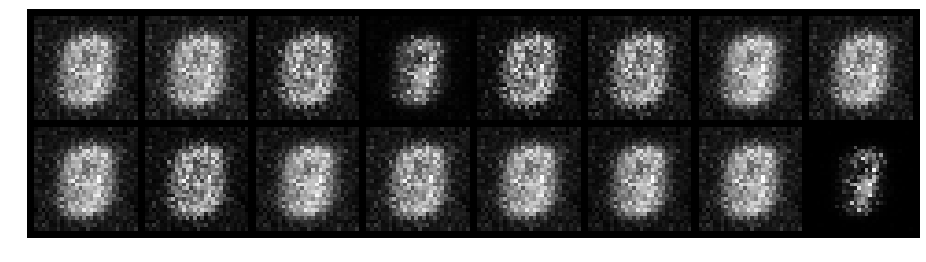

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.5918, Generator Loss: 3.3576
D(x): 0.7873, D(G(z)): 0.1328
6 min	 51.08041262626648 sec


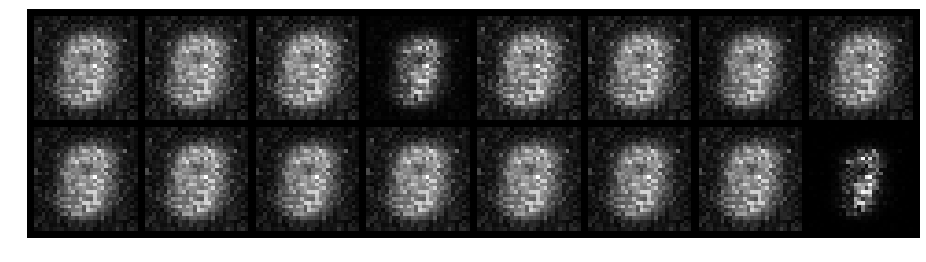

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.3633, Generator Loss: 2.3242
D(x): 0.9176, D(G(z)): 0.2055
7 min	 7.396336078643799 sec


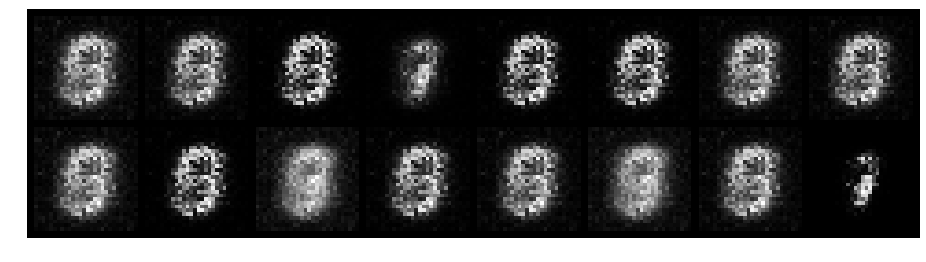

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.9771, Generator Loss: 2.1657
D(x): 0.6939, D(G(z)): 0.2247
7 min	 23.621491193771362 sec


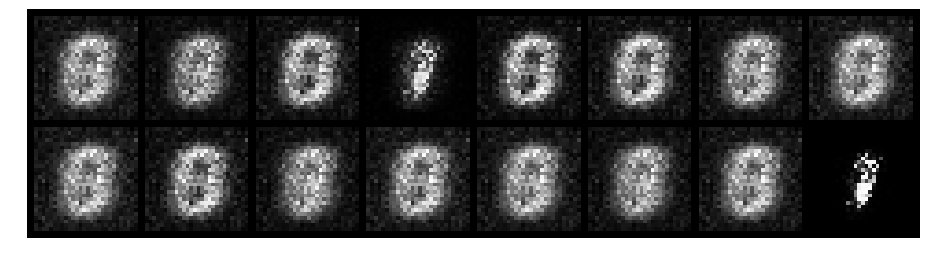

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.4392, Generator Loss: 3.7545
D(x): 0.8577, D(G(z)): 0.1171
7 min	 40.02520775794983 sec


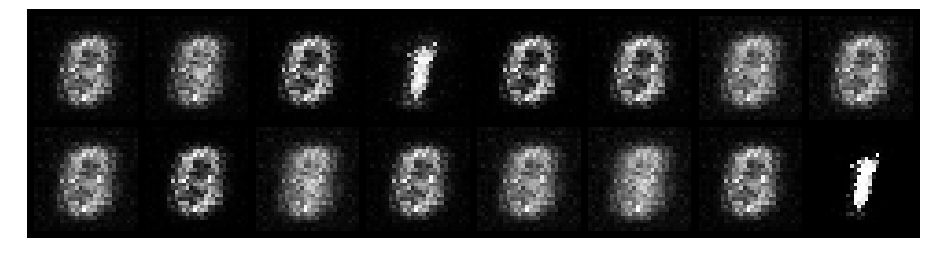

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.4677, Generator Loss: 3.3566
D(x): 0.8762, D(G(z)): 0.1234
7 min	 56.460169315338135 sec


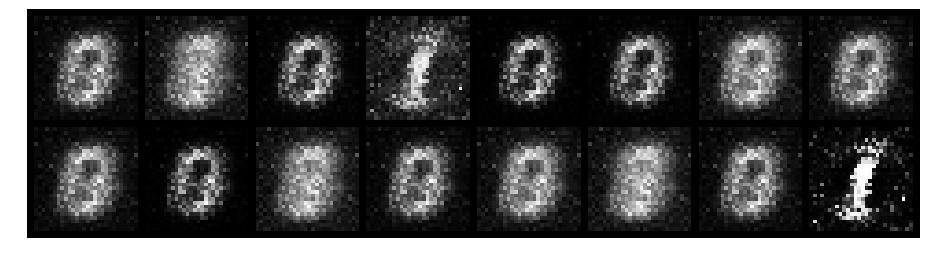

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.3190, Generator Loss: 3.8536
D(x): 0.9392, D(G(z)): 0.1279
8 min	 12.570252180099487 sec


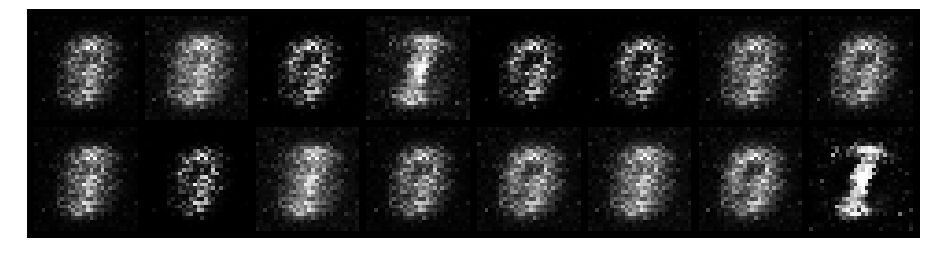

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.2715, Generator Loss: 3.8976
D(x): 0.9040, D(G(z)): 0.0761
8 min	 28.57369613647461 sec


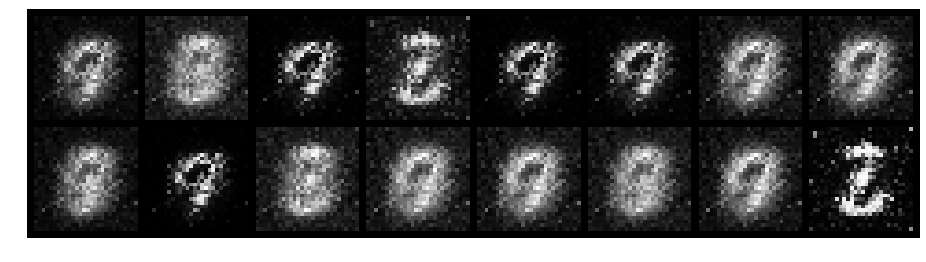

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.3889, Generator Loss: 2.7733
D(x): 0.8576, D(G(z)): 0.1398
8 min	 44.77305817604065 sec


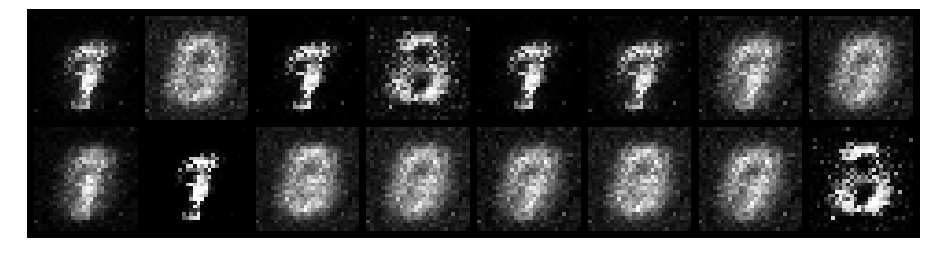

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.5171, Generator Loss: 2.8963
D(x): 0.8528, D(G(z)): 0.1837
9 min	 1.4237816333770752 sec


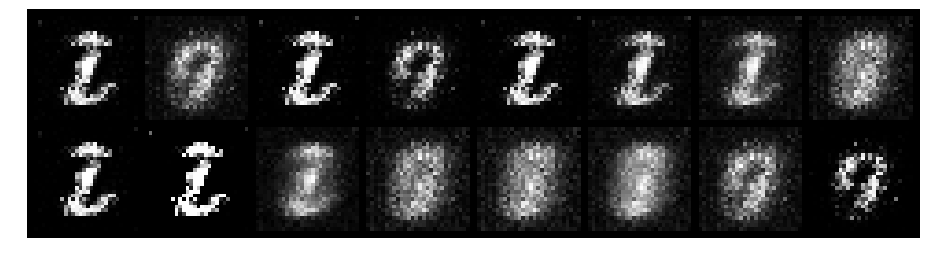

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.4677, Generator Loss: 3.1396
D(x): 0.8672, D(G(z)): 0.1551
9 min	 17.963400840759277 sec


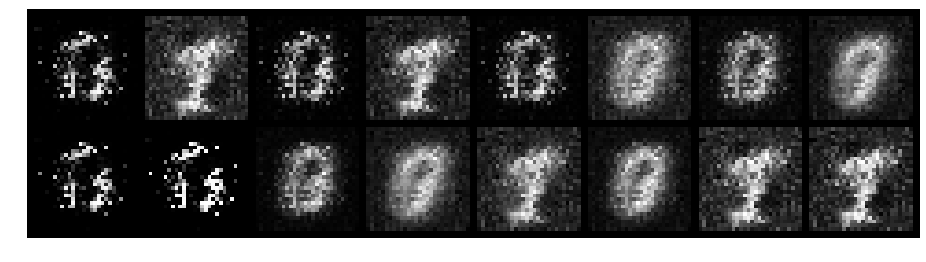

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.5280, Generator Loss: 2.7316
D(x): 0.8268, D(G(z)): 0.1493
9 min	 34.061580419540405 sec


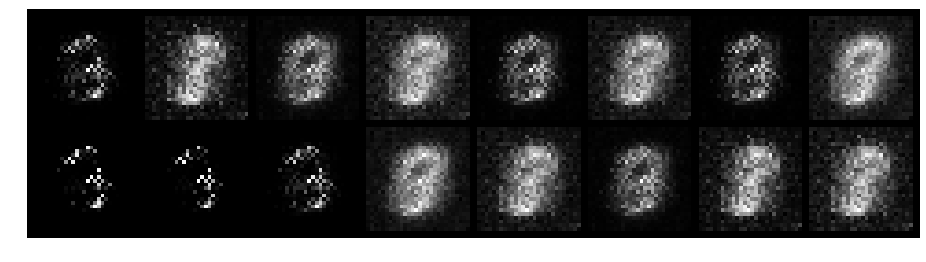

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.4202, Generator Loss: 2.7323
D(x): 0.8814, D(G(z)): 0.1619
9 min	 49.9444944858551 sec


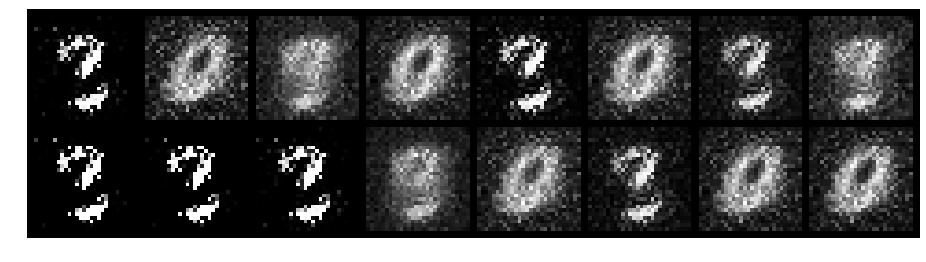

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.7348, Generator Loss: 3.5803
D(x): 0.7884, D(G(z)): 0.1021
10 min	 6.664163112640381 sec


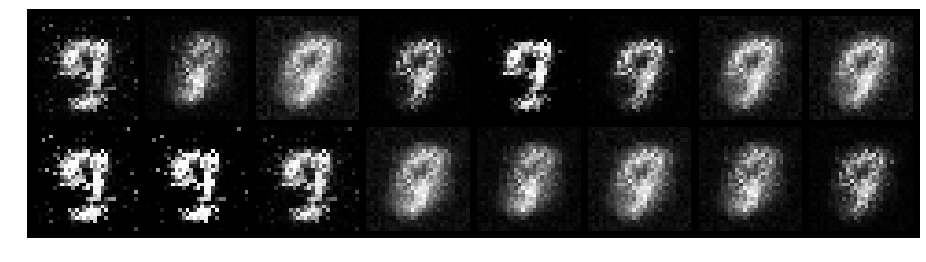

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.8218, Generator Loss: 1.7892
D(x): 0.7795, D(G(z)): 0.2778
10 min	 25.39114236831665 sec


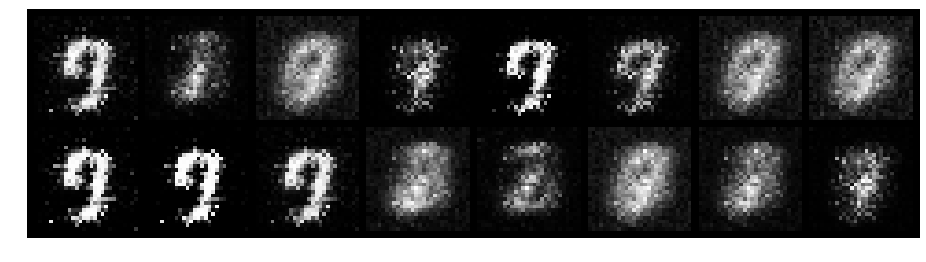

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.4297, Generator Loss: 2.6528
D(x): 0.8568, D(G(z)): 0.1196
10 min	 42.169832944869995 sec


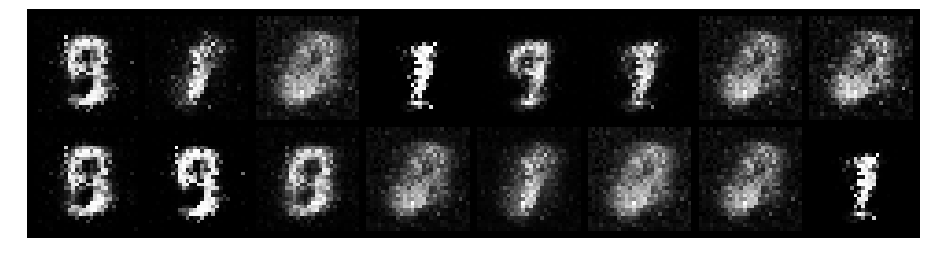

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.4099, Generator Loss: 3.5604
D(x): 0.9003, D(G(z)): 0.1760
10 min	 58.7441725730896 sec


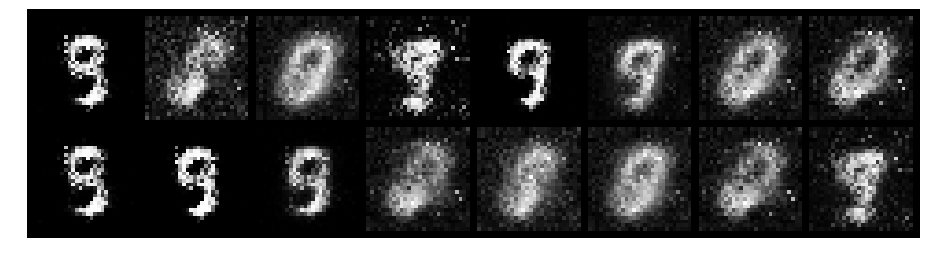

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.4958, Generator Loss: 2.2623
D(x): 0.8283, D(G(z)): 0.1114
11 min	 16.821888208389282 sec


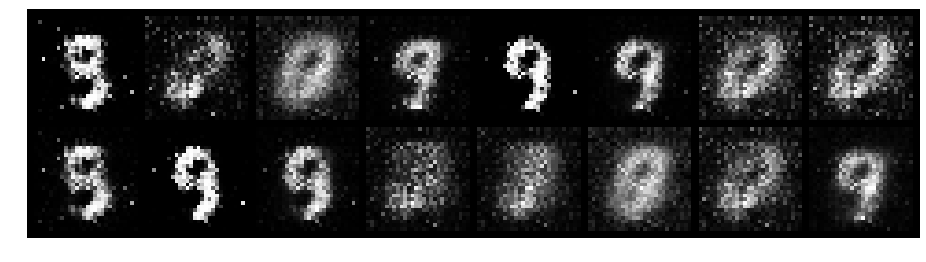

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.2888, Generator Loss: 3.2176
D(x): 0.9232, D(G(z)): 0.1331
11 min	 34.076740026474 sec


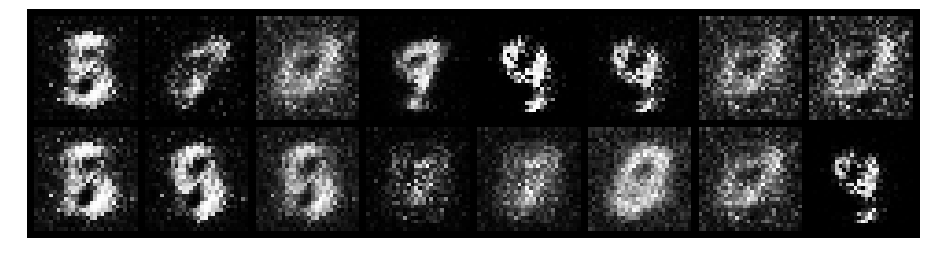

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.2923, Generator Loss: 2.7520
D(x): 0.9059, D(G(z)): 0.0995
11 min	 50.84997344017029 sec


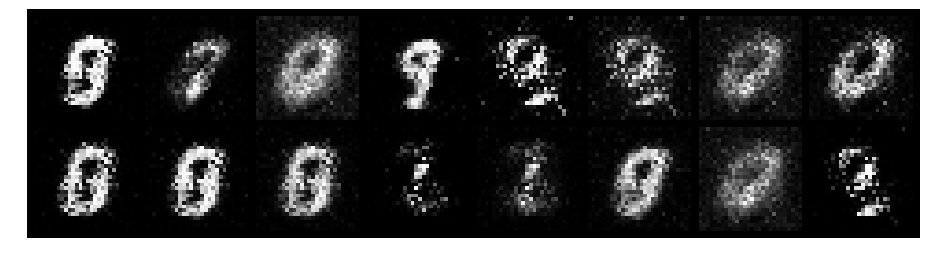

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.4419, Generator Loss: 4.1397
D(x): 0.8623, D(G(z)): 0.1342
12 min	 7.586010217666626 sec


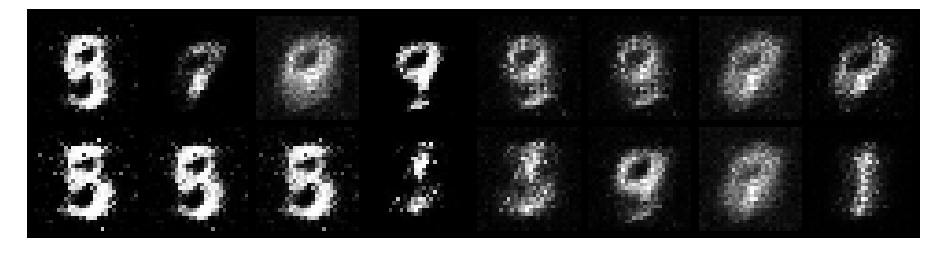

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.5293, Generator Loss: 2.2047
D(x): 0.8907, D(G(z)): 0.2457
12 min	 24.546732902526855 sec


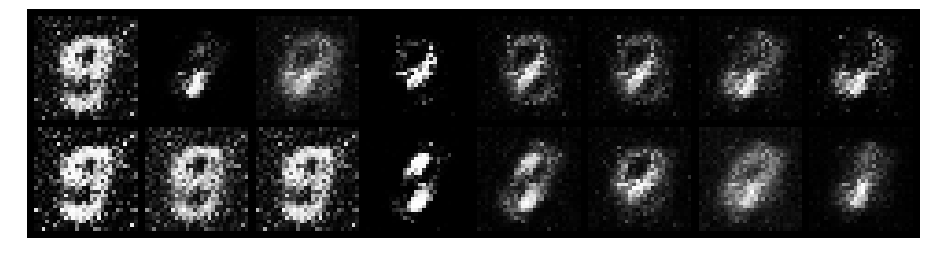

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.4449, Generator Loss: 2.9437
D(x): 0.8925, D(G(z)): 0.1349
12 min	 42.80945587158203 sec


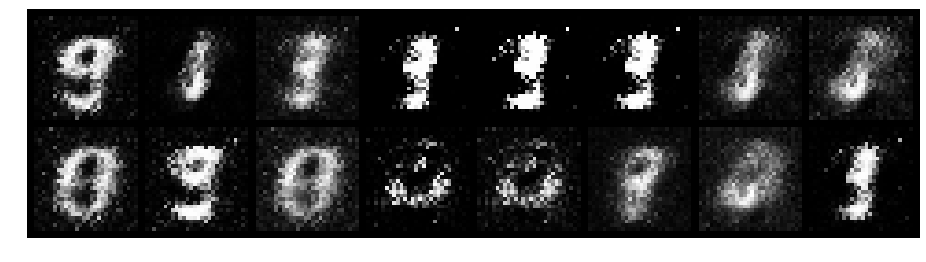

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.6749, Generator Loss: 2.9834
D(x): 0.7491, D(G(z)): 0.1447
12 min	 59.62881898880005 sec


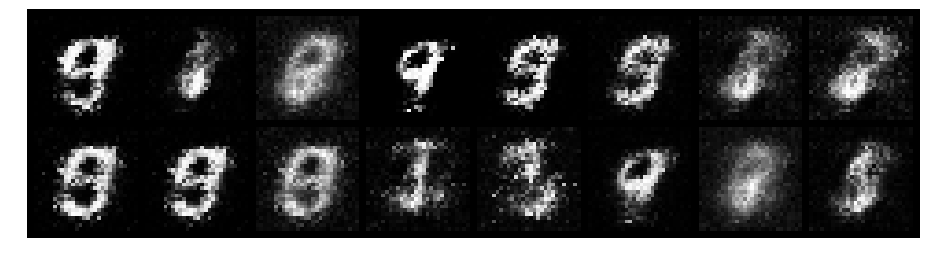

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.4923, Generator Loss: 2.2773
D(x): 0.8235, D(G(z)): 0.1260
13 min	 19.821479082107544 sec


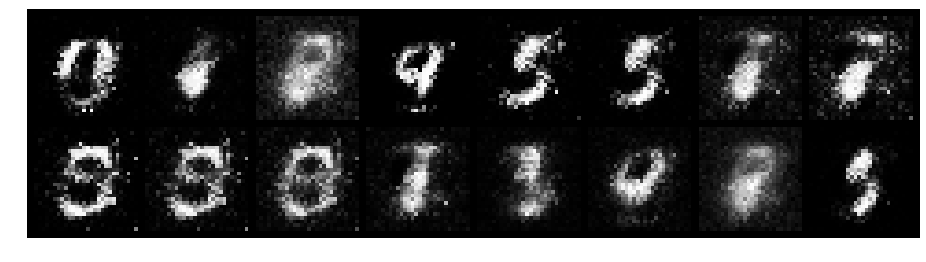

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.5044, Generator Loss: 2.1431
D(x): 0.8478, D(G(z)): 0.1568
13 min	 42.93309950828552 sec


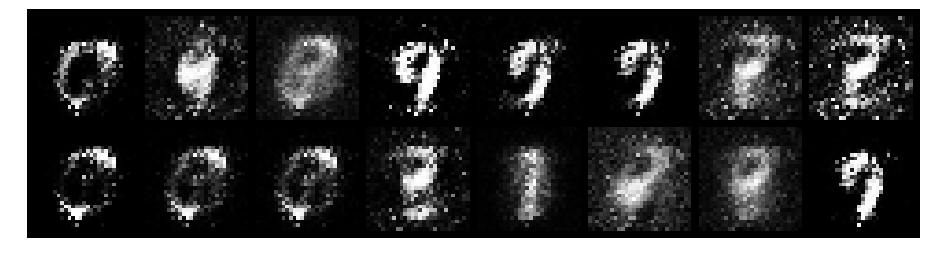

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.6276, Generator Loss: 2.5949
D(x): 0.7832, D(G(z)): 0.1107
14 min	 0.27326226234436035 sec


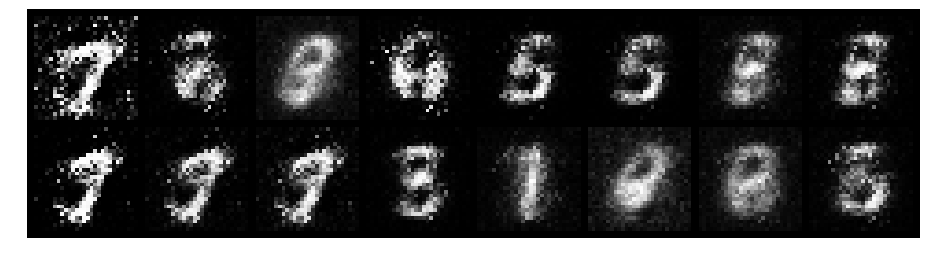

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.7298, Generator Loss: 2.5970
D(x): 0.7096, D(G(z)): 0.1567
14 min	 17.51869010925293 sec


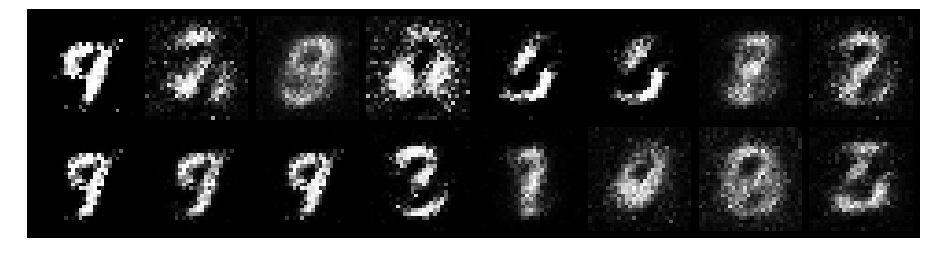

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.5099, Generator Loss: 2.6420
D(x): 0.8406, D(G(z)): 0.1474
14 min	 34.27357316017151 sec


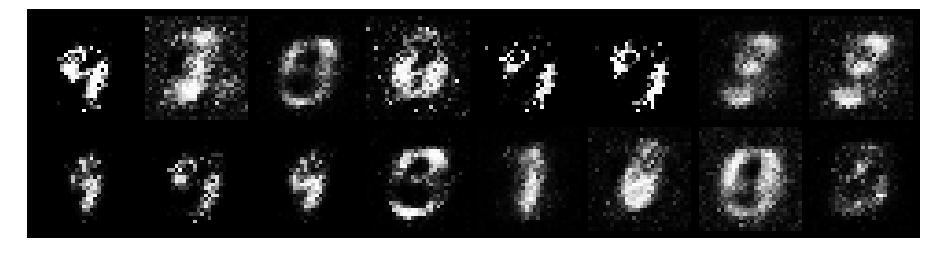

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.3905, Generator Loss: 2.9801
D(x): 0.8620, D(G(z)): 0.1231
14 min	 50.994232416152954 sec


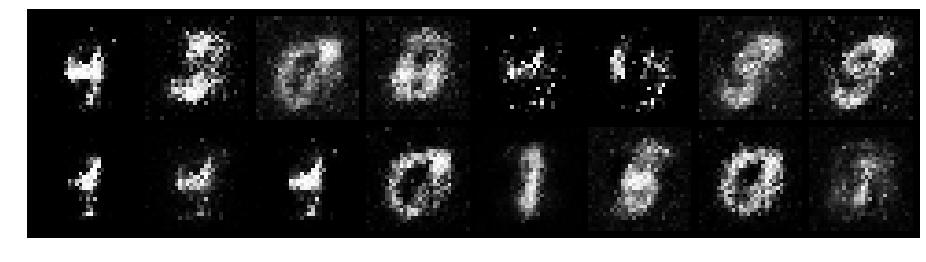

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.7304, Generator Loss: 2.8627
D(x): 0.7462, D(G(z)): 0.1282
15 min	 9.246539831161499 sec


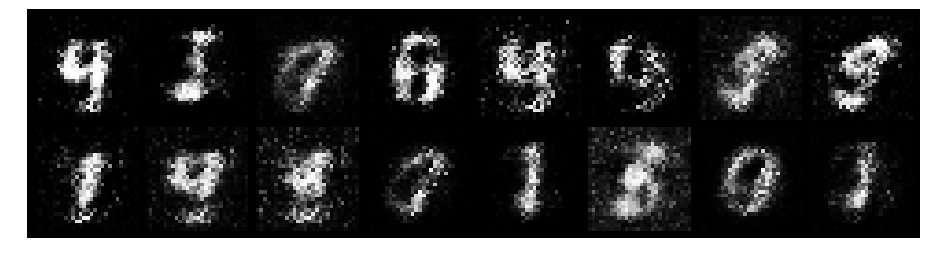

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.5063, Generator Loss: 2.9630
D(x): 0.8386, D(G(z)): 0.1466
15 min	 26.388302326202393 sec


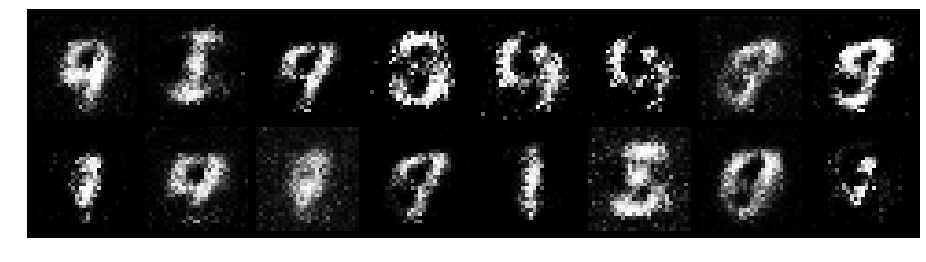

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.3746, Generator Loss: 3.3761
D(x): 0.8520, D(G(z)): 0.1239
15 min	 43.84949016571045 sec


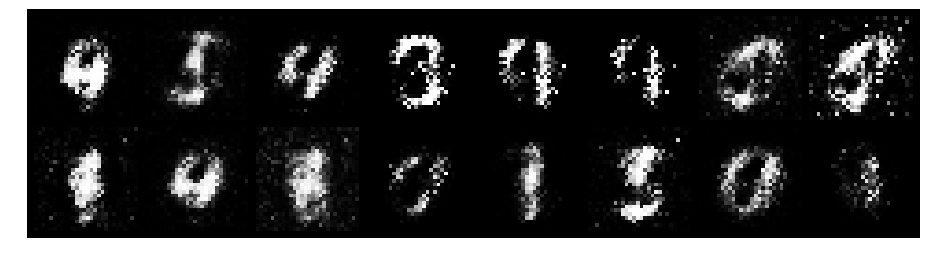

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.4984, Generator Loss: 2.8246
D(x): 0.8360, D(G(z)): 0.1529
16 min	 1.5036239624023438 sec


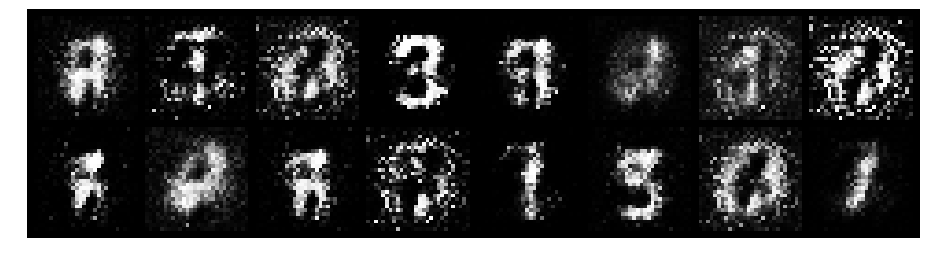

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.3849, Generator Loss: 3.4893
D(x): 0.8838, D(G(z)): 0.1105
16 min	 20.770248651504517 sec


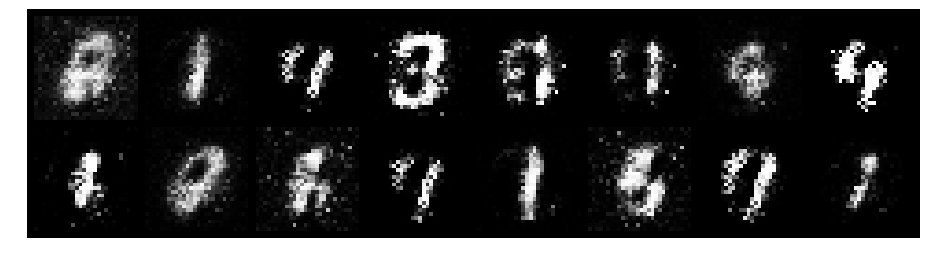

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.4257, Generator Loss: 2.8415
D(x): 0.8243, D(G(z)): 0.1084
16 min	 37.05542016029358 sec


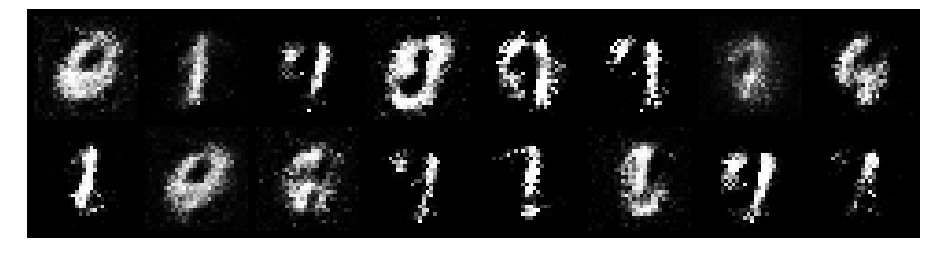

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.7595, Generator Loss: 2.0942
D(x): 0.7358, D(G(z)): 0.1444
16 min	 53.16599941253662 sec


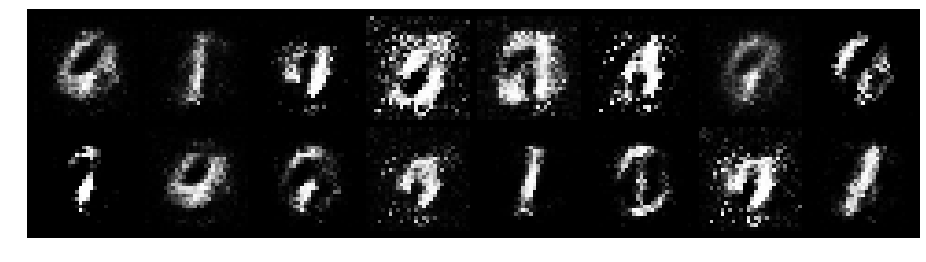

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.6583, Generator Loss: 2.3318
D(x): 0.7581, D(G(z)): 0.2003
17 min	 11.103843927383423 sec


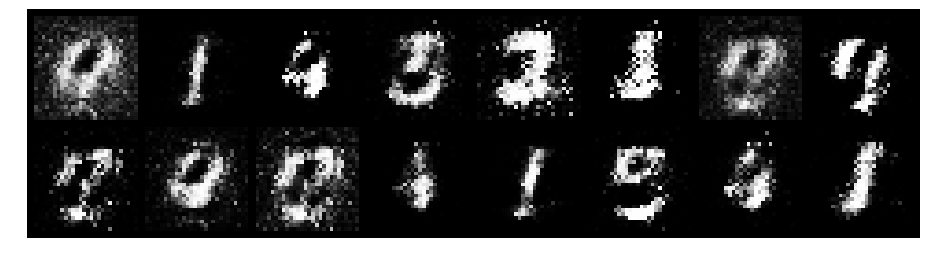

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.7333, Generator Loss: 2.4430
D(x): 0.7865, D(G(z)): 0.2202
17 min	 27.195573091506958 sec


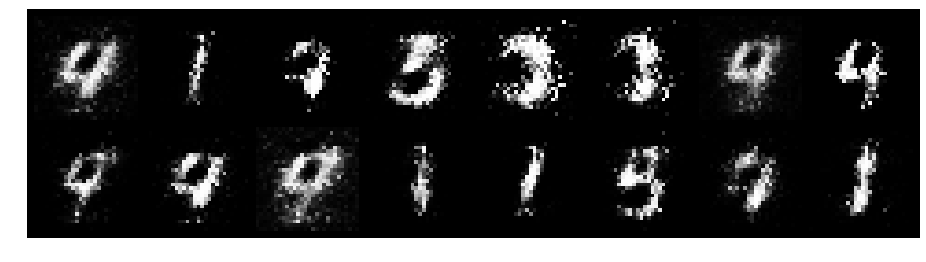

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.6315, Generator Loss: 2.9941
D(x): 0.7444, D(G(z)): 0.0902
17 min	 44.240121364593506 sec


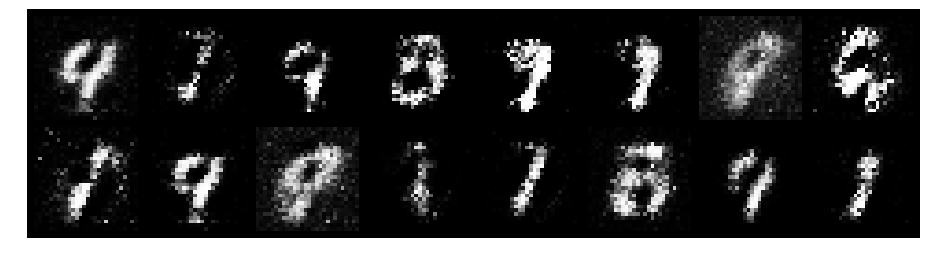

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.5259, Generator Loss: 2.3798
D(x): 0.7977, D(G(z)): 0.1174
18 min	 2.6987645626068115 sec


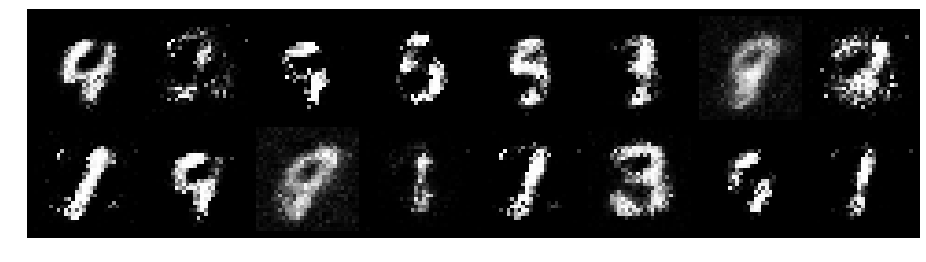

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.4978, Generator Loss: 2.9178
D(x): 0.8340, D(G(z)): 0.1206
18 min	 19.077678442001343 sec


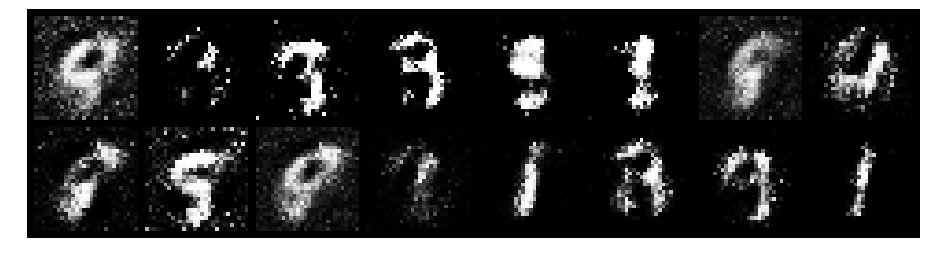

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.7032, Generator Loss: 2.0142
D(x): 0.7745, D(G(z)): 0.1595
18 min	 35.075666666030884 sec


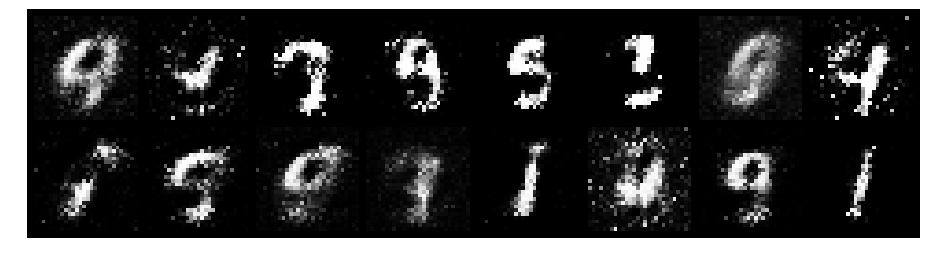

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.5735, Generator Loss: 3.0667
D(x): 0.8807, D(G(z)): 0.2441
18 min	 55.00792574882507 sec


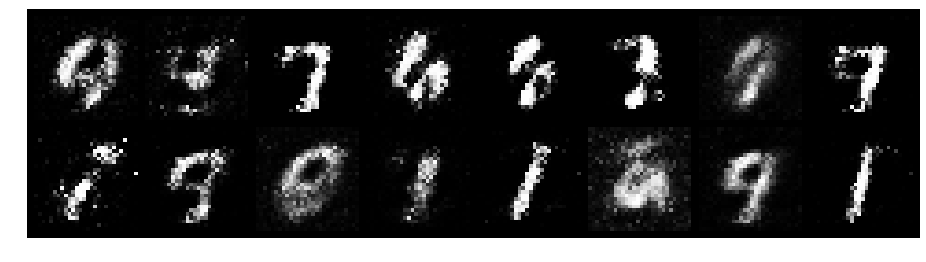

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.5903, Generator Loss: 2.6451
D(x): 0.8106, D(G(z)): 0.1762
19 min	 12.884265422821045 sec


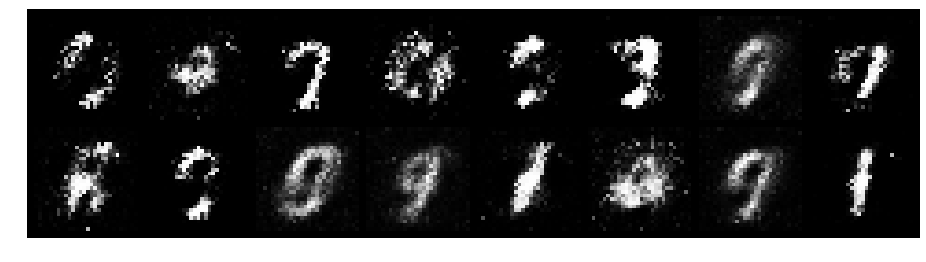

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.6730, Generator Loss: 2.6034
D(x): 0.7906, D(G(z)): 0.1858
19 min	 29.671388864517212 sec


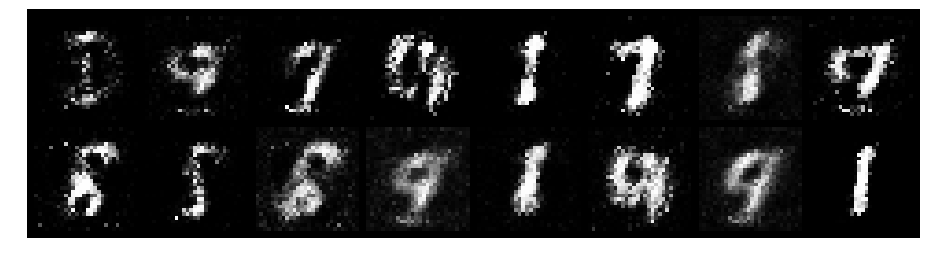

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.6713, Generator Loss: 2.2075
D(x): 0.8642, D(G(z)): 0.2659
19 min	 46.24473547935486 sec


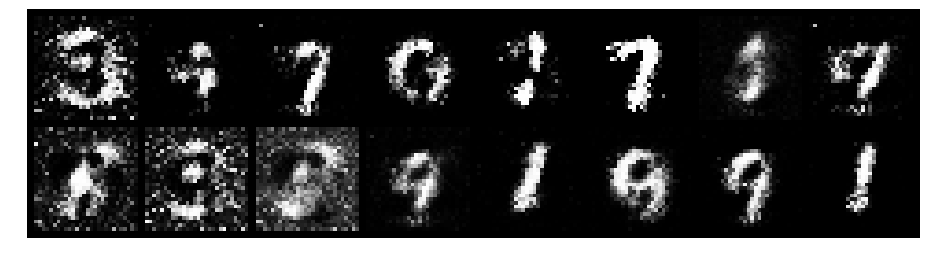

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.6776, Generator Loss: 1.9638
D(x): 0.7557, D(G(z)): 0.1672
20 min	 2.555203676223755 sec


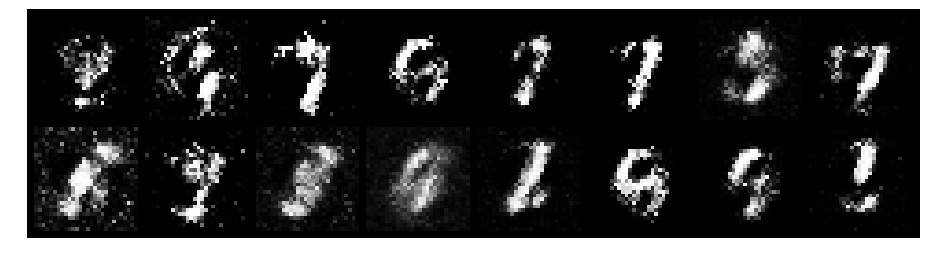

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.4486, Generator Loss: 2.6644
D(x): 0.8498, D(G(z)): 0.1587
20 min	 21.971622943878174 sec


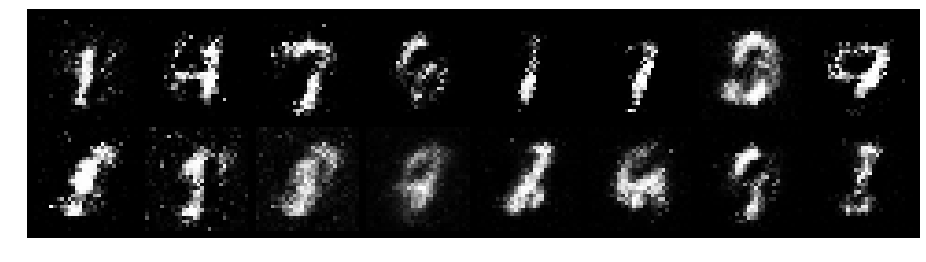

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.7088, Generator Loss: 3.3120
D(x): 0.7468, D(G(z)): 0.1555
20 min	 40.36033082008362 sec


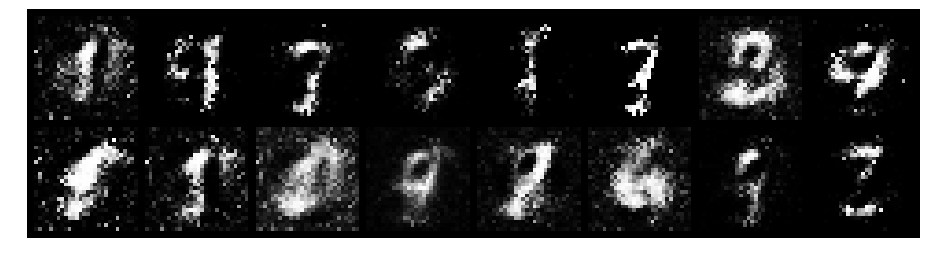

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.7163, Generator Loss: 3.0333
D(x): 0.7917, D(G(z)): 0.2157
21 min	 0.7776782512664795 sec


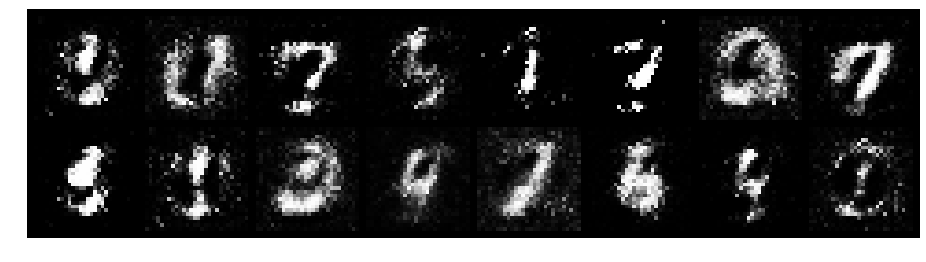

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.8843, Generator Loss: 1.8020
D(x): 0.7386, D(G(z)): 0.2589
21 min	 19.49920082092285 sec


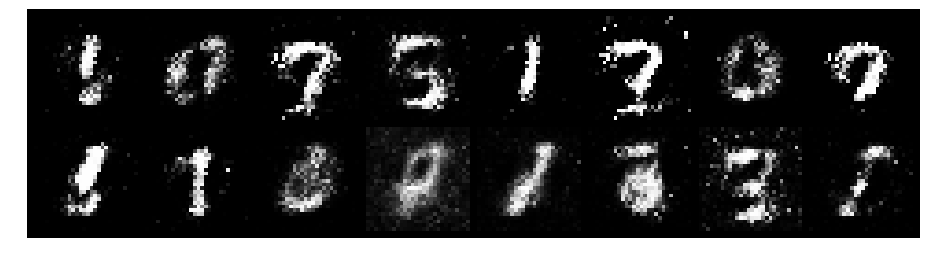

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.5484, Generator Loss: 2.6553
D(x): 0.7960, D(G(z)): 0.1700
21 min	 36.68014907836914 sec


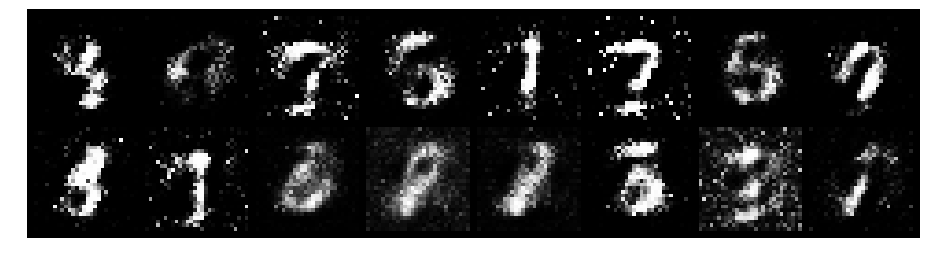

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.6370, Generator Loss: 2.2518
D(x): 0.8217, D(G(z)): 0.2301
21 min	 52.50602436065674 sec


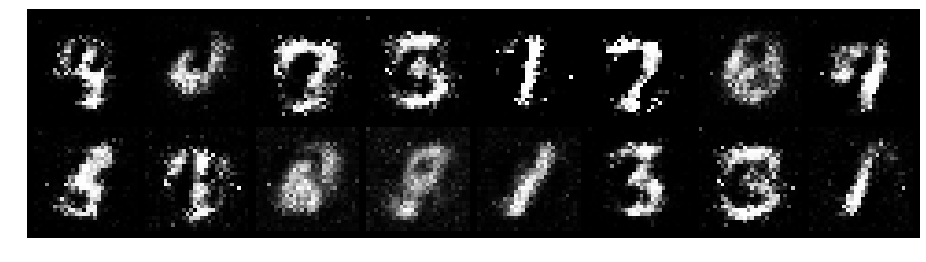

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.5860, Generator Loss: 2.1906
D(x): 0.8381, D(G(z)): 0.2313
22 min	 10.32433009147644 sec


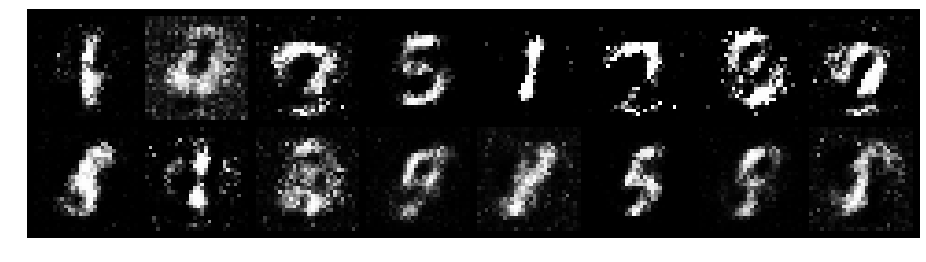

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.8731, Generator Loss: 1.9246
D(x): 0.6888, D(G(z)): 0.2438
22 min	 27.95961356163025 sec


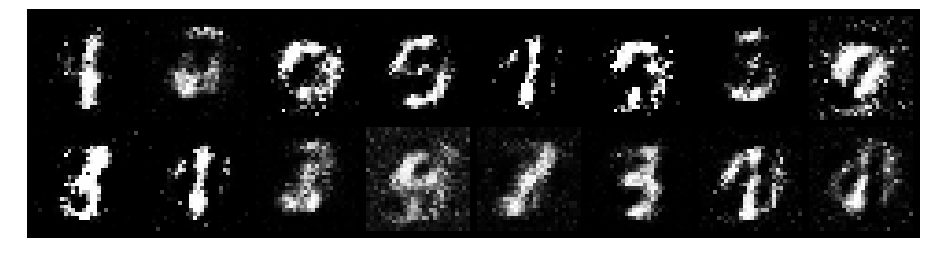

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.7233, Generator Loss: 2.2120
D(x): 0.7168, D(G(z)): 0.1879
22 min	 44.08953666687012 sec


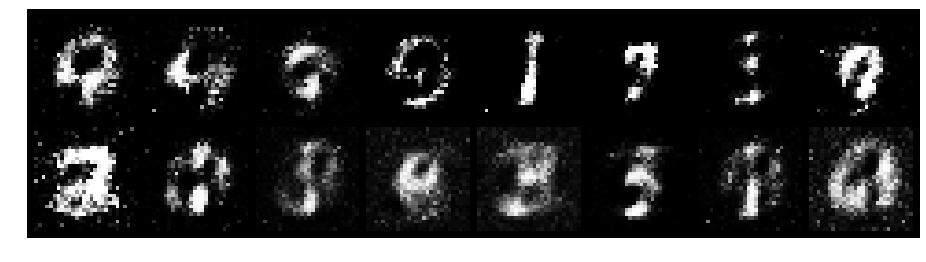

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.8691, Generator Loss: 1.4133
D(x): 0.7793, D(G(z)): 0.2941
23 min	 0.9332046508789062 sec


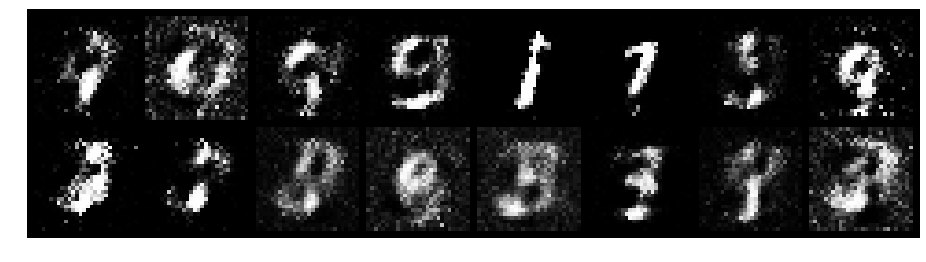

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.6595, Generator Loss: 2.1616
D(x): 0.8262, D(G(z)): 0.2579
23 min	 16.857784509658813 sec


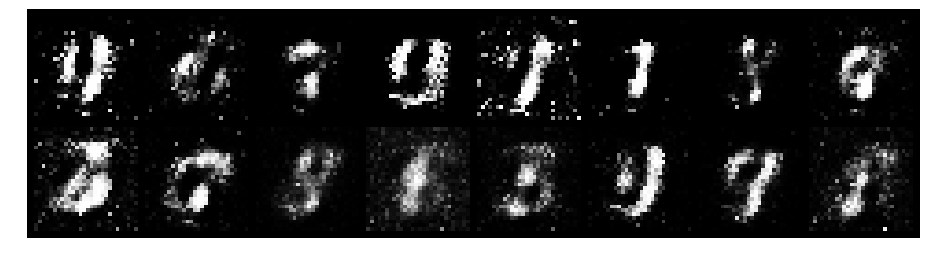

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.6730, Generator Loss: 1.7705
D(x): 0.7511, D(G(z)): 0.2342
23 min	 34.0064914226532 sec


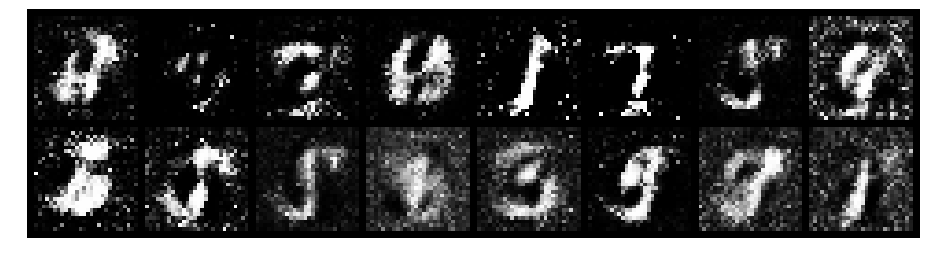

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.9261, Generator Loss: 1.8697
D(x): 0.6956, D(G(z)): 0.2739
23 min	 49.8313729763031 sec


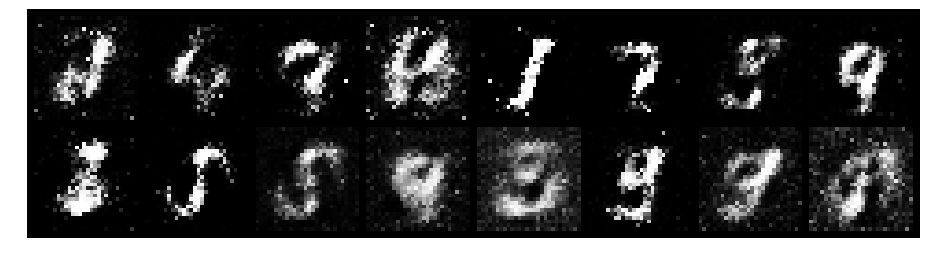

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.6771, Generator Loss: 1.4556
D(x): 0.7682, D(G(z)): 0.2438
24 min	 6.825328826904297 sec


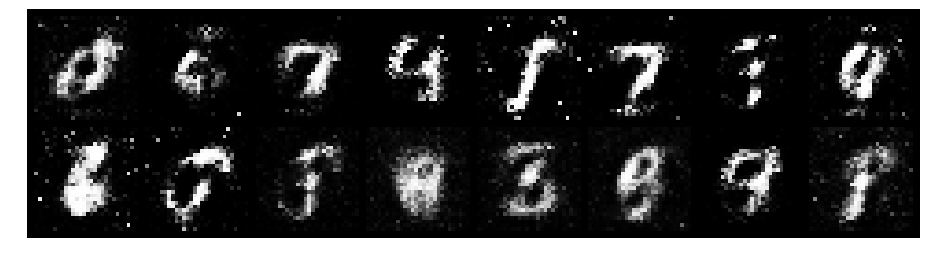

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.8532, Generator Loss: 1.5104
D(x): 0.6919, D(G(z)): 0.2483
24 min	 23.405620574951172 sec


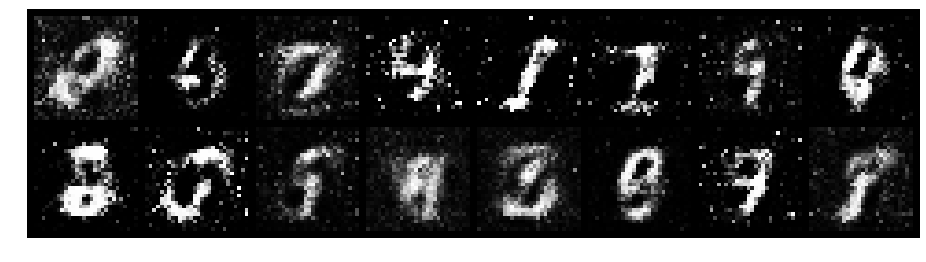

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 1.0632, Generator Loss: 1.8760
D(x): 0.7921, D(G(z)): 0.3657
24 min	 40.24978280067444 sec


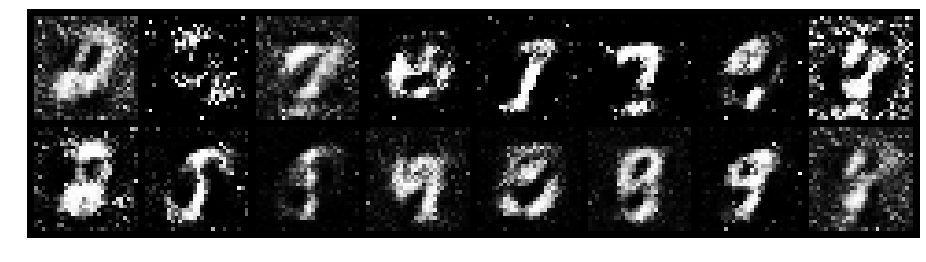

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.8038, Generator Loss: 1.8646
D(x): 0.8054, D(G(z)): 0.3157
24 min	 57.18719434738159 sec


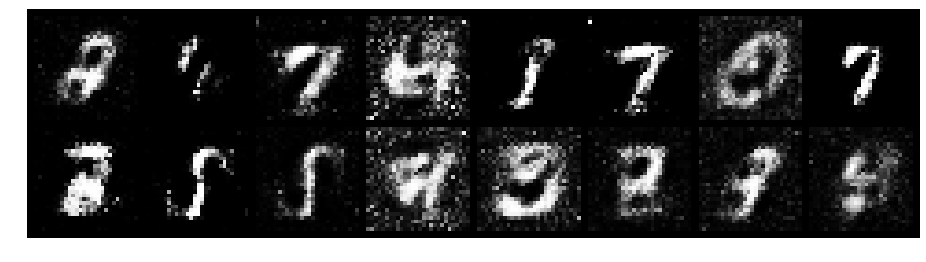

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.7195, Generator Loss: 2.1739
D(x): 0.8135, D(G(z)): 0.2591
25 min	 13.455996990203857 sec


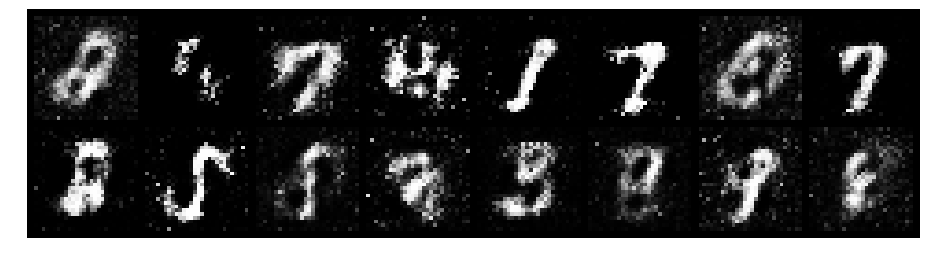

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.7647, Generator Loss: 2.3081
D(x): 0.7308, D(G(z)): 0.2042
25 min	 30.503522157669067 sec


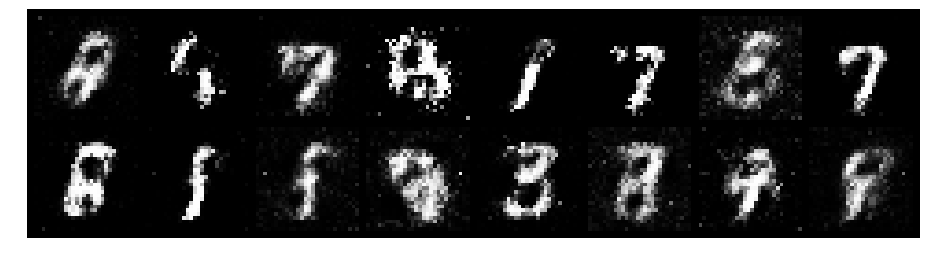

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.5010, Generator Loss: 2.5644
D(x): 0.8177, D(G(z)): 0.1498
25 min	 46.565491914749146 sec


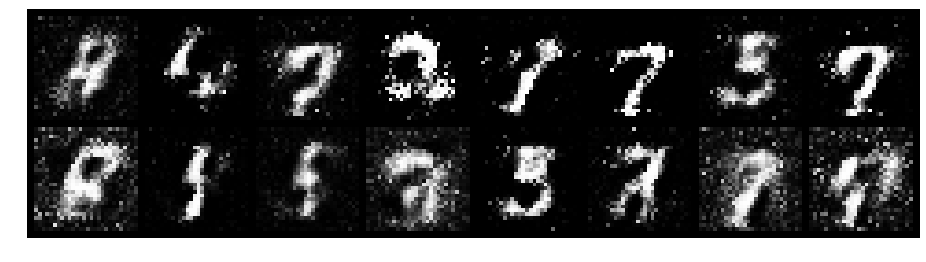

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.8189, Generator Loss: 1.9259
D(x): 0.7409, D(G(z)): 0.2671
26 min	 3.831751585006714 sec


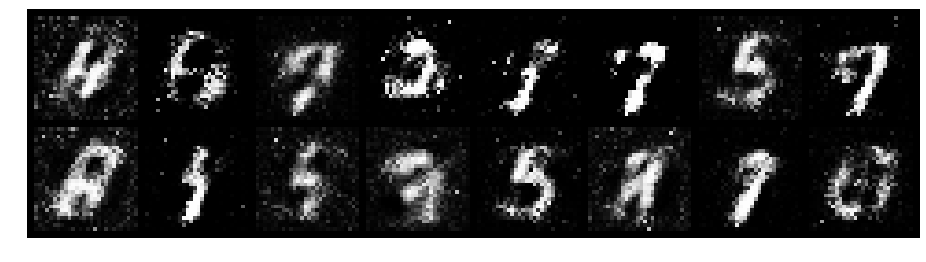

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.6803, Generator Loss: 1.9617
D(x): 0.8054, D(G(z)): 0.2530
26 min	 20.922433376312256 sec


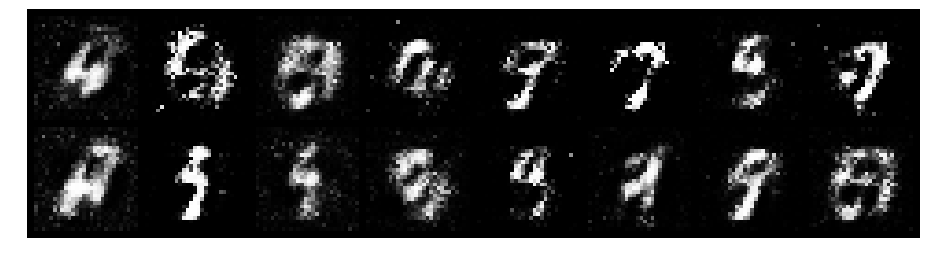

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.8411, Generator Loss: 1.9215
D(x): 0.7304, D(G(z)): 0.2886
26 min	 37.652013540267944 sec


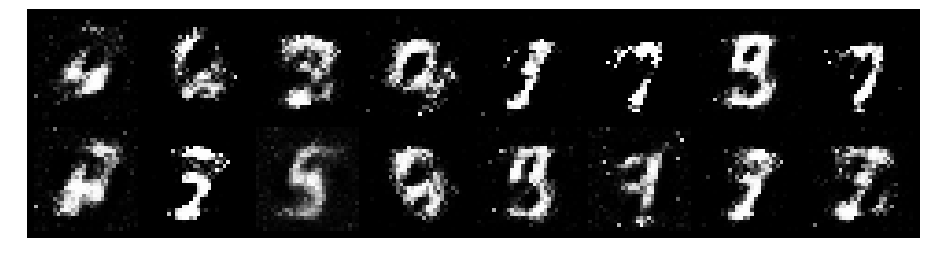

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.8954, Generator Loss: 1.9311
D(x): 0.7106, D(G(z)): 0.2320
26 min	 54.13856101036072 sec


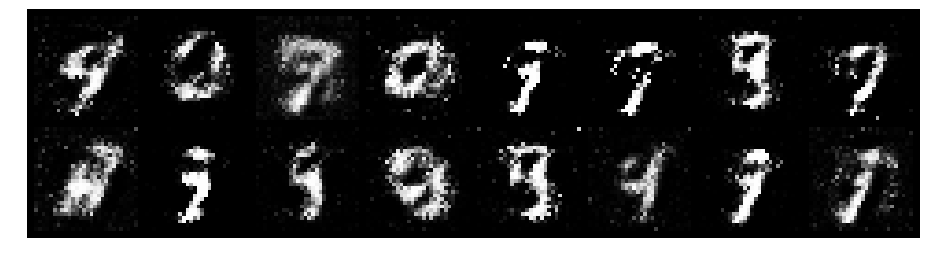

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 1.0054, Generator Loss: 1.4560
D(x): 0.6994, D(G(z)): 0.3364
27 min	 10.126628160476685 sec


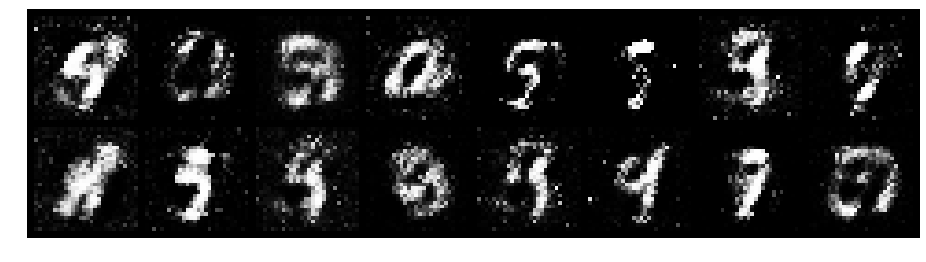

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.7859, Generator Loss: 2.1446
D(x): 0.7274, D(G(z)): 0.2385
27 min	 27.01294994354248 sec


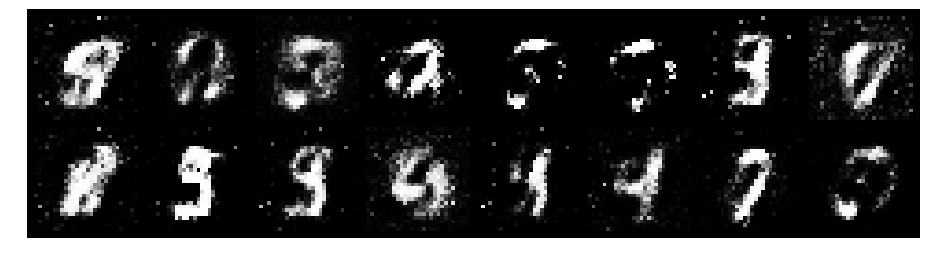

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.9257, Generator Loss: 2.0514
D(x): 0.7090, D(G(z)): 0.2708
27 min	 43.03722548484802 sec


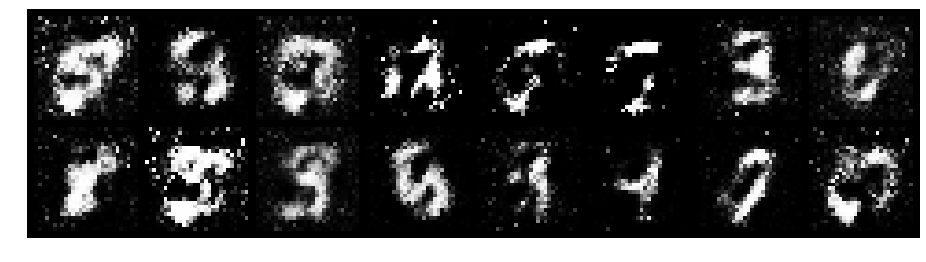

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.8267, Generator Loss: 1.7965
D(x): 0.7469, D(G(z)): 0.2770
28 min	 0.6219196319580078 sec


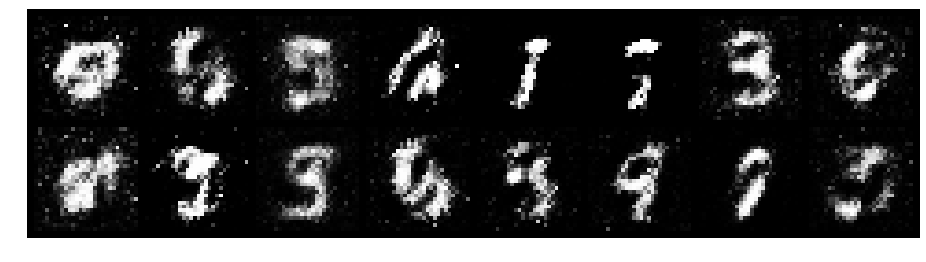

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.8129, Generator Loss: 1.4871
D(x): 0.7636, D(G(z)): 0.2849
28 min	 17.77161693572998 sec


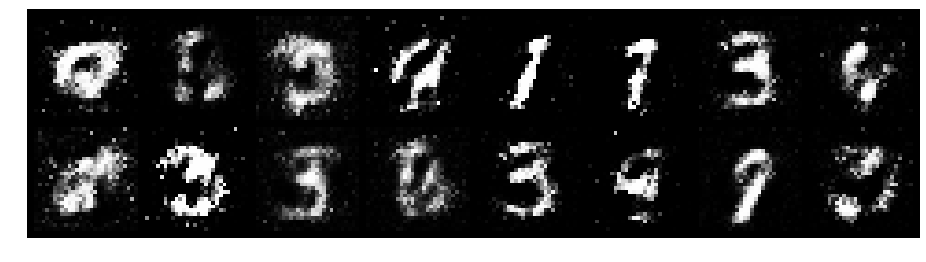

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.8597, Generator Loss: 1.7035
D(x): 0.7716, D(G(z)): 0.3267
28 min	 34.43225979804993 sec


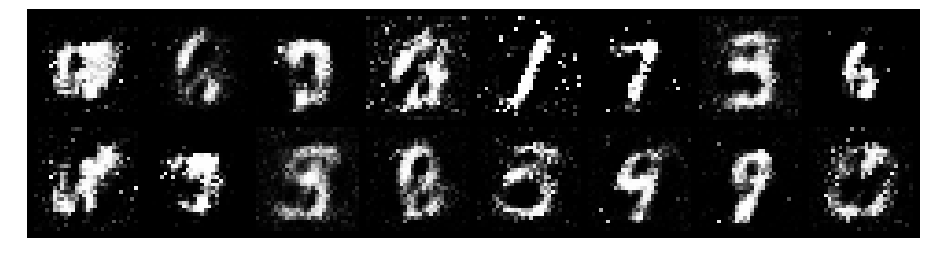

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.7885, Generator Loss: 1.6283
D(x): 0.7743, D(G(z)): 0.3013
28 min	 50.209527015686035 sec


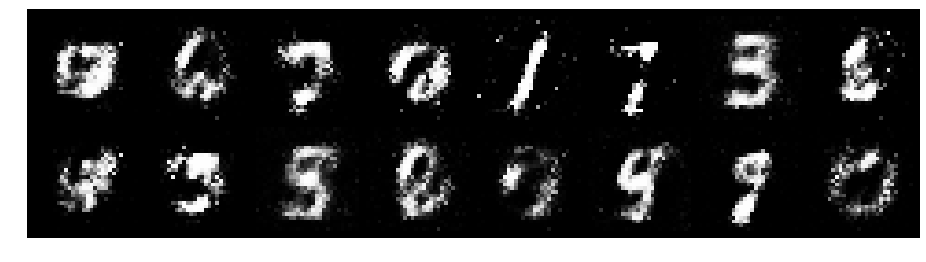

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.6945, Generator Loss: 2.2808
D(x): 0.7677, D(G(z)): 0.2329
29 min	 6.892489910125732 sec


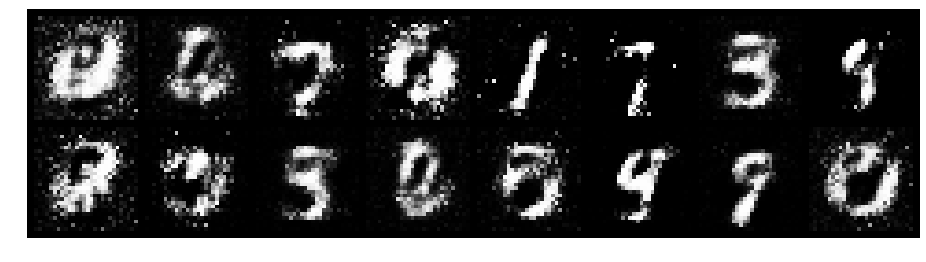

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.9811, Generator Loss: 1.6500
D(x): 0.7268, D(G(z)): 0.3162
29 min	 22.674715995788574 sec


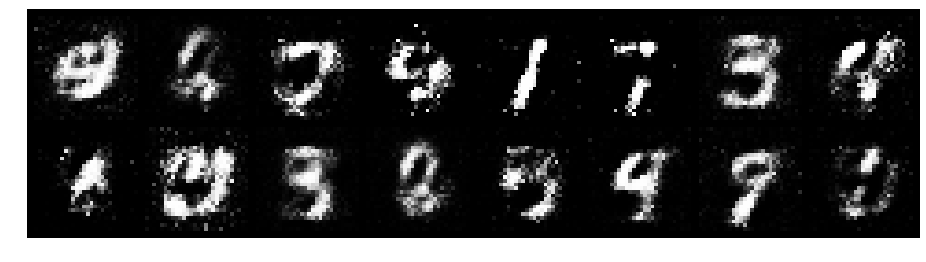

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.9521, Generator Loss: 1.4719
D(x): 0.7543, D(G(z)): 0.3736
29 min	 39.28625559806824 sec


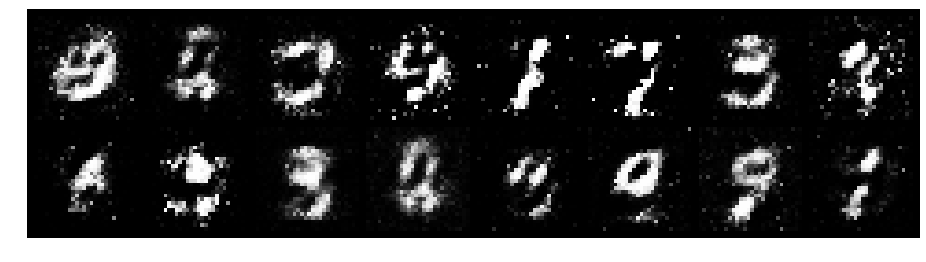

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 1.0183, Generator Loss: 2.3897
D(x): 0.6359, D(G(z)): 0.2510
29 min	 56.4404194355011 sec


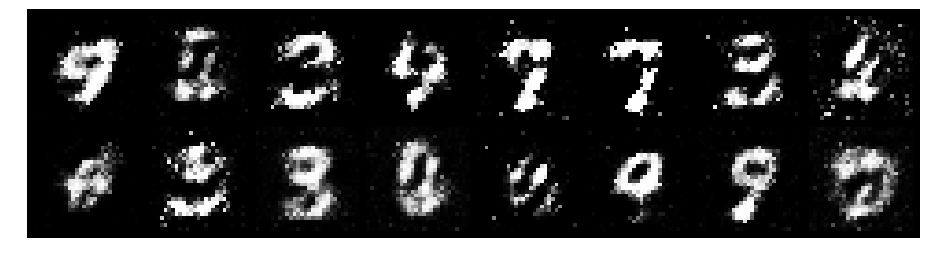

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 0.6532, Generator Loss: 1.9276
D(x): 0.7271, D(G(z)): 0.1566
30 min	 12.782134532928467 sec


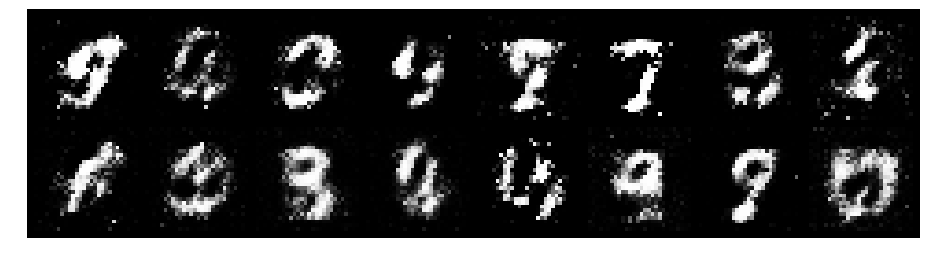

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 0.6705, Generator Loss: 2.2999
D(x): 0.7966, D(G(z)): 0.2434
30 min	 29.7076416015625 sec


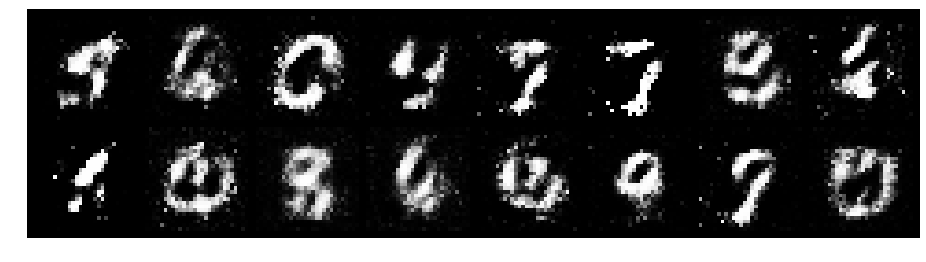

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.8090, Generator Loss: 2.4691
D(x): 0.6970, D(G(z)): 0.1855
30 min	 45.446221113204956 sec


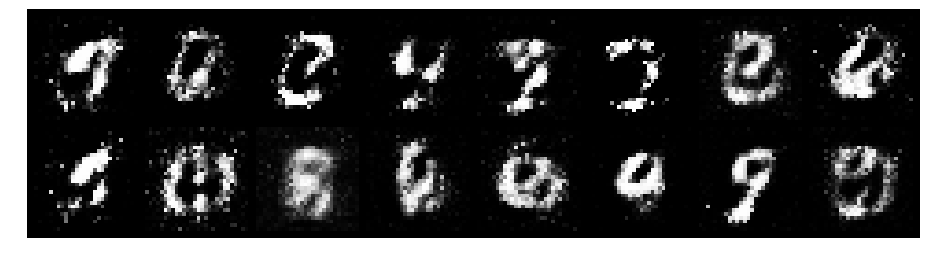

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 0.5086, Generator Loss: 2.1758
D(x): 0.8547, D(G(z)): 0.2183
31 min	 1.8434882164001465 sec


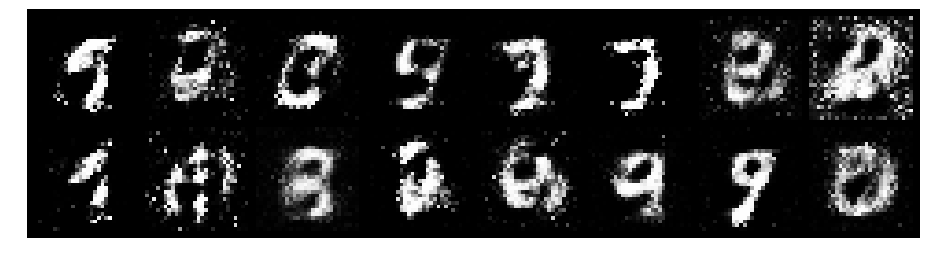

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 0.8827, Generator Loss: 1.8729
D(x): 0.6434, D(G(z)): 0.2535
31 min	 17.86478567123413 sec


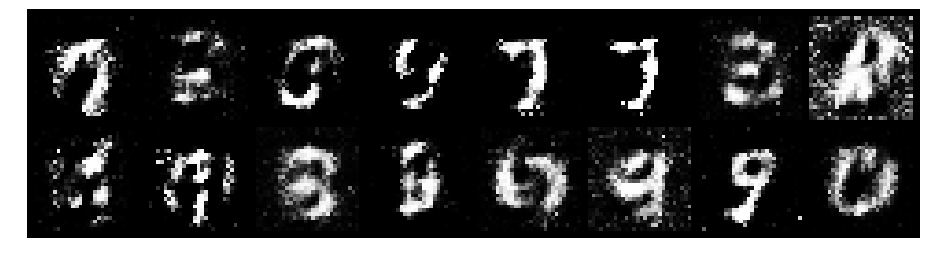

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.8858, Generator Loss: 2.7625
D(x): 0.6600, D(G(z)): 0.2185
31 min	 34.37067675590515 sec


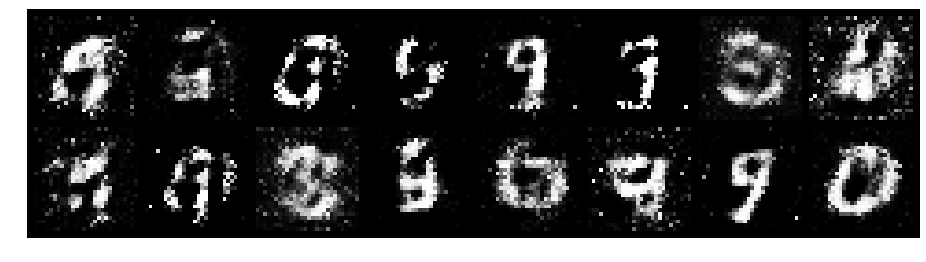

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.6063, Generator Loss: 2.0781
D(x): 0.7403, D(G(z)): 0.1661
31 min	 50.037832498550415 sec


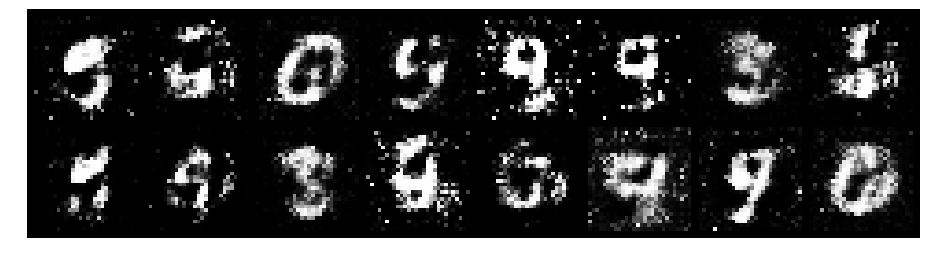

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.8595, Generator Loss: 2.0471
D(x): 0.6988, D(G(z)): 0.2748
32 min	 6.592332601547241 sec


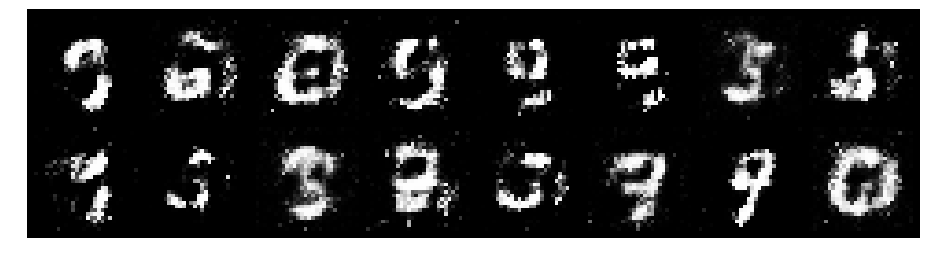

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.9925, Generator Loss: 1.2816
D(x): 0.7111, D(G(z)): 0.3956
32 min	 22.515422344207764 sec


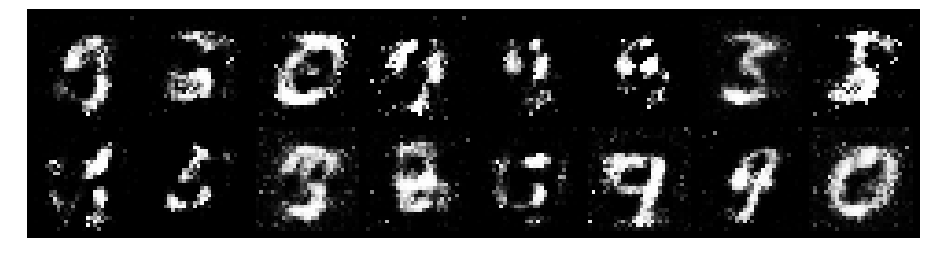

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 1.1074, Generator Loss: 1.3582
D(x): 0.7173, D(G(z)): 0.3637
32 min	 39.02528262138367 sec


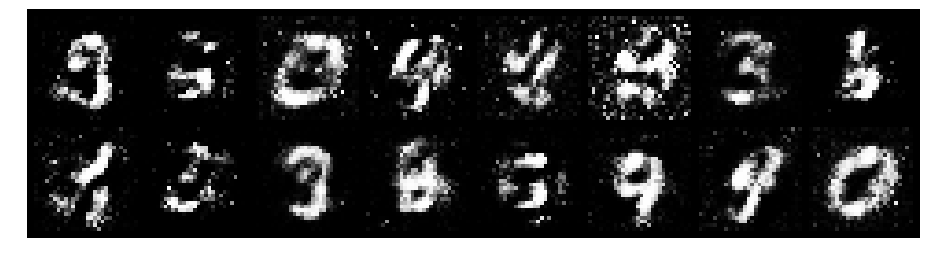

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 1.0571, Generator Loss: 1.5439
D(x): 0.6551, D(G(z)): 0.3082
32 min	 55.31938171386719 sec


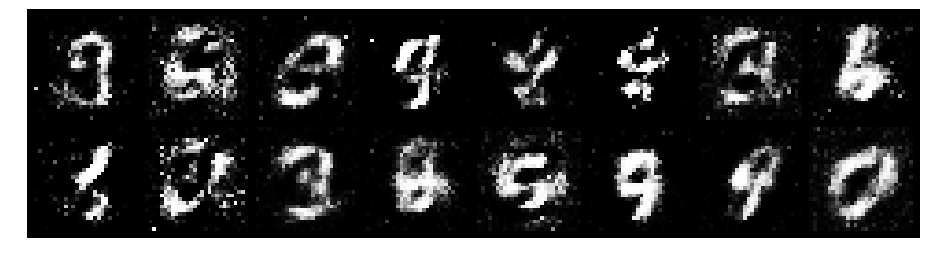

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 1.0784, Generator Loss: 1.2209
D(x): 0.6929, D(G(z)): 0.3656
33 min	 11.22759222984314 sec


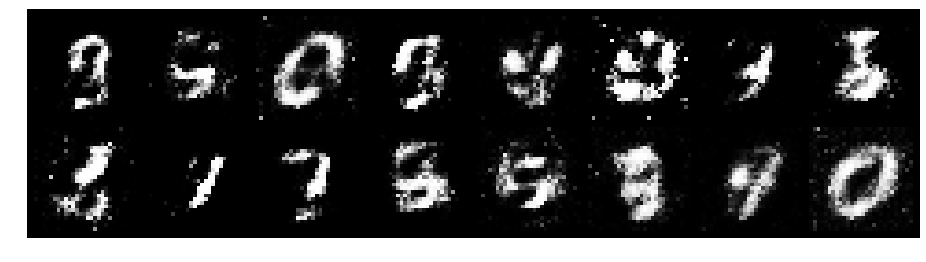

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 1.0177, Generator Loss: 1.8367
D(x): 0.6655, D(G(z)): 0.3237
33 min	 27.649659156799316 sec


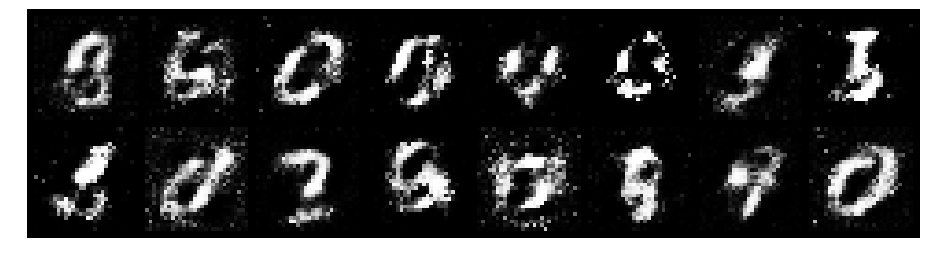

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 1.0053, Generator Loss: 1.3652
D(x): 0.7039, D(G(z)): 0.3720
33 min	 43.33962941169739 sec


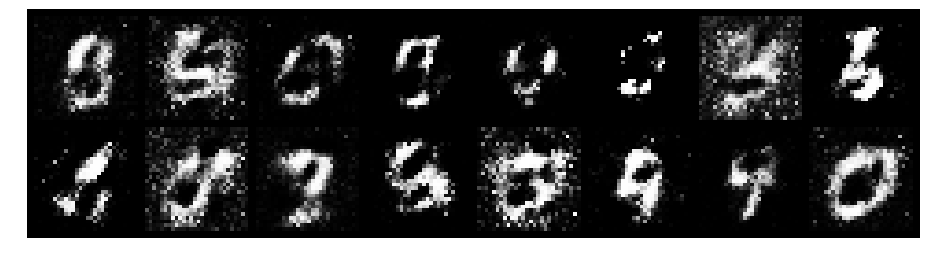

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 1.1627, Generator Loss: 1.4722
D(x): 0.7258, D(G(z)): 0.4112
33 min	 59.90950417518616 sec


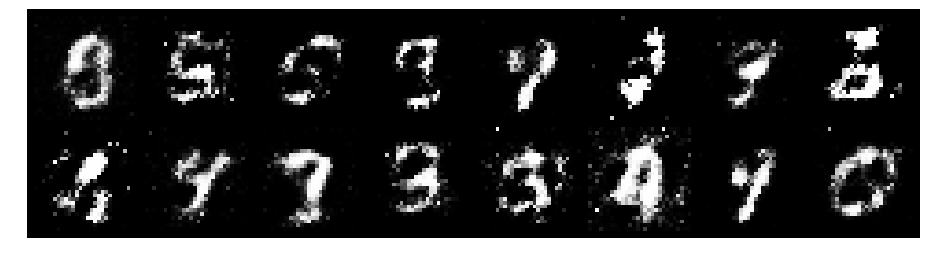

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 0.7764, Generator Loss: 1.6459
D(x): 0.7140, D(G(z)): 0.2475
34 min	 16.47789216041565 sec


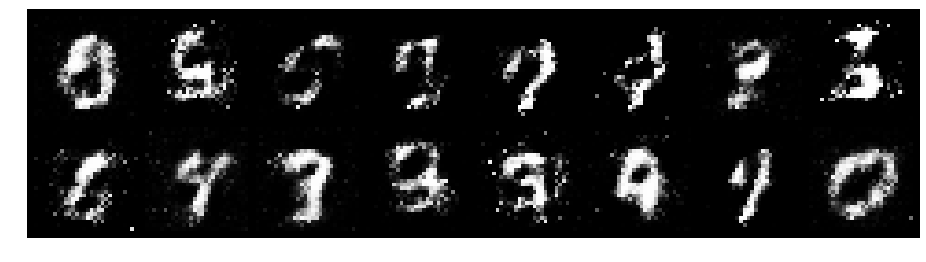

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.7778, Generator Loss: 1.6529
D(x): 0.7230, D(G(z)): 0.2214
34 min	 37.95519208908081 sec


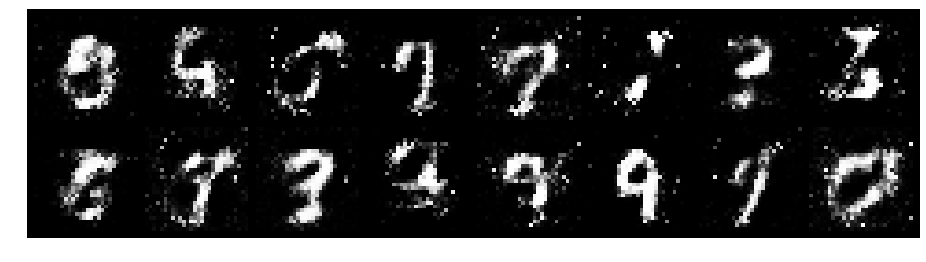

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.9765, Generator Loss: 1.5309
D(x): 0.6289, D(G(z)): 0.2419
34 min	 57.30812406539917 sec


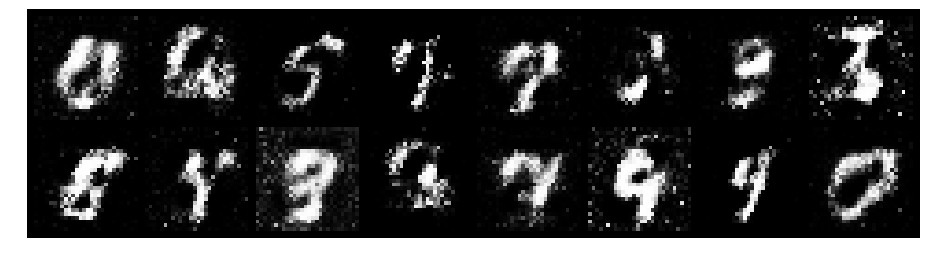

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 0.7856, Generator Loss: 1.7638
D(x): 0.7399, D(G(z)): 0.2509
35 min	 13.740608215332031 sec


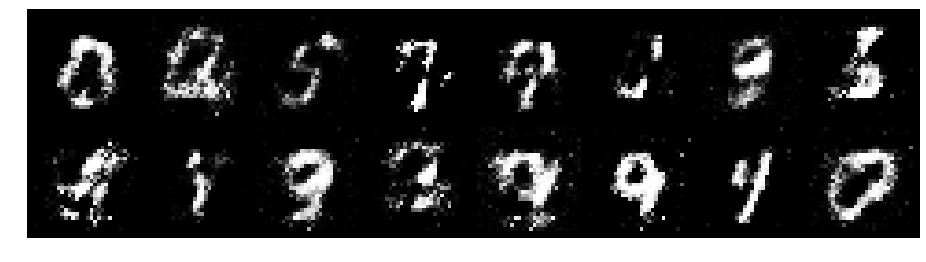

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 0.8553, Generator Loss: 1.5745
D(x): 0.6798, D(G(z)): 0.2631
35 min	 30.364049434661865 sec


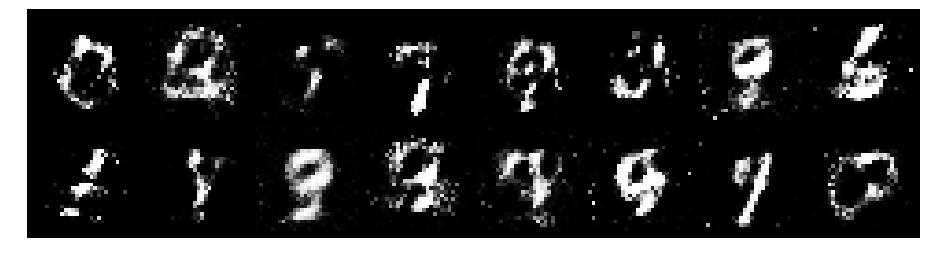

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.9286, Generator Loss: 1.9053
D(x): 0.7438, D(G(z)): 0.3407
35 min	 45.96325182914734 sec


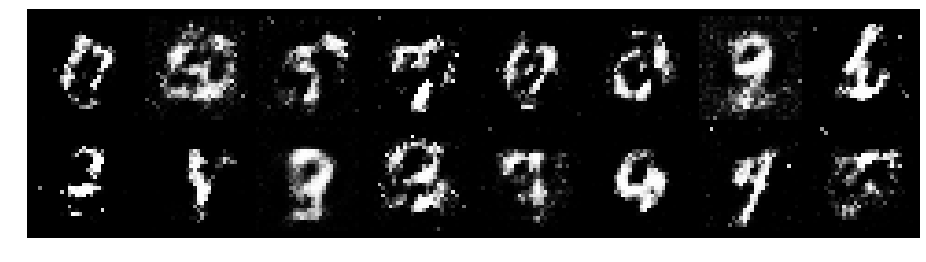

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 0.8205, Generator Loss: 1.5214
D(x): 0.7763, D(G(z)): 0.3019
36 min	 3.04004168510437 sec


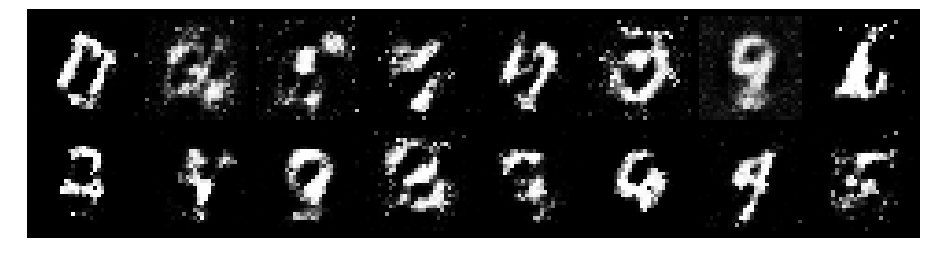

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.7919, Generator Loss: 2.3734
D(x): 0.7415, D(G(z)): 0.2221
36 min	 19.81327509880066 sec


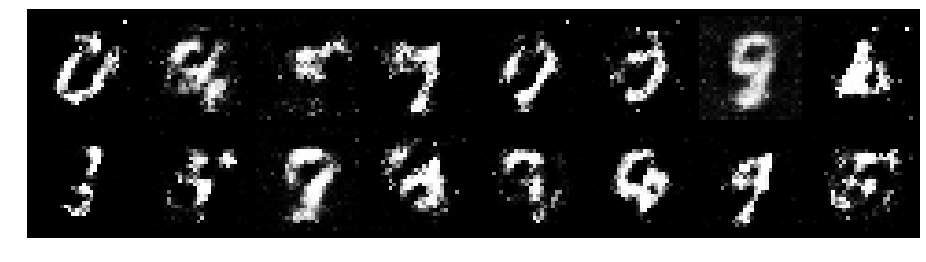

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 0.5537, Generator Loss: 2.3276
D(x): 0.8119, D(G(z)): 0.2110
36 min	 36.45110249519348 sec


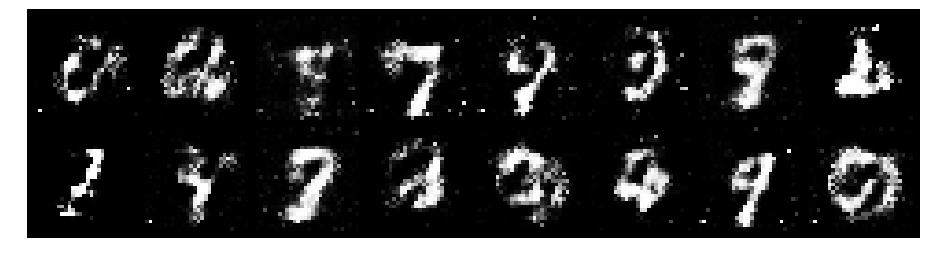

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.7994, Generator Loss: 1.7475
D(x): 0.7421, D(G(z)): 0.2838
36 min	 52.14950633049011 sec


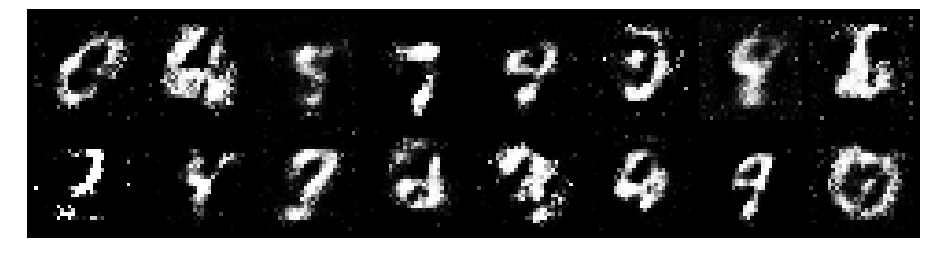

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 1.1121, Generator Loss: 1.3434
D(x): 0.6897, D(G(z)): 0.3884
37 min	 9.073029041290283 sec


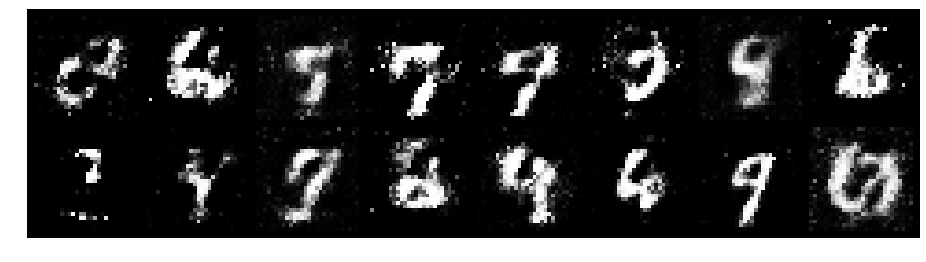

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.9890, Generator Loss: 1.8114
D(x): 0.6815, D(G(z)): 0.2808
37 min	 25.60917592048645 sec


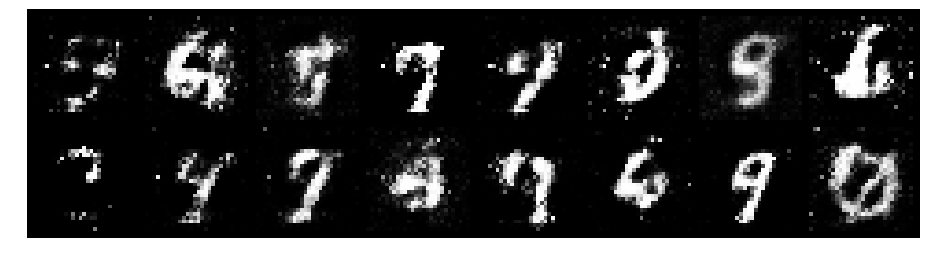

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.8433, Generator Loss: 1.4879
D(x): 0.6989, D(G(z)): 0.2599
37 min	 41.46927523612976 sec


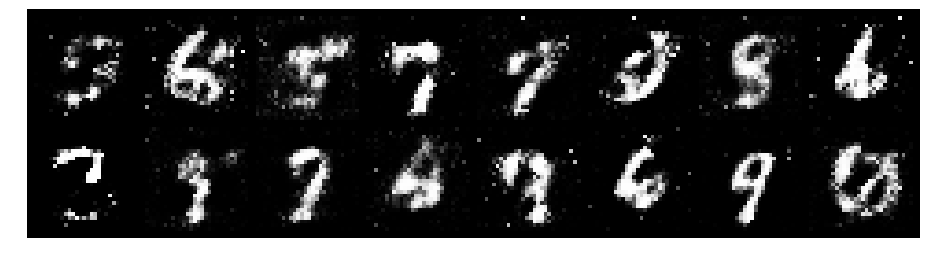

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.9056, Generator Loss: 1.4246
D(x): 0.7571, D(G(z)): 0.3627
37 min	 59.68091082572937 sec


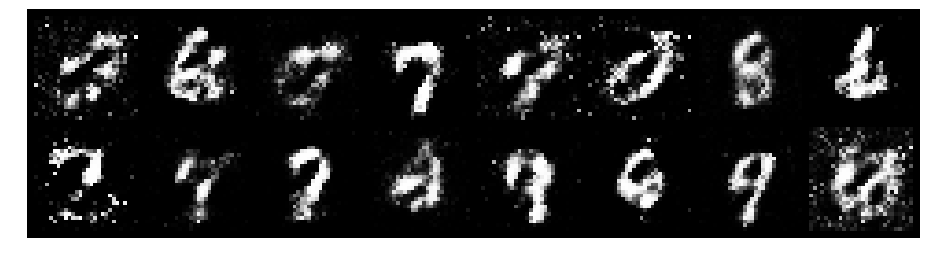

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 0.9510, Generator Loss: 1.2270
D(x): 0.7034, D(G(z)): 0.3705
38 min	 15.646161079406738 sec


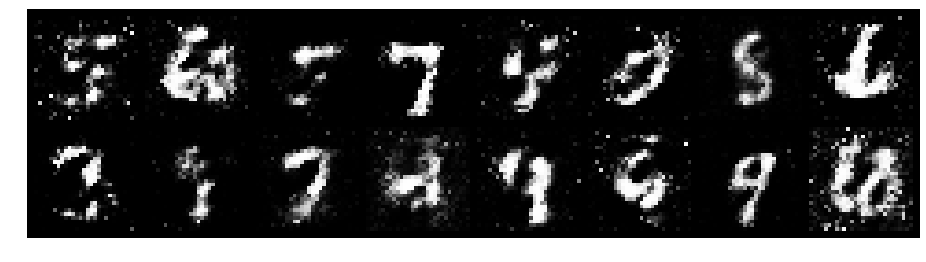

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 1.1218, Generator Loss: 1.2736
D(x): 0.6823, D(G(z)): 0.3762
38 min	 32.27853274345398 sec


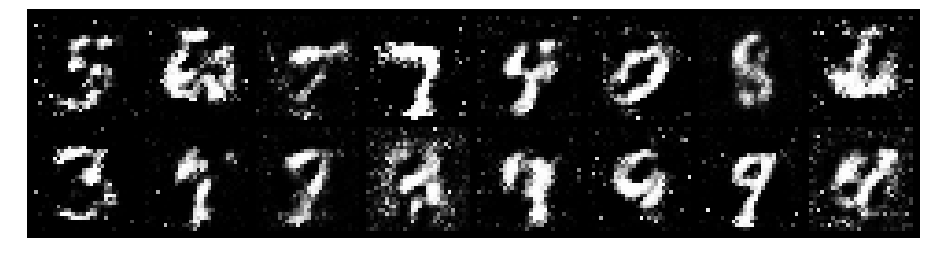

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 1.0019, Generator Loss: 1.5036
D(x): 0.7286, D(G(z)): 0.3802
38 min	 47.86533570289612 sec


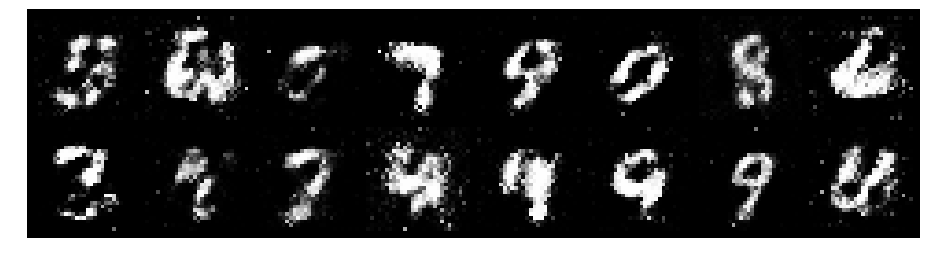

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 0.7245, Generator Loss: 1.5386
D(x): 0.7482, D(G(z)): 0.2680
39 min	 4.410905838012695 sec


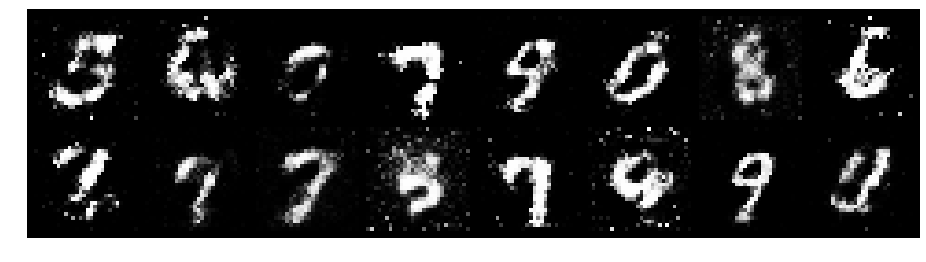

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 0.8144, Generator Loss: 1.5676
D(x): 0.7506, D(G(z)): 0.2745
39 min	 20.278941869735718 sec


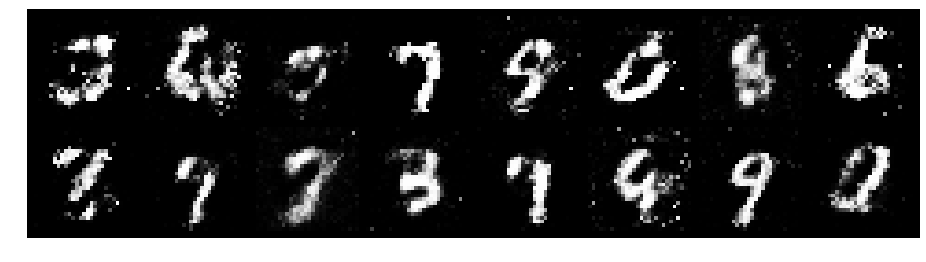

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 0.8090, Generator Loss: 1.3294
D(x): 0.7424, D(G(z)): 0.2944
39 min	 40.84211444854736 sec


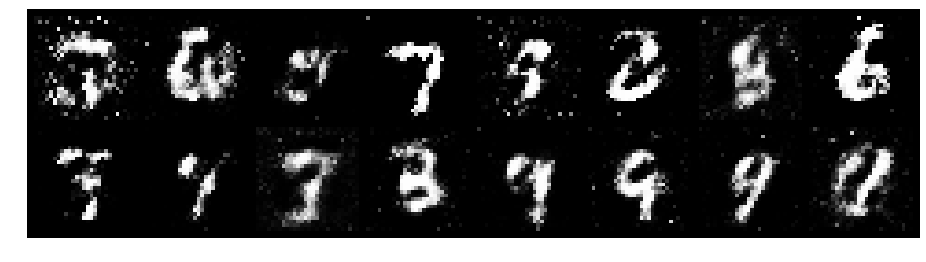

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 1.0204, Generator Loss: 1.6324
D(x): 0.7233, D(G(z)): 0.3412
39 min	 58.78442072868347 sec


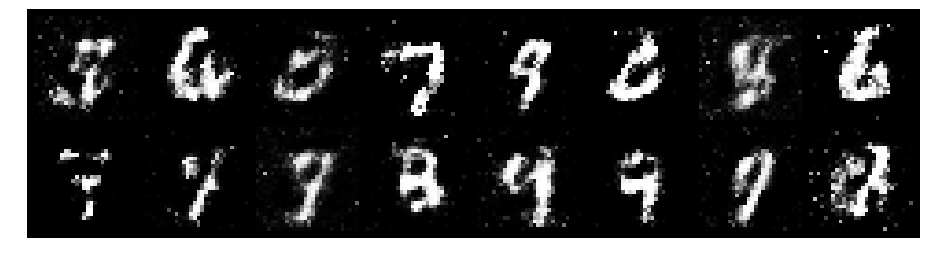

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 0.9593, Generator Loss: 1.6081
D(x): 0.7427, D(G(z)): 0.3457
40 min	 14.85532021522522 sec


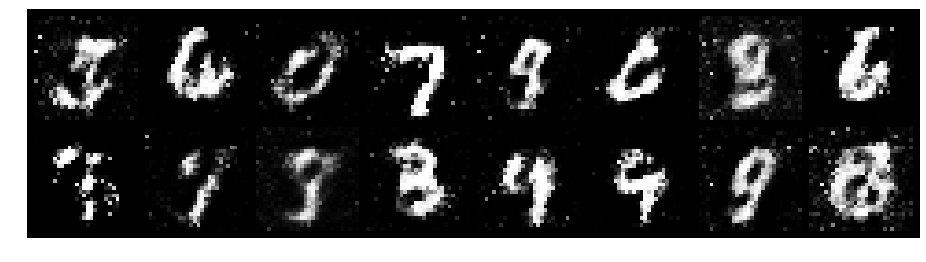

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 0.7906, Generator Loss: 1.6520
D(x): 0.7297, D(G(z)): 0.2605
40 min	 31.88597822189331 sec


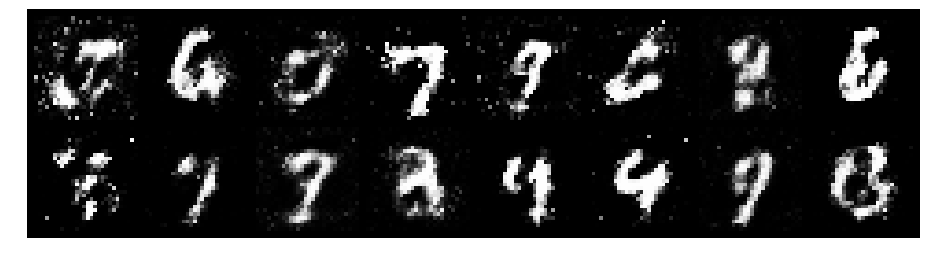

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 1.0390, Generator Loss: 1.4299
D(x): 0.7557, D(G(z)): 0.3641
40 min	 47.76294159889221 sec


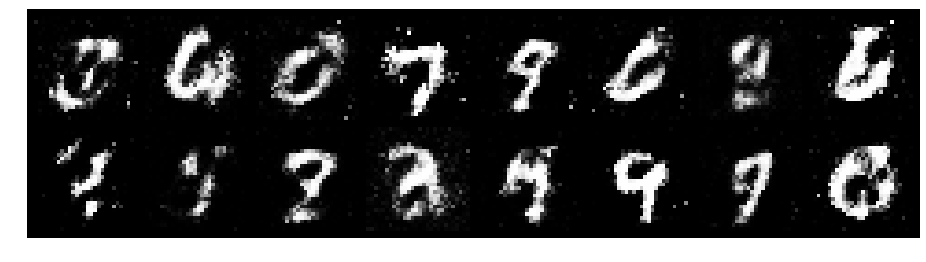

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 0.9946, Generator Loss: 1.7081
D(x): 0.6430, D(G(z)): 0.2509
41 min	 4.962737560272217 sec


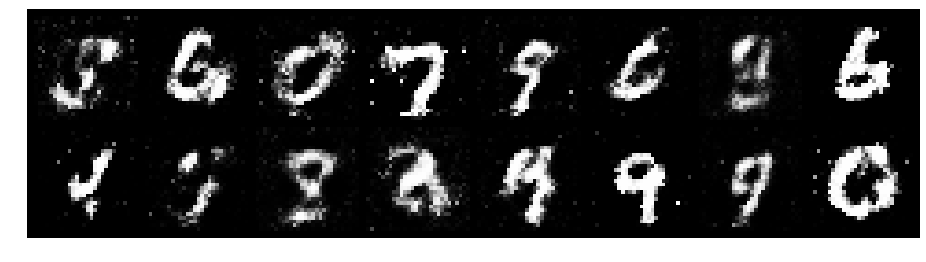

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 0.8946, Generator Loss: 1.7671
D(x): 0.6983, D(G(z)): 0.2758
41 min	 20.5480535030365 sec


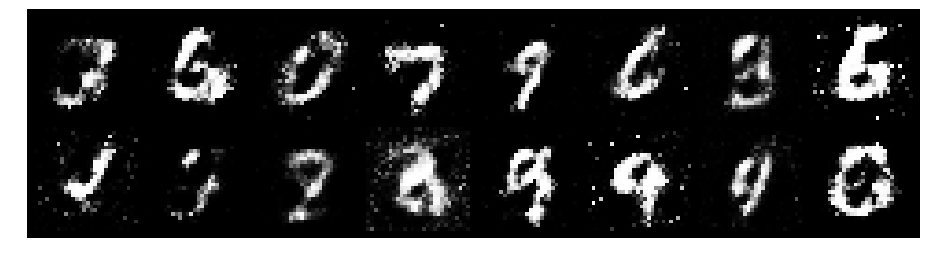

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 0.9241, Generator Loss: 1.7221
D(x): 0.6605, D(G(z)): 0.2854
41 min	 37.26325535774231 sec


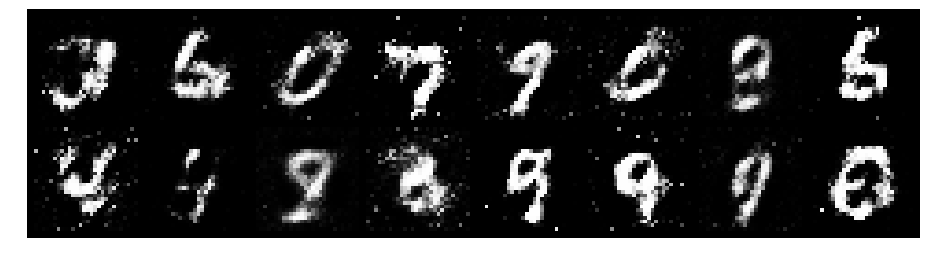

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 0.9437, Generator Loss: 1.1558
D(x): 0.7247, D(G(z)): 0.3672
41 min	 52.84212327003479 sec


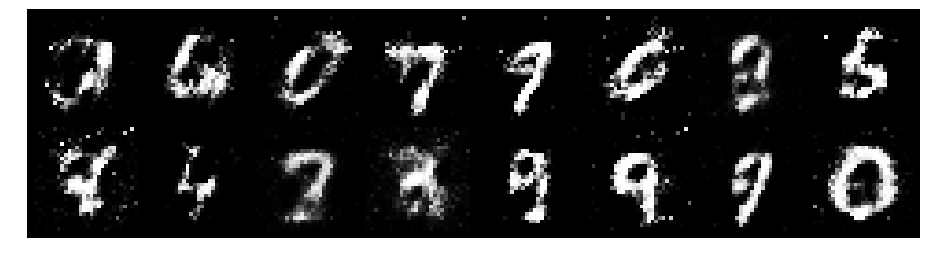

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 0.7736, Generator Loss: 1.6364
D(x): 0.7272, D(G(z)): 0.2803
42 min	 9.429358005523682 sec


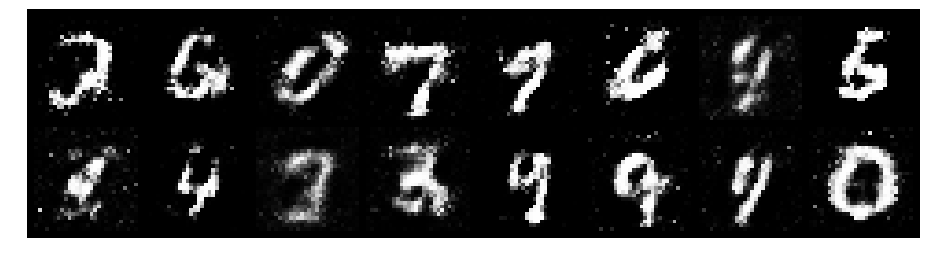

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.7726, Generator Loss: 1.9616
D(x): 0.7589, D(G(z)): 0.3051
42 min	 25.88614511489868 sec


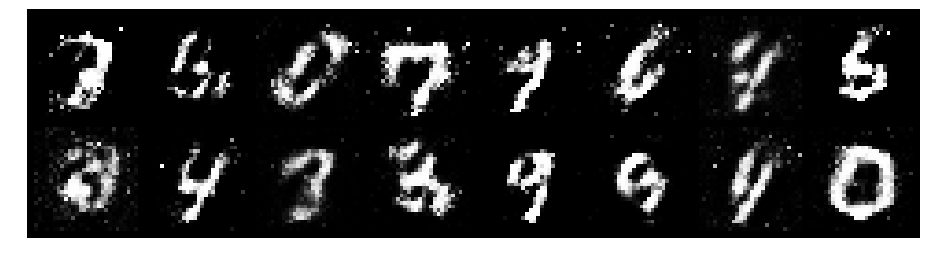

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 0.7302, Generator Loss: 1.3906
D(x): 0.7406, D(G(z)): 0.2870
42 min	 42.00118708610535 sec


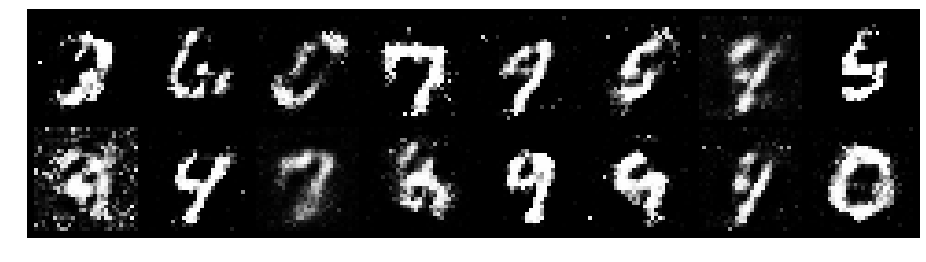

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.9470, Generator Loss: 1.7202
D(x): 0.7309, D(G(z)): 0.3385
42 min	 58.50410318374634 sec


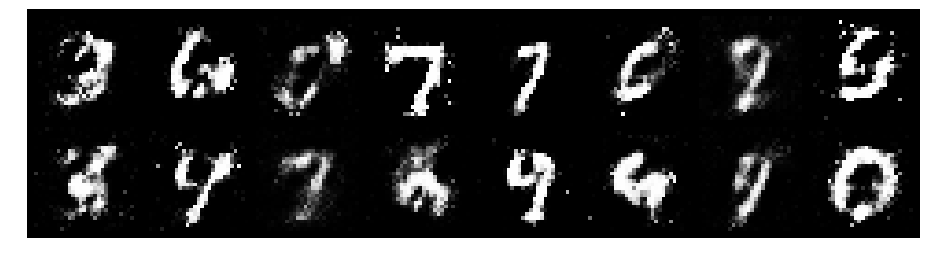

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 0.8813, Generator Loss: 1.1421
D(x): 0.7110, D(G(z)): 0.3392
43 min	 14.327993631362915 sec


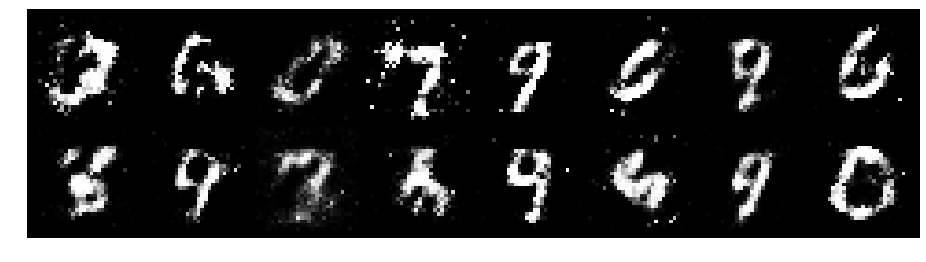

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 0.7502, Generator Loss: 1.7372
D(x): 0.7358, D(G(z)): 0.2635
43 min	 30.909772396087646 sec


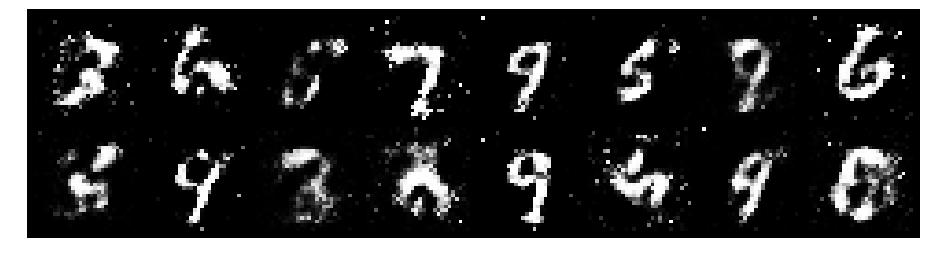

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 1.0422, Generator Loss: 1.3249
D(x): 0.6204, D(G(z)): 0.3098
43 min	 46.60718393325806 sec


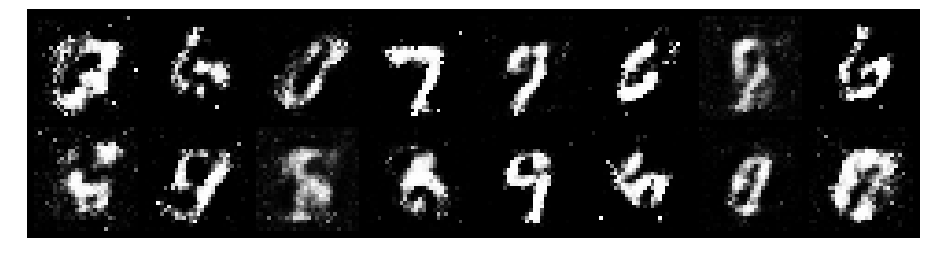

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 1.1087, Generator Loss: 1.3537
D(x): 0.5950, D(G(z)): 0.3234
44 min	 3.2405474185943604 sec


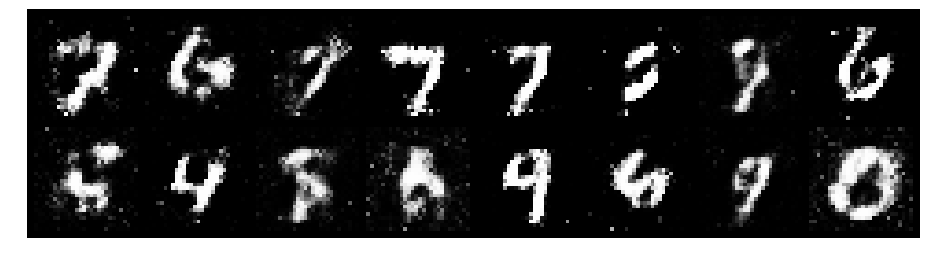

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.9277, Generator Loss: 1.5098
D(x): 0.6676, D(G(z)): 0.2795
44 min	 19.416598320007324 sec


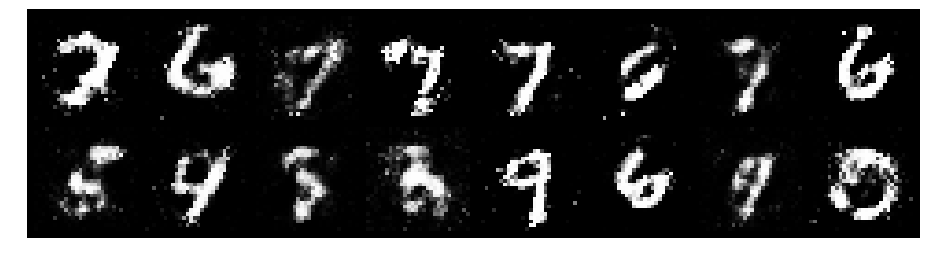

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 1.3185, Generator Loss: 1.2321
D(x): 0.5559, D(G(z)): 0.3674
44 min	 35.998377323150635 sec


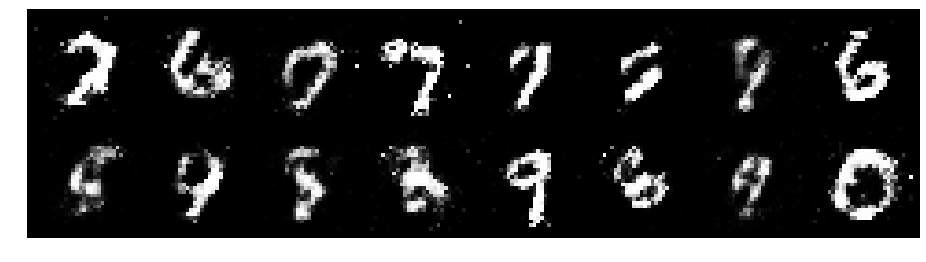

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 1.0924, Generator Loss: 1.3948
D(x): 0.6123, D(G(z)): 0.2584
44 min	 51.771676540374756 sec


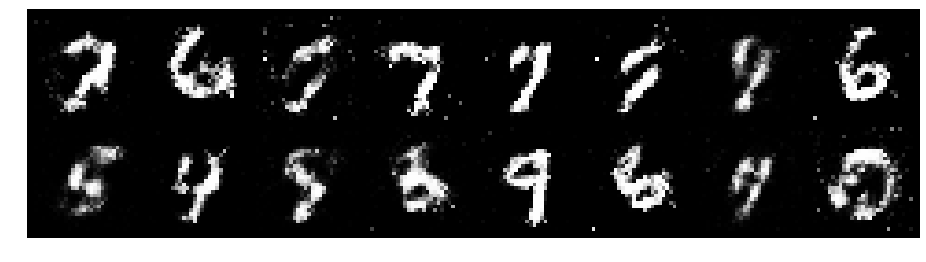

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 0.9882, Generator Loss: 1.5441
D(x): 0.6542, D(G(z)): 0.3256
45 min	 8.718015193939209 sec


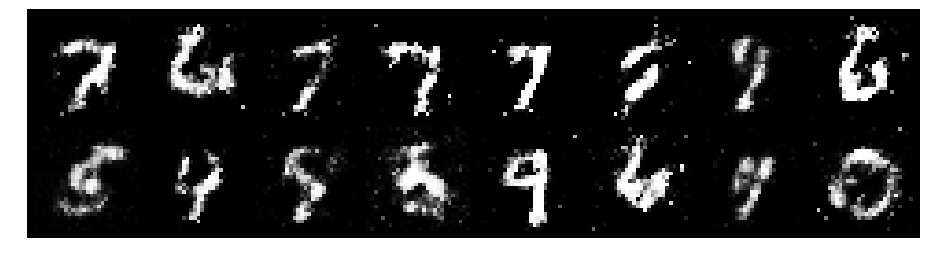

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 0.9417, Generator Loss: 1.3888
D(x): 0.7301, D(G(z)): 0.3633
45 min	 24.607378721237183 sec


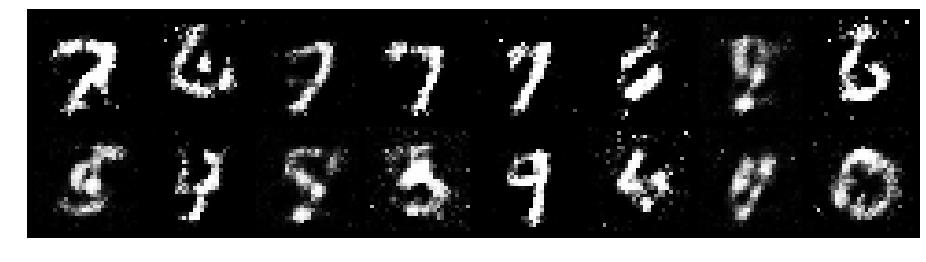

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 0.8391, Generator Loss: 1.8100
D(x): 0.6484, D(G(z)): 0.2069
45 min	 41.3374605178833 sec


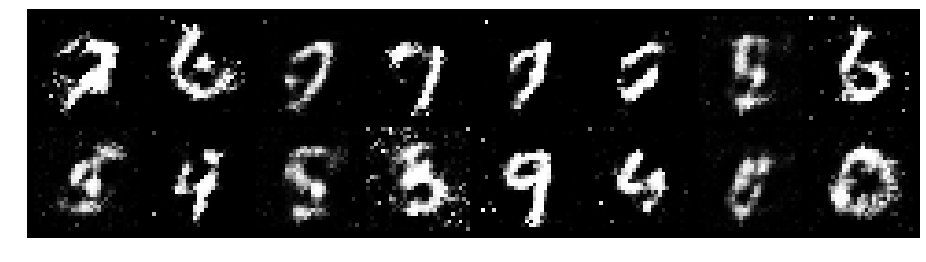

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 0.9730, Generator Loss: 1.6234
D(x): 0.6140, D(G(z)): 0.2530
45 min	 57.881049156188965 sec


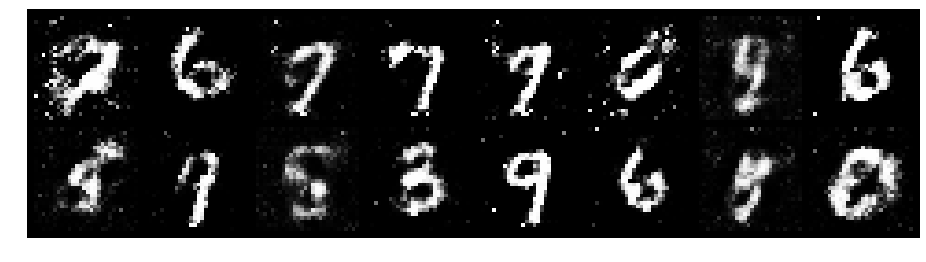

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 0.8689, Generator Loss: 1.7697
D(x): 0.6884, D(G(z)): 0.2834
46 min	 14.504491567611694 sec


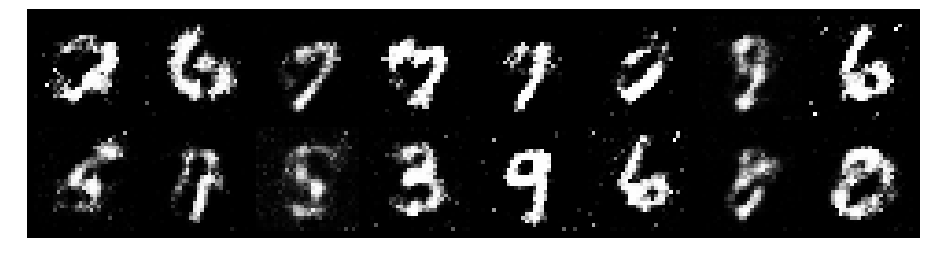

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 0.9421, Generator Loss: 1.7313
D(x): 0.6629, D(G(z)): 0.3016
46 min	 31.155214309692383 sec


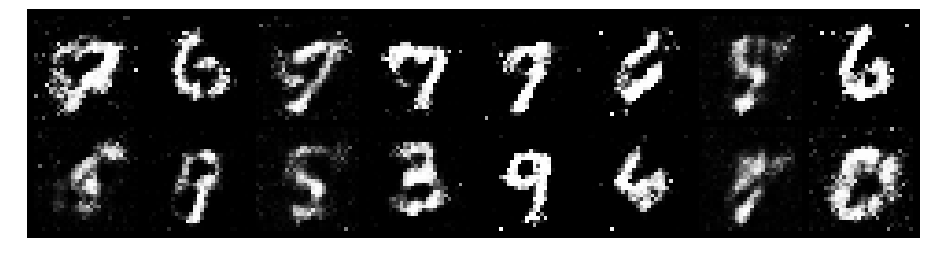

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.0447, Generator Loss: 1.3718
D(x): 0.6620, D(G(z)): 0.3602
46 min	 46.8848659992218 sec


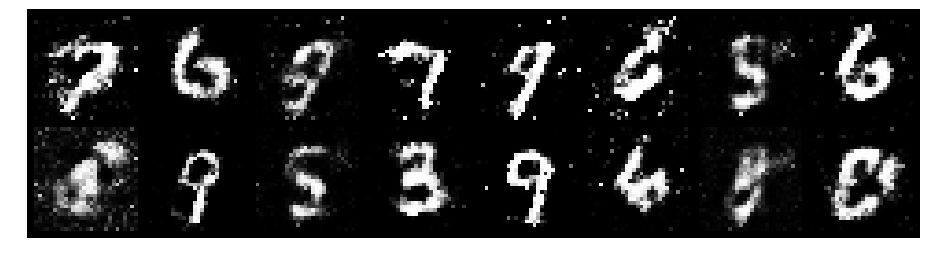

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 1.0516, Generator Loss: 1.4132
D(x): 0.6720, D(G(z)): 0.3761
47 min	 3.674964427947998 sec


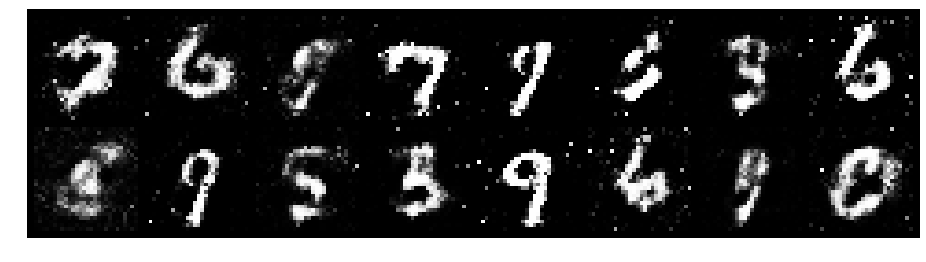

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 1.0444, Generator Loss: 1.3094
D(x): 0.6580, D(G(z)): 0.3518
47 min	 19.36146378517151 sec


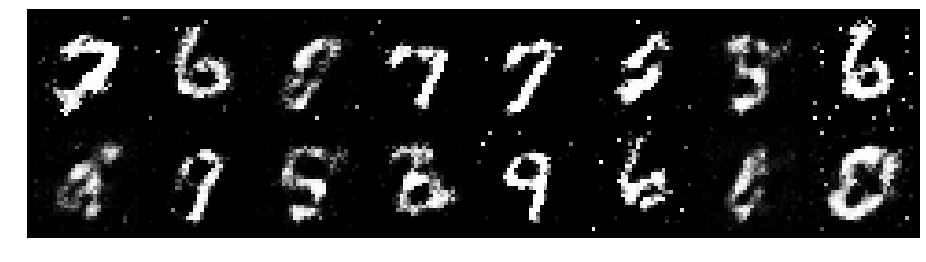

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 0.8072, Generator Loss: 1.4014
D(x): 0.7127, D(G(z)): 0.3052
47 min	 36.01863479614258 sec


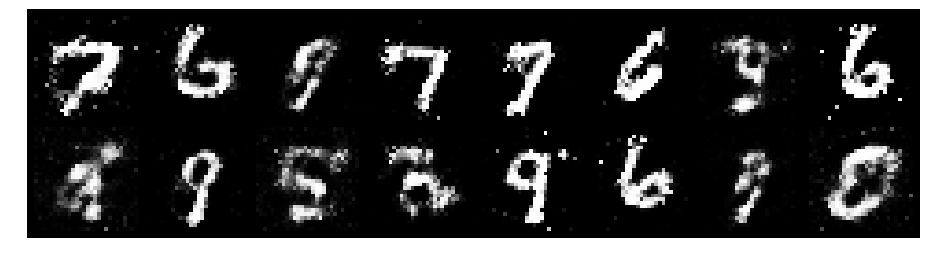

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 0.8414, Generator Loss: 1.5175
D(x): 0.7198, D(G(z)): 0.3248
47 min	 51.70811057090759 sec


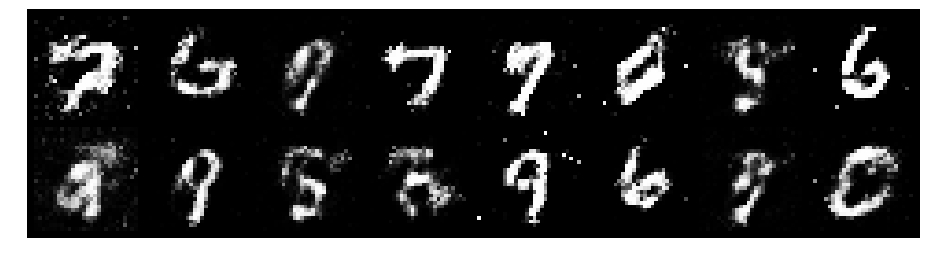

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 0.8943, Generator Loss: 1.2472
D(x): 0.7450, D(G(z)): 0.3661
48 min	 8.360816478729248 sec


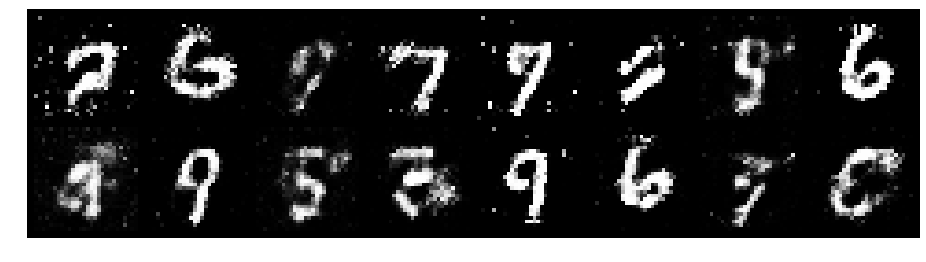

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 1.1554, Generator Loss: 1.1469
D(x): 0.6558, D(G(z)): 0.4215
48 min	 24.438164472579956 sec


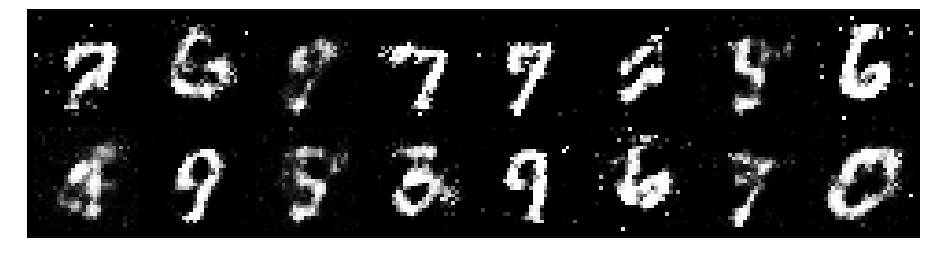

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 1.0622, Generator Loss: 1.2024
D(x): 0.6400, D(G(z)): 0.3689
48 min	 41.00704765319824 sec


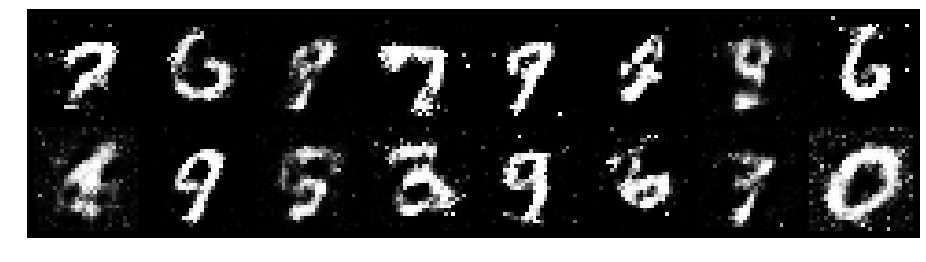

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 1.1044, Generator Loss: 1.3290
D(x): 0.6064, D(G(z)): 0.3312
48 min	 57.482186794281006 sec


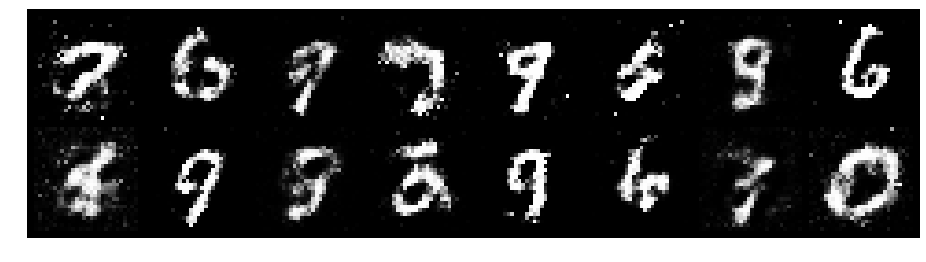

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 1.0664, Generator Loss: 1.1821
D(x): 0.5989, D(G(z)): 0.3388
49 min	 13.32542109489441 sec


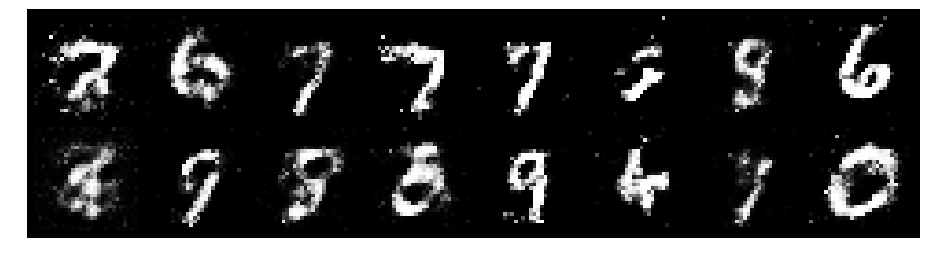

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 1.0006, Generator Loss: 1.0592
D(x): 0.6102, D(G(z)): 0.3210
49 min	 30.15123176574707 sec


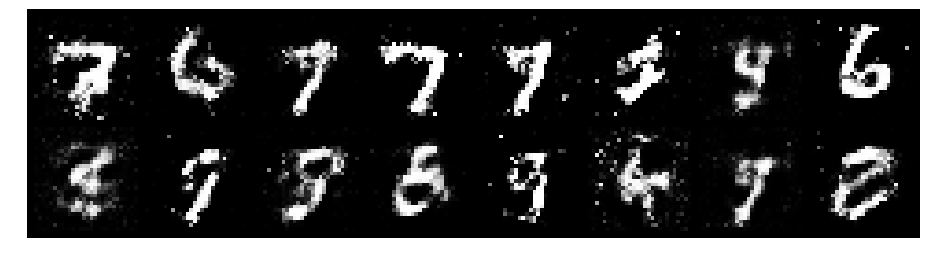

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 0.9793, Generator Loss: 1.4282
D(x): 0.6553, D(G(z)): 0.3327
49 min	 46.028692960739136 sec


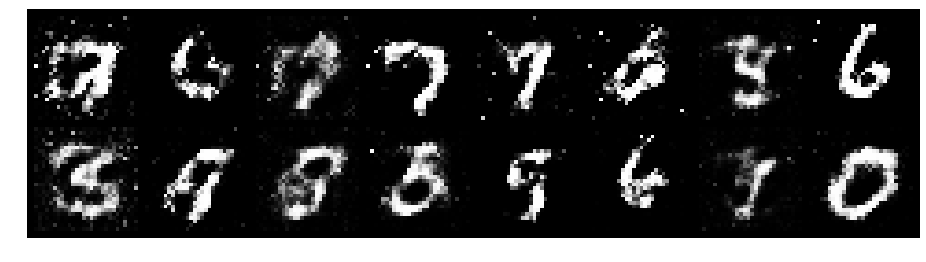

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 1.0132, Generator Loss: 1.2006
D(x): 0.6311, D(G(z)): 0.3402
50 min	 2.5747594833374023 sec


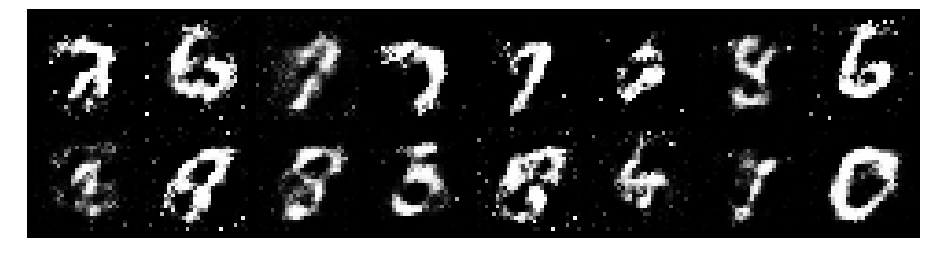

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 1.1736, Generator Loss: 1.4183
D(x): 0.6078, D(G(z)): 0.3373
50 min	 19.232921838760376 sec


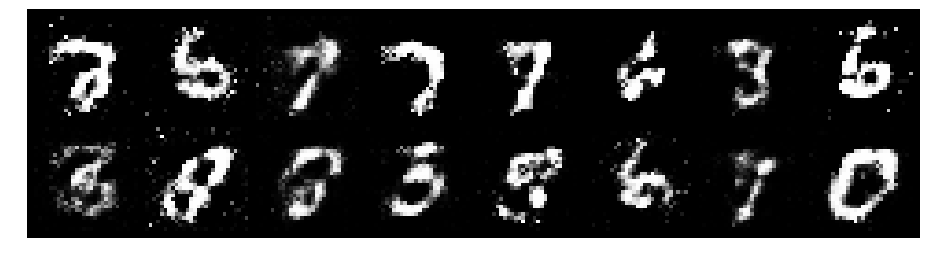

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 0.9293, Generator Loss: 1.3490
D(x): 0.7303, D(G(z)): 0.3654
50 min	 35.95903754234314 sec


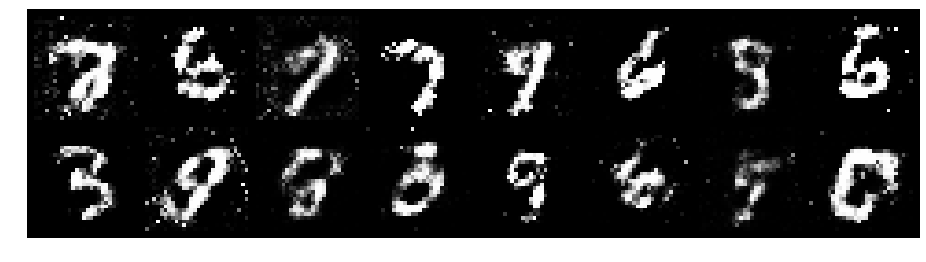

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 1.1681, Generator Loss: 1.2429
D(x): 0.6034, D(G(z)): 0.3527
50 min	 51.69811153411865 sec


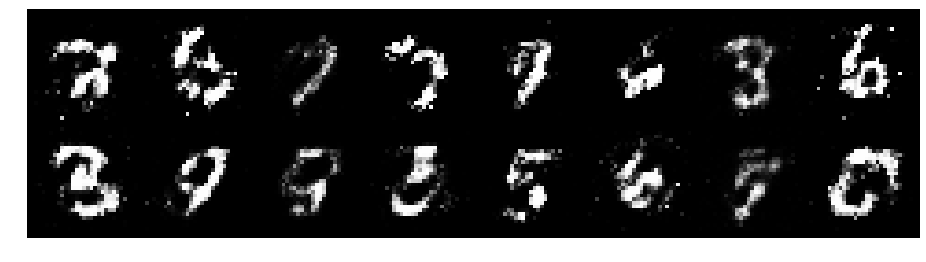

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 1.0195, Generator Loss: 1.3554
D(x): 0.6601, D(G(z)): 0.3252
51 min	 8.679667949676514 sec


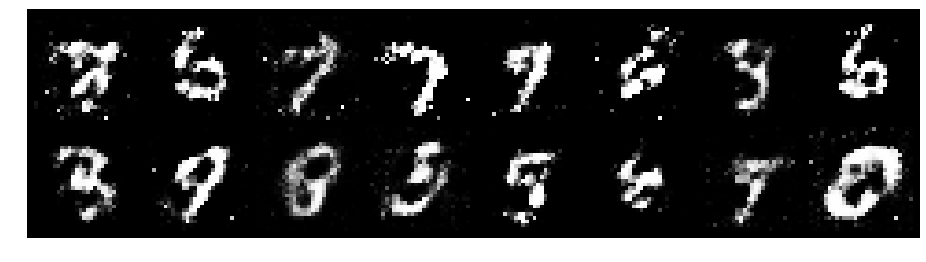

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 0.9305, Generator Loss: 1.3340
D(x): 0.7044, D(G(z)): 0.3476
51 min	 24.414774417877197 sec


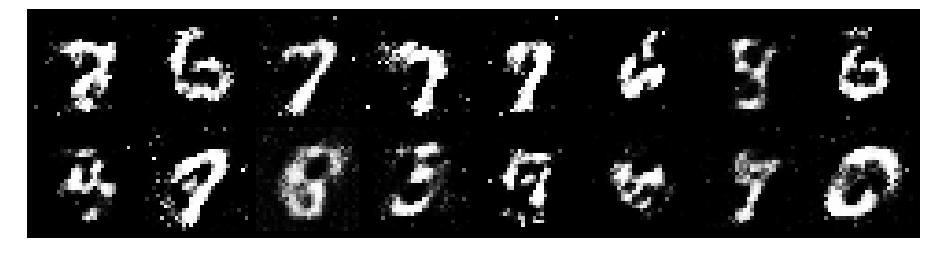

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 1.0162, Generator Loss: 1.5159
D(x): 0.7076, D(G(z)): 0.3723
51 min	 41.249016761779785 sec


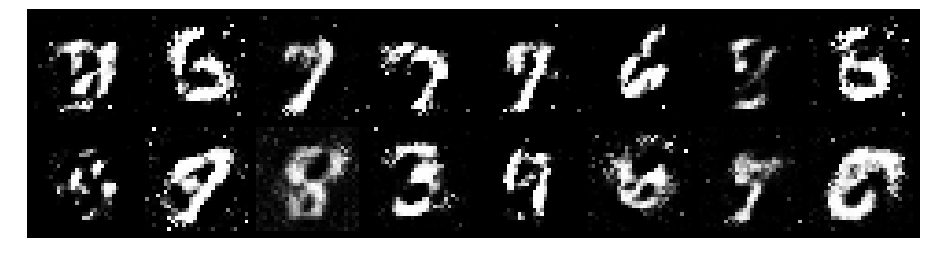

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 1.1474, Generator Loss: 1.4839
D(x): 0.6435, D(G(z)): 0.3140
51 min	 57.7082839012146 sec


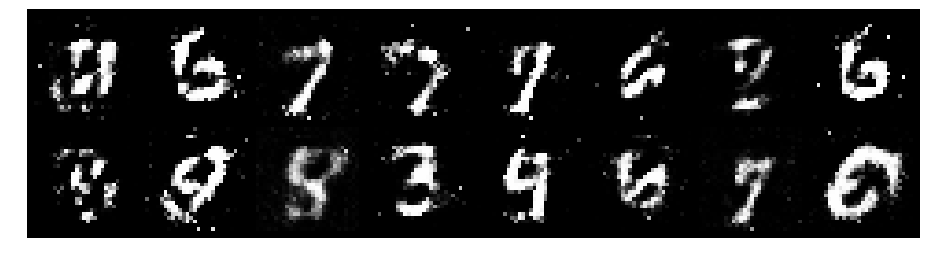

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.1674, Generator Loss: 1.0666
D(x): 0.6148, D(G(z)): 0.3455
52 min	 16.344000816345215 sec


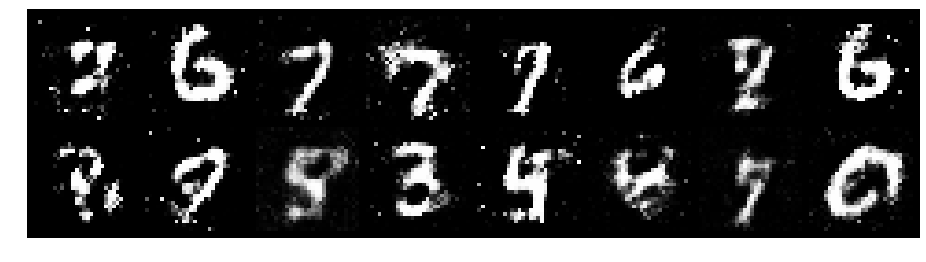

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.0797, Generator Loss: 1.3399
D(x): 0.6352, D(G(z)): 0.3322
52 min	 33.28835606575012 sec


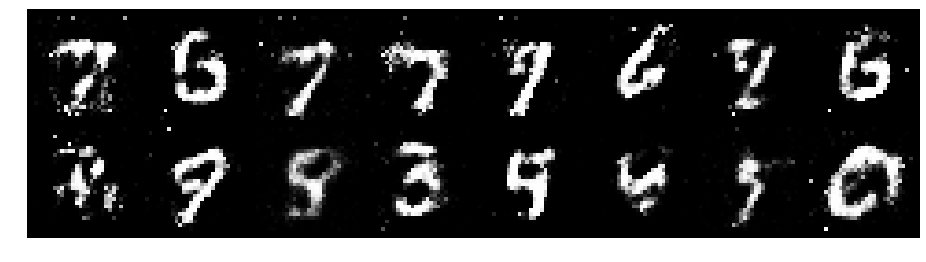

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 0.9531, Generator Loss: 1.6188
D(x): 0.6730, D(G(z)): 0.2948
52 min	 49.05719184875488 sec


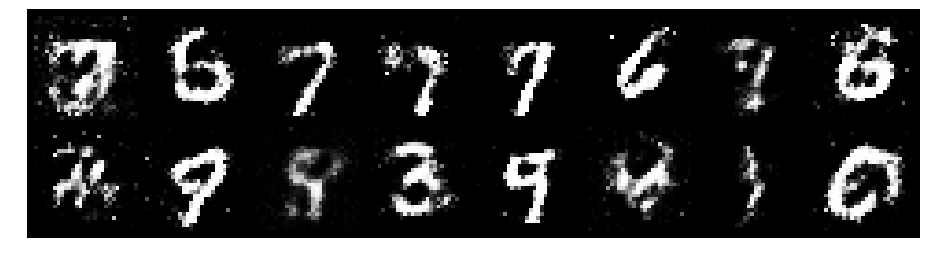

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 1.2410, Generator Loss: 1.1870
D(x): 0.6360, D(G(z)): 0.3813
53 min	 5.741640329360962 sec


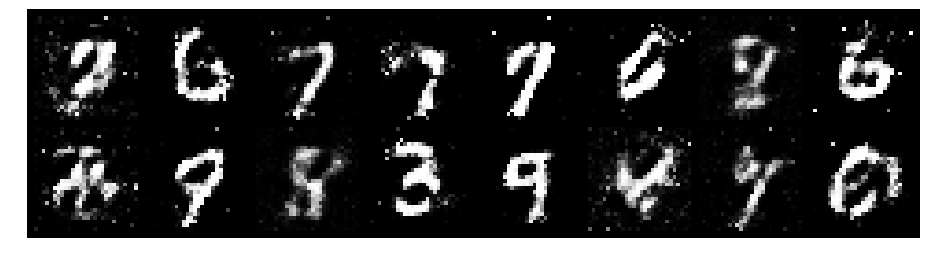

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 1.0778, Generator Loss: 1.1909
D(x): 0.6297, D(G(z)): 0.3411
53 min	 21.546188592910767 sec


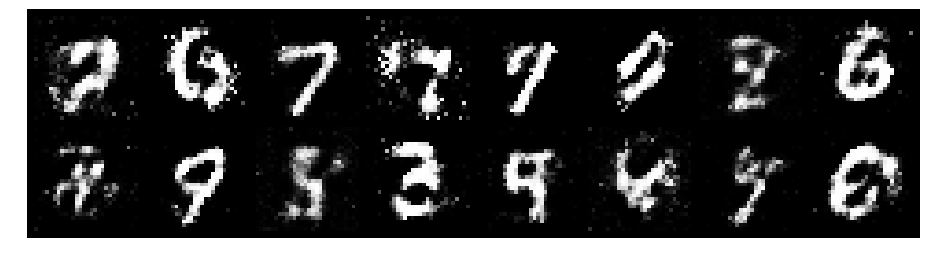

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 1.0513, Generator Loss: 1.1703
D(x): 0.6377, D(G(z)): 0.3583
53 min	 38.17707133293152 sec


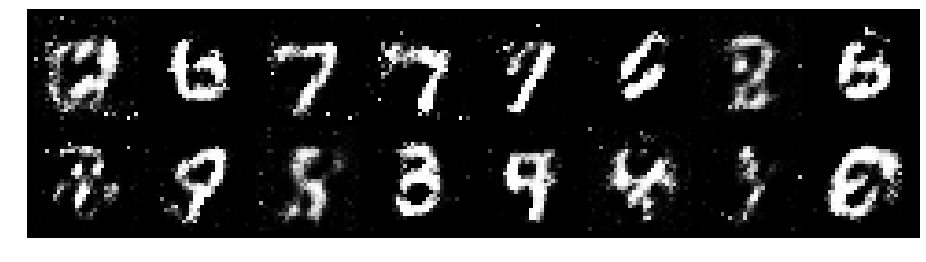

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 0.9520, Generator Loss: 1.2222
D(x): 0.6901, D(G(z)): 0.3593
53 min	 53.94193887710571 sec


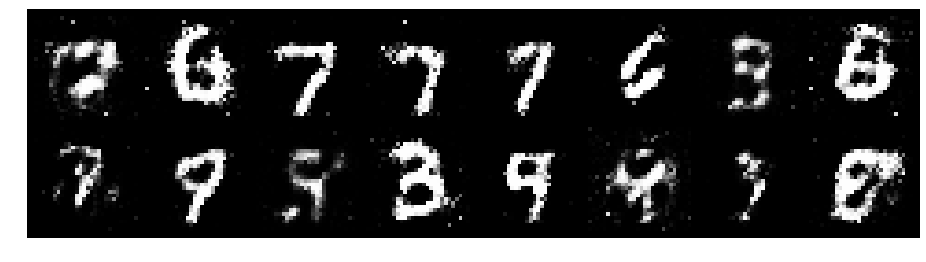

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 0.9238, Generator Loss: 1.4360
D(x): 0.6749, D(G(z)): 0.3295
54 min	 10.509333610534668 sec


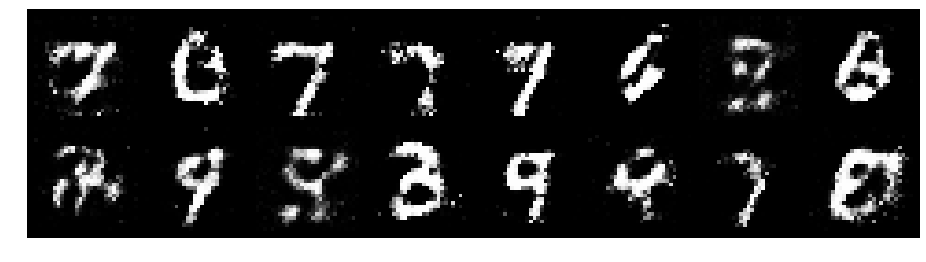

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 1.0322, Generator Loss: 1.3384
D(x): 0.6633, D(G(z)): 0.3490
54 min	 27.25528836250305 sec


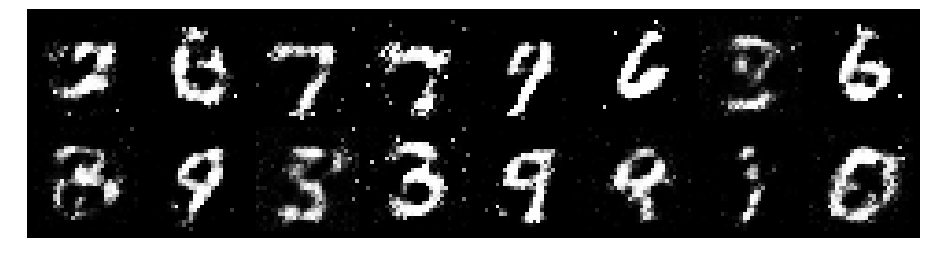

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 1.0179, Generator Loss: 1.4056
D(x): 0.6571, D(G(z)): 0.3553
54 min	 43.19028425216675 sec


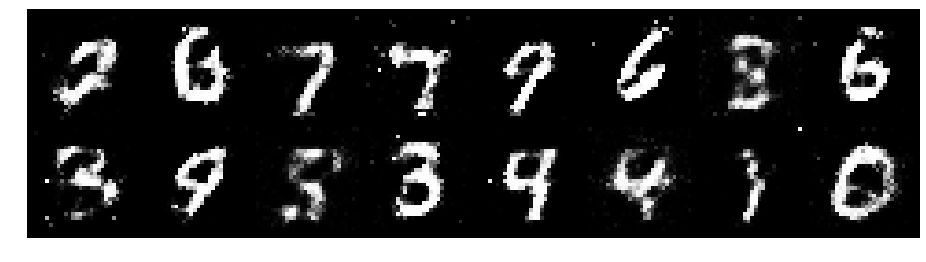

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 0.8910, Generator Loss: 1.4075
D(x): 0.6653, D(G(z)): 0.2921
54 min	 59.77206301689148 sec


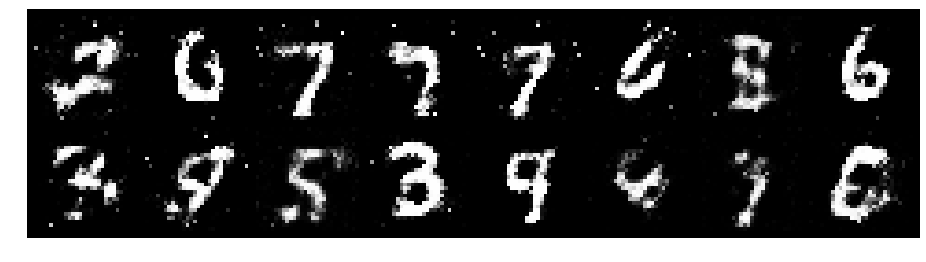

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 0.9441, Generator Loss: 1.8674
D(x): 0.6670, D(G(z)): 0.2786
55 min	 16.130640983581543 sec


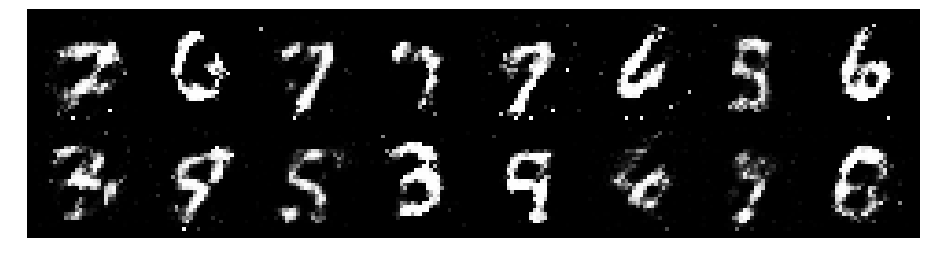

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 0.9207, Generator Loss: 1.6348
D(x): 0.6657, D(G(z)): 0.2876
55 min	 37.06829309463501 sec


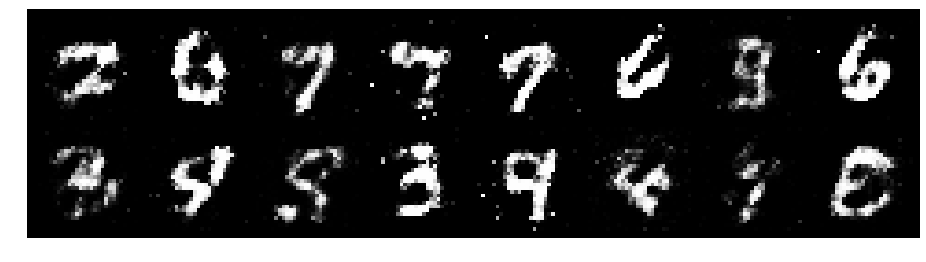

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.1375, Generator Loss: 1.1476
D(x): 0.6760, D(G(z)): 0.3974
55 min	 57.06801080703735 sec


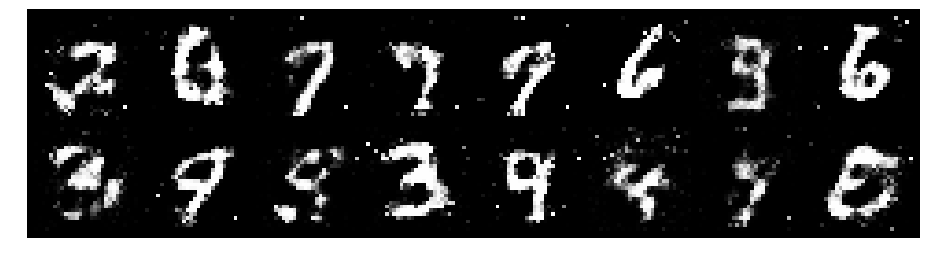

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 0.8409, Generator Loss: 1.6108
D(x): 0.6633, D(G(z)): 0.2546
56 min	 14.615502119064331 sec


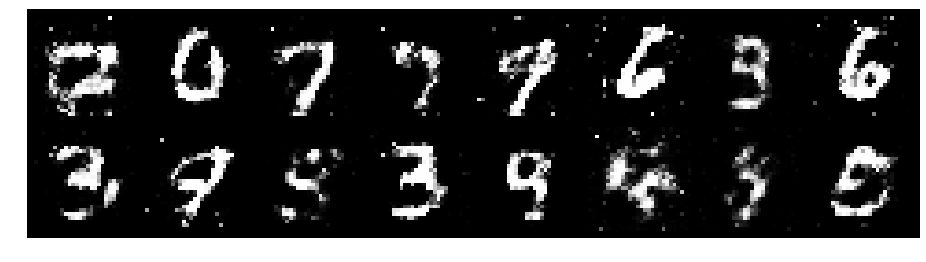

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 0.8982, Generator Loss: 1.5366
D(x): 0.7118, D(G(z)): 0.3378
56 min	 31.203728675842285 sec


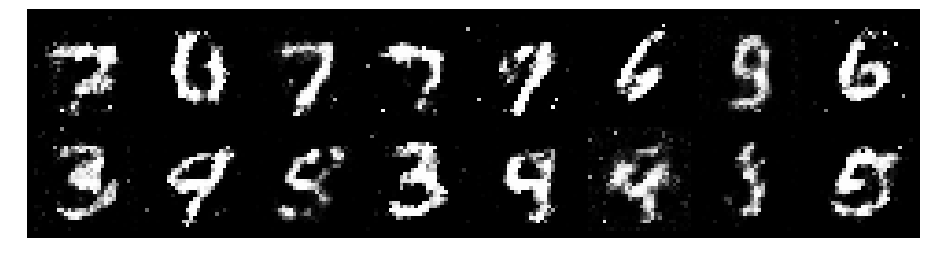

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 0.9144, Generator Loss: 1.1644
D(x): 0.6877, D(G(z)): 0.3456
56 min	 47.195762634277344 sec


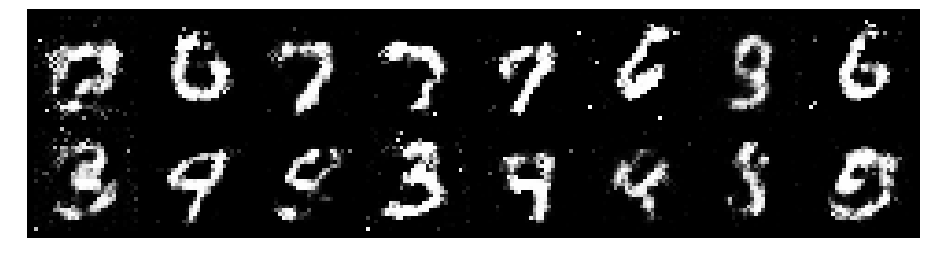

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 1.1557, Generator Loss: 1.2361
D(x): 0.5483, D(G(z)): 0.3210
57 min	 3.7666304111480713 sec


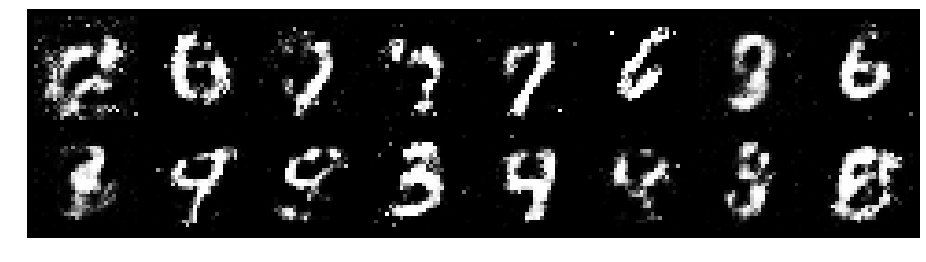

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.1050, Generator Loss: 1.0823
D(x): 0.6361, D(G(z)): 0.3759
57 min	 19.453129529953003 sec


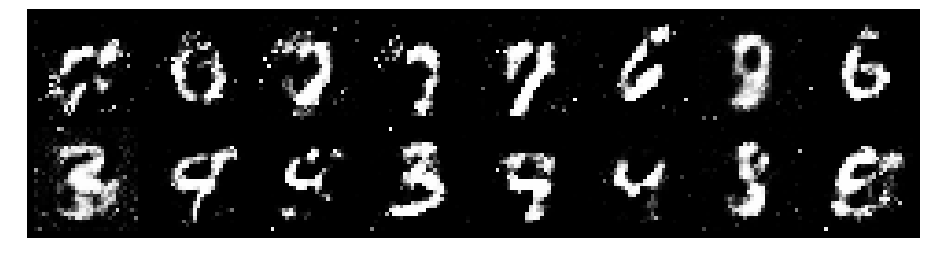

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 1.2626, Generator Loss: 1.2174
D(x): 0.6322, D(G(z)): 0.4239
57 min	 36.476349115371704 sec


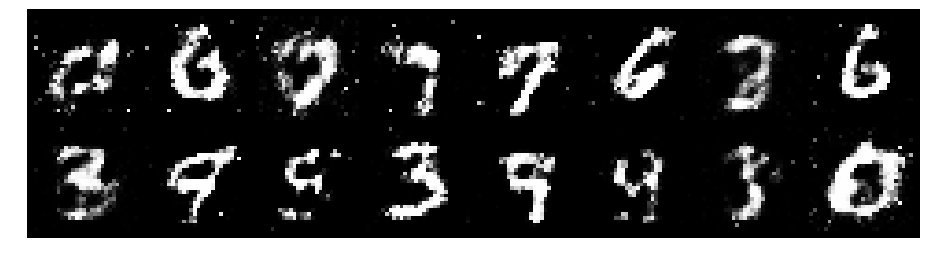

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 1.2576, Generator Loss: 1.0058
D(x): 0.6047, D(G(z)): 0.3767
57 min	 51.993712186813354 sec


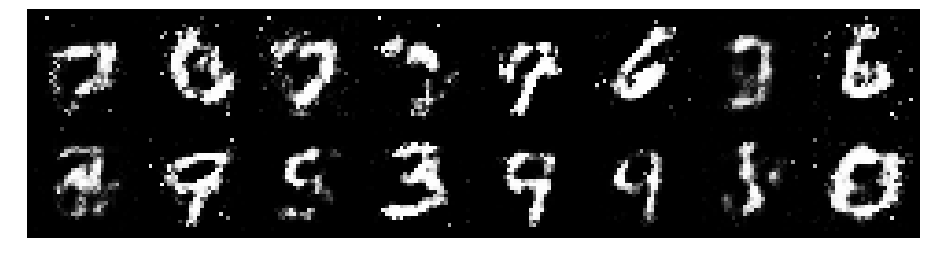

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.0254, Generator Loss: 1.3112
D(x): 0.6324, D(G(z)): 0.3280
58 min	 8.68113923072815 sec


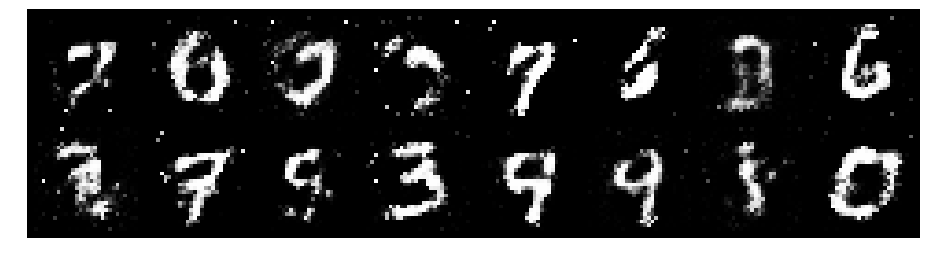

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 0.9487, Generator Loss: 1.2448
D(x): 0.6784, D(G(z)): 0.3260
58 min	 24.874549388885498 sec


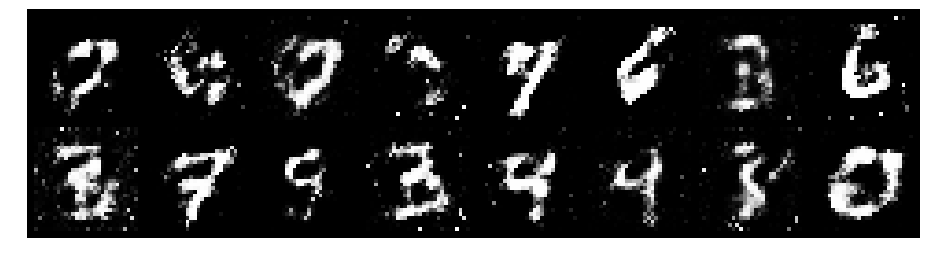

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 1.0630, Generator Loss: 1.4812
D(x): 0.6855, D(G(z)): 0.3893
58 min	 41.448888063430786 sec


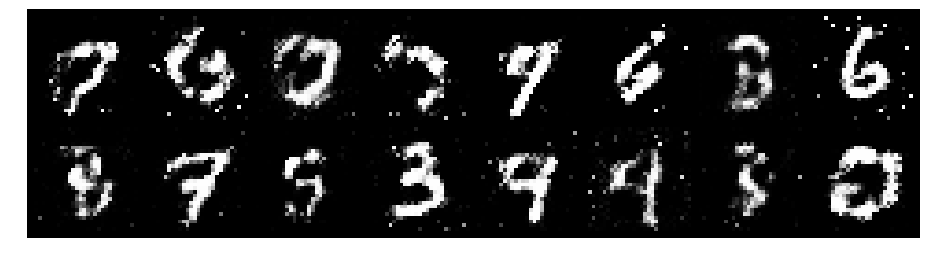

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 0.9774, Generator Loss: 1.1625
D(x): 0.6285, D(G(z)): 0.3042
58 min	 57.50590109825134 sec


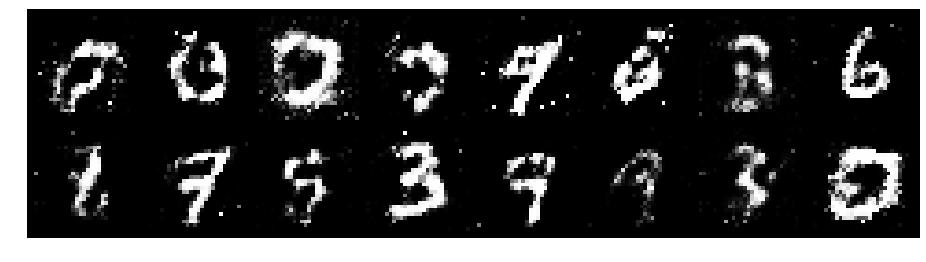

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 0.8680, Generator Loss: 1.3566
D(x): 0.7175, D(G(z)): 0.3387
59 min	 13.875886678695679 sec


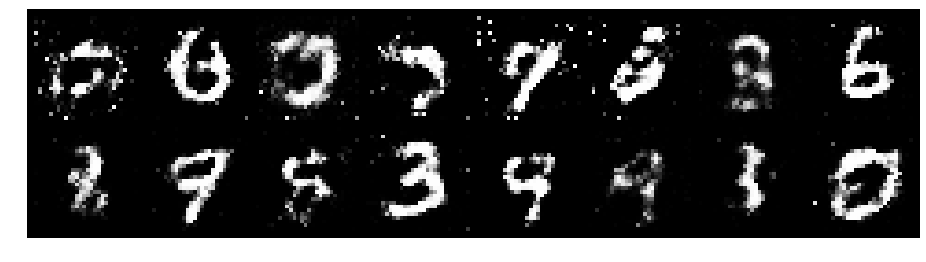

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 0.9850, Generator Loss: 1.7446
D(x): 0.6231, D(G(z)): 0.2859
59 min	 30.61985731124878 sec


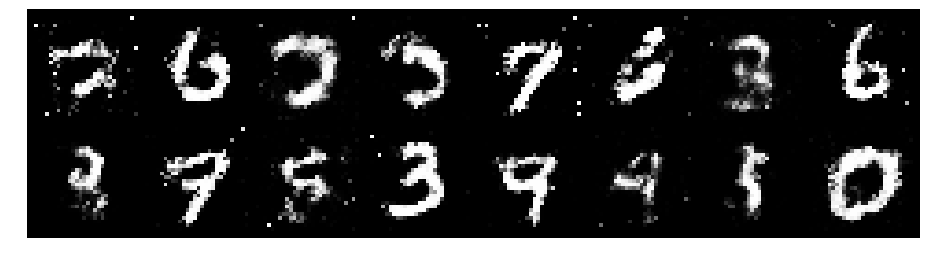

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 0.8678, Generator Loss: 1.3893
D(x): 0.6804, D(G(z)): 0.3175
59 min	 46.47995734214783 sec


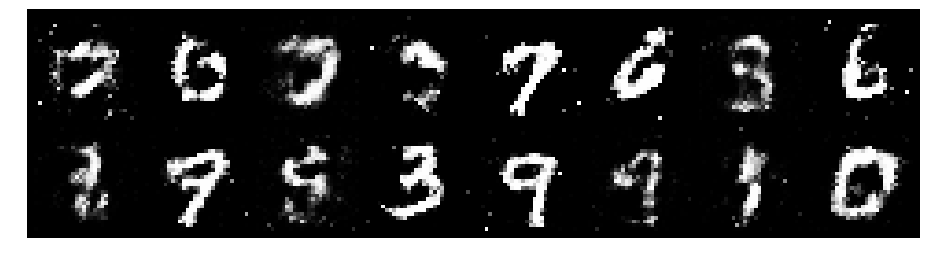

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 1.0116, Generator Loss: 1.5464
D(x): 0.6525, D(G(z)): 0.3410
60 min	 2.981879949569702 sec


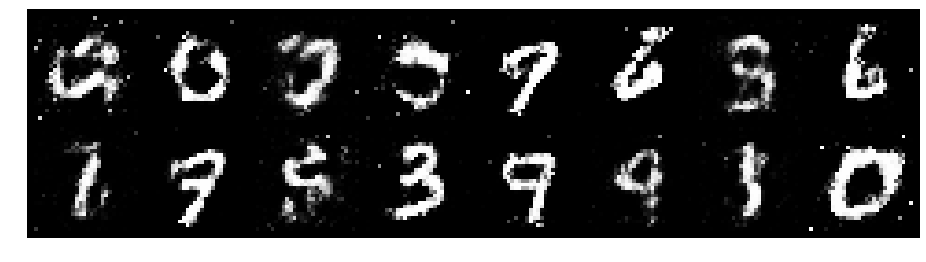

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 0.9700, Generator Loss: 1.2358
D(x): 0.7255, D(G(z)): 0.3842
60 min	 19.235307693481445 sec


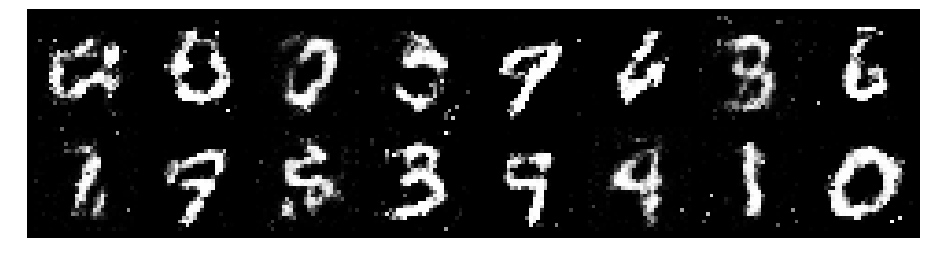

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.2639, Generator Loss: 1.2153
D(x): 0.5949, D(G(z)): 0.3975
60 min	 35.930174350738525 sec


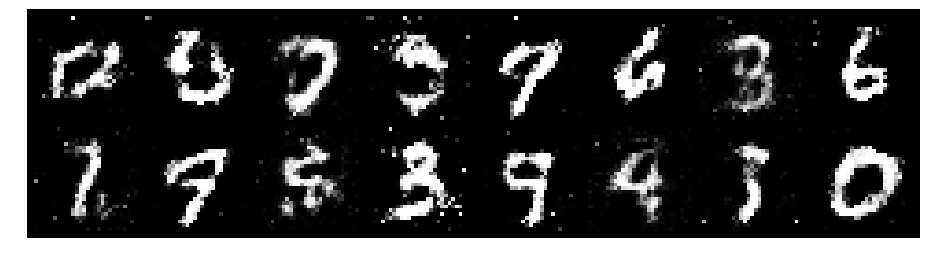

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.2419, Generator Loss: 1.0489
D(x): 0.5554, D(G(z)): 0.3432
60 min	 51.91179442405701 sec


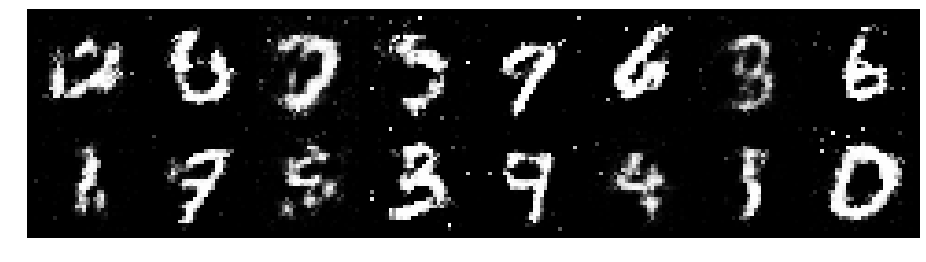

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.0586, Generator Loss: 1.5891
D(x): 0.6457, D(G(z)): 0.3457
61 min	 9.127955913543701 sec


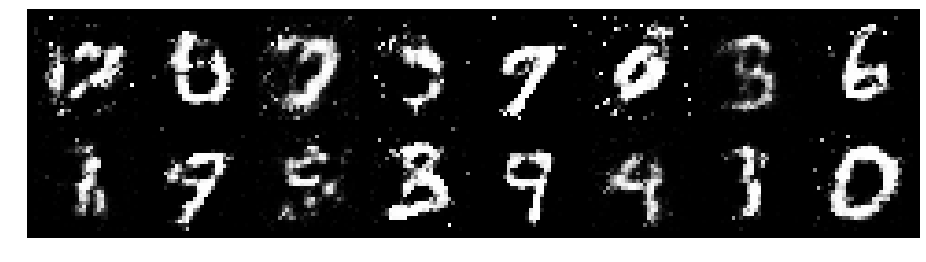

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 0.9590, Generator Loss: 1.2621
D(x): 0.6592, D(G(z)): 0.3173
61 min	 24.907702922821045 sec


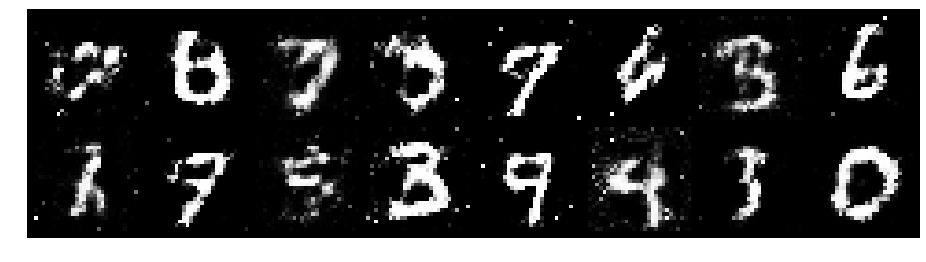

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.1493, Generator Loss: 1.0215
D(x): 0.6755, D(G(z)): 0.4607
61 min	 41.58173894882202 sec


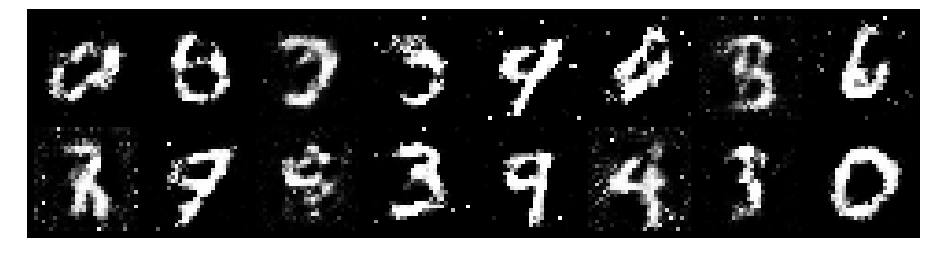

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 1.0801, Generator Loss: 1.1588
D(x): 0.6049, D(G(z)): 0.3535
61 min	 57.932878732681274 sec


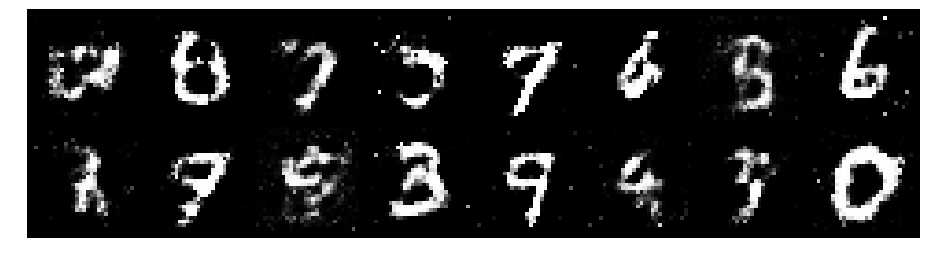

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.0051, Generator Loss: 1.0518
D(x): 0.6656, D(G(z)): 0.3722
62 min	 14.547392129898071 sec


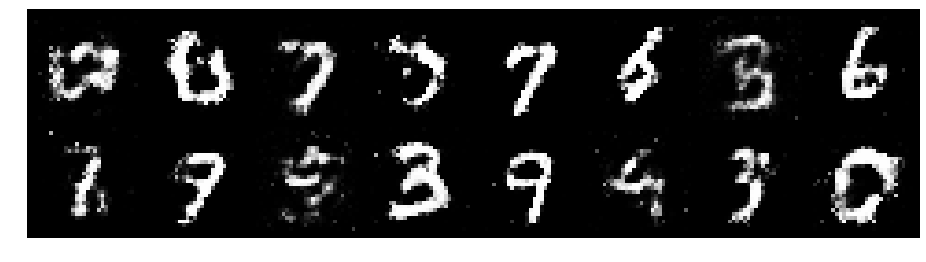

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.0042, Generator Loss: 1.3176
D(x): 0.6276, D(G(z)): 0.3302
62 min	 31.472899198532104 sec


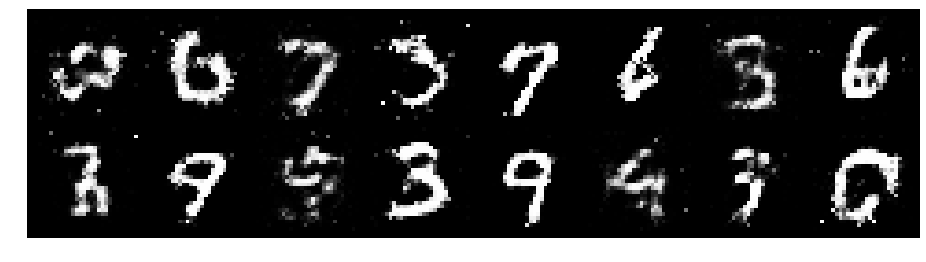

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 0.8688, Generator Loss: 1.2320
D(x): 0.7004, D(G(z)): 0.3221
62 min	 47.3106791973114 sec


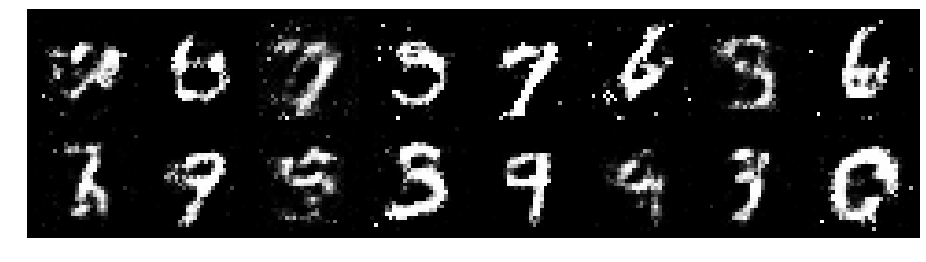

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.0756, Generator Loss: 1.1741
D(x): 0.6074, D(G(z)): 0.3459
63 min	 3.9658663272857666 sec


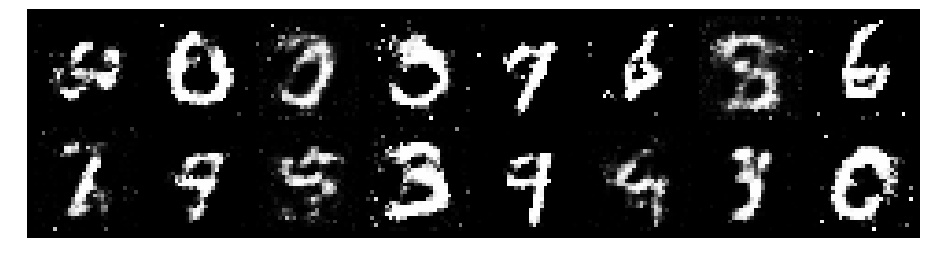

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.0338, Generator Loss: 1.3436
D(x): 0.5985, D(G(z)): 0.2908
63 min	 19.590861797332764 sec


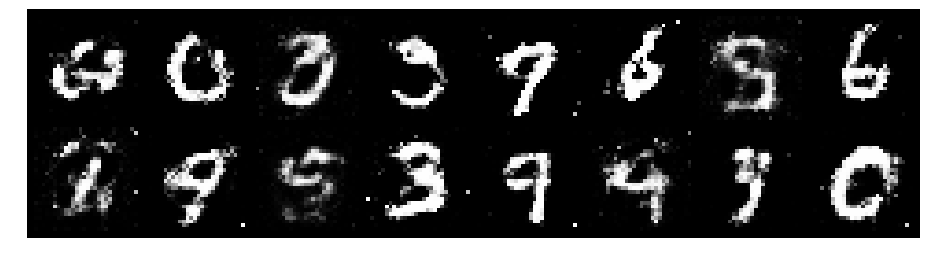

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.1538, Generator Loss: 1.2686
D(x): 0.5600, D(G(z)): 0.3516
63 min	 36.50248050689697 sec


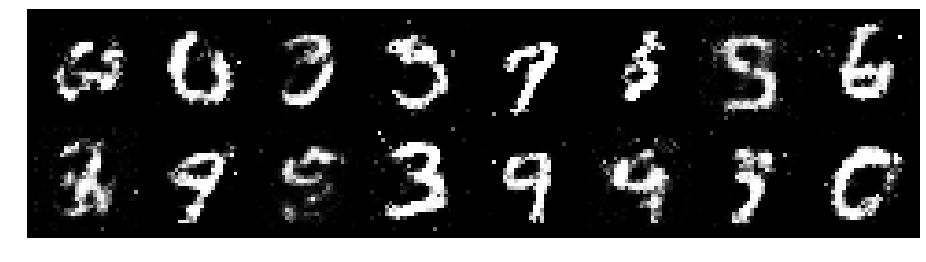

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 0.8215, Generator Loss: 1.4194
D(x): 0.6917, D(G(z)): 0.3001
63 min	 52.19542932510376 sec


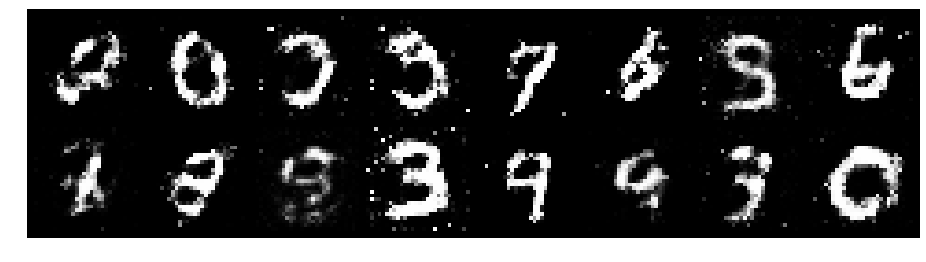

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.1463, Generator Loss: 1.1617
D(x): 0.5817, D(G(z)): 0.3805
64 min	 8.815893650054932 sec


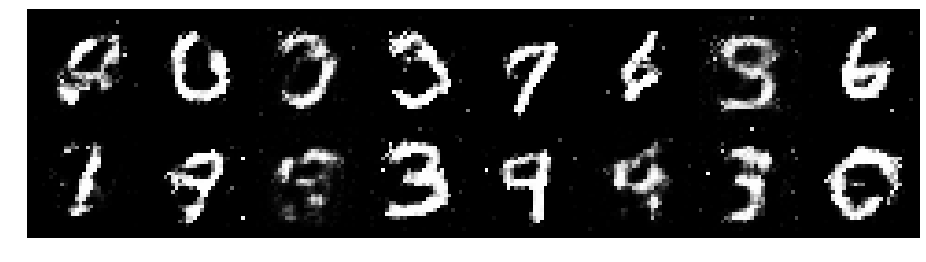

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 1.0191, Generator Loss: 0.9829
D(x): 0.6450, D(G(z)): 0.3528
64 min	 25.341129064559937 sec


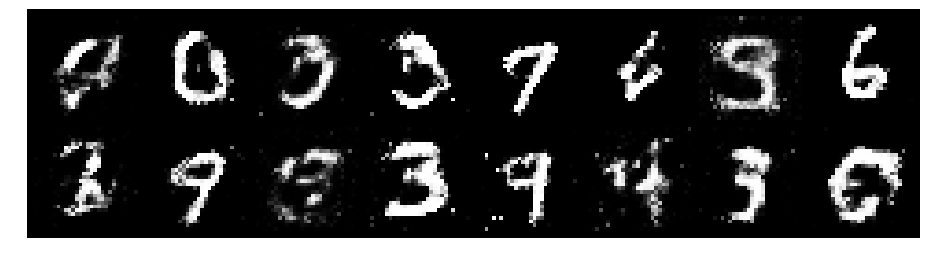

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.0863, Generator Loss: 1.1184
D(x): 0.6113, D(G(z)): 0.3765
64 min	 42.443708658218384 sec


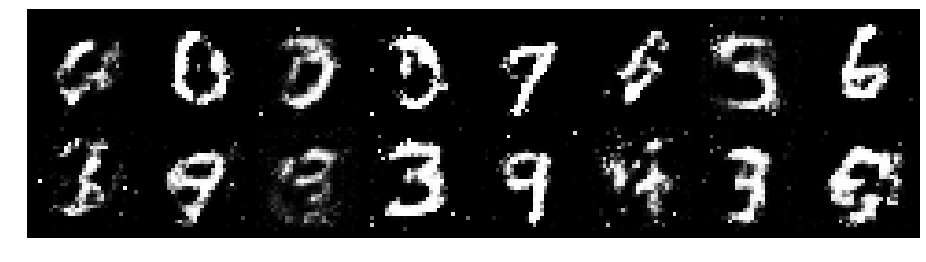

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.0788, Generator Loss: 1.1732
D(x): 0.6683, D(G(z)): 0.4212
64 min	 59.326560974121094 sec


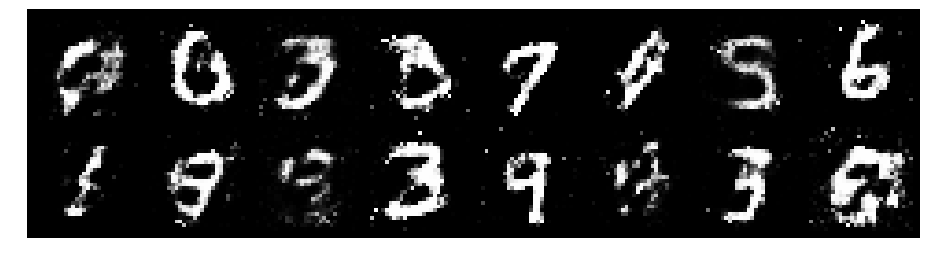

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.1103, Generator Loss: 1.2347
D(x): 0.5818, D(G(z)): 0.3362
65 min	 15.309667348861694 sec


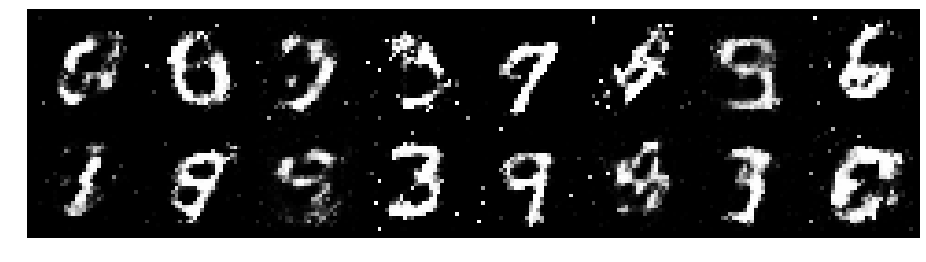

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.1612, Generator Loss: 1.3419
D(x): 0.5949, D(G(z)): 0.3461
65 min	 32.155317306518555 sec


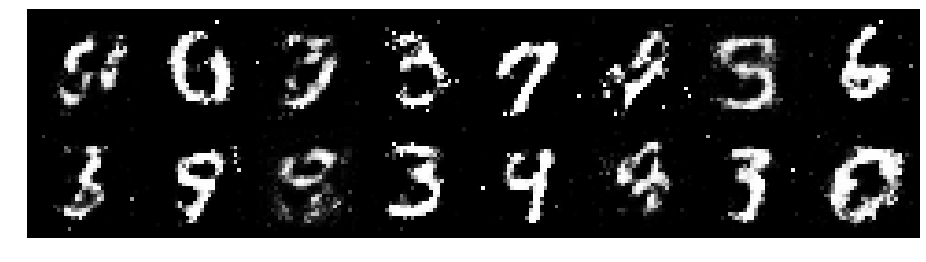

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.1733, Generator Loss: 1.0423
D(x): 0.6158, D(G(z)): 0.3978
65 min	 48.27780318260193 sec


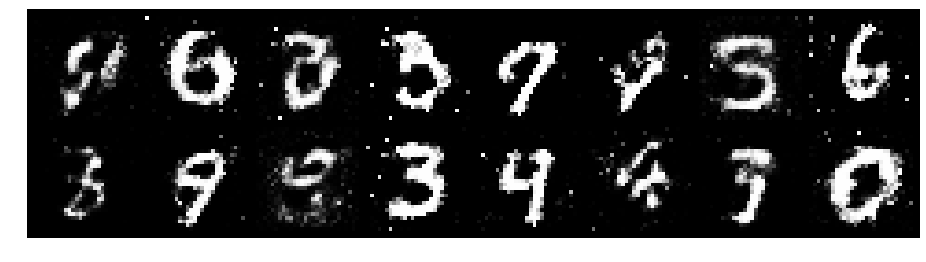

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.1730, Generator Loss: 1.0753
D(x): 0.6305, D(G(z)): 0.4019
66 min	 5.475116729736328 sec


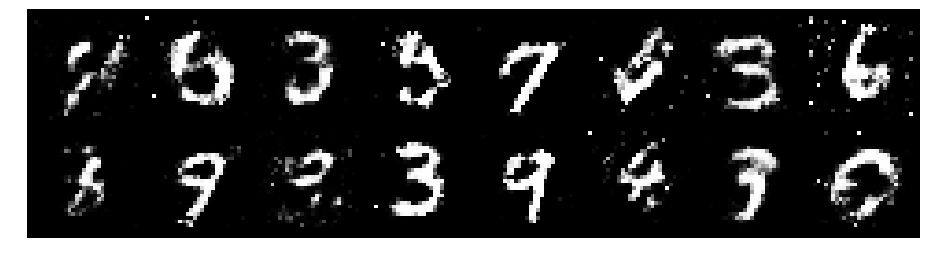

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.0175, Generator Loss: 1.2575
D(x): 0.6727, D(G(z)): 0.3498
66 min	 22.28902292251587 sec


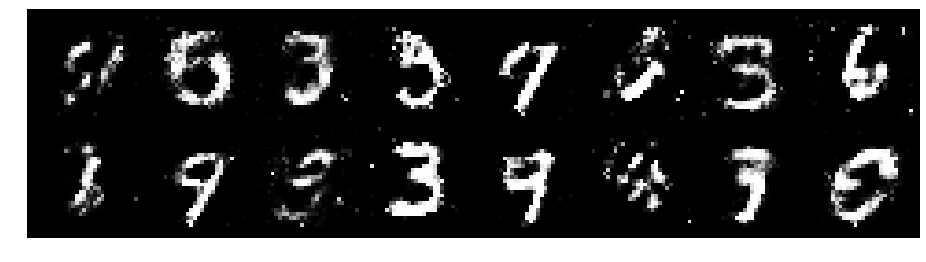

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.0943, Generator Loss: 1.1561
D(x): 0.6717, D(G(z)): 0.4066
66 min	 39.560242891311646 sec


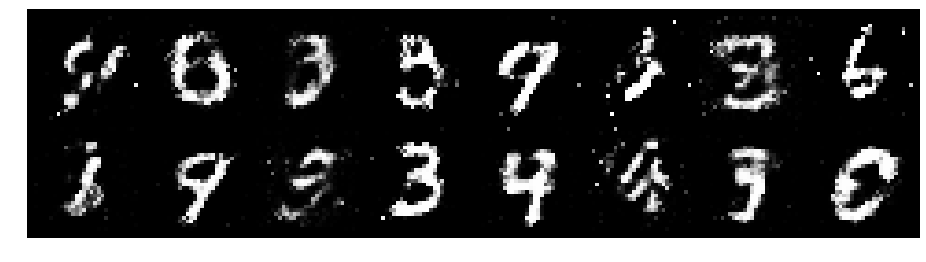

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.0241, Generator Loss: 1.2465
D(x): 0.6531, D(G(z)): 0.3363
66 min	 55.56269454956055 sec


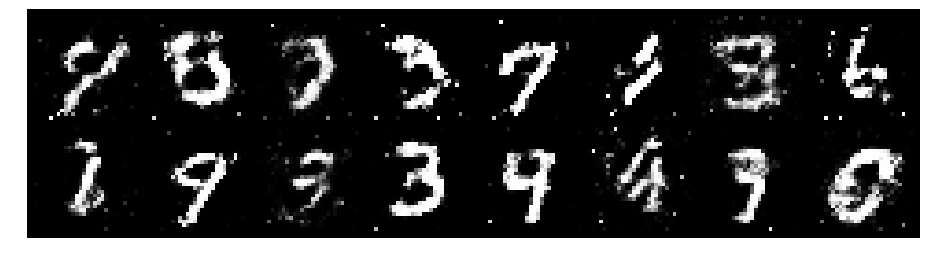

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 0.9492, Generator Loss: 1.8049
D(x): 0.6816, D(G(z)): 0.3041
67 min	 13.52037763595581 sec


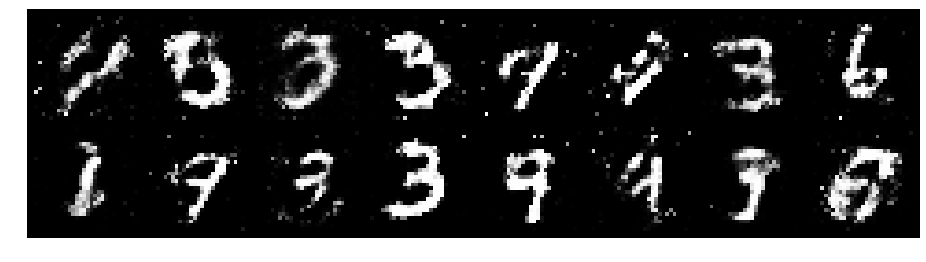

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.1129, Generator Loss: 1.5718
D(x): 0.6010, D(G(z)): 0.2888
67 min	 30.630892992019653 sec


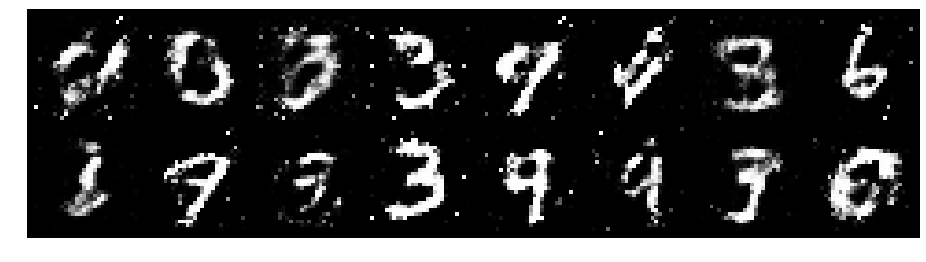

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.0733, Generator Loss: 1.3032
D(x): 0.6884, D(G(z)): 0.3852
67 min	 46.77519989013672 sec


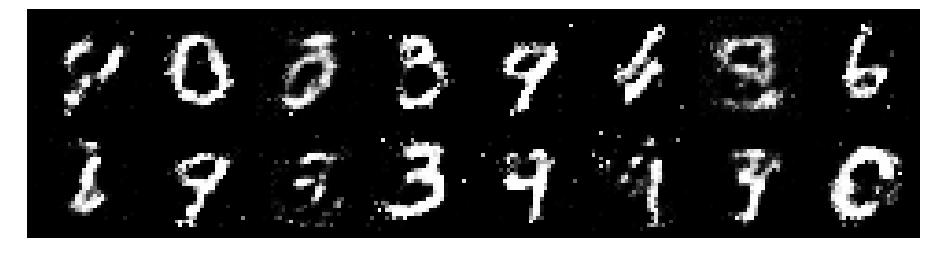

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.0918, Generator Loss: 1.2428
D(x): 0.6548, D(G(z)): 0.3911
68 min	 4.059811115264893 sec


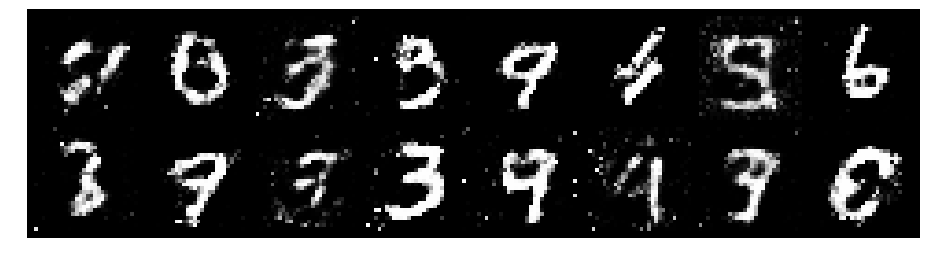

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 0.9839, Generator Loss: 1.3805
D(x): 0.7544, D(G(z)): 0.4131
68 min	 20.685238361358643 sec


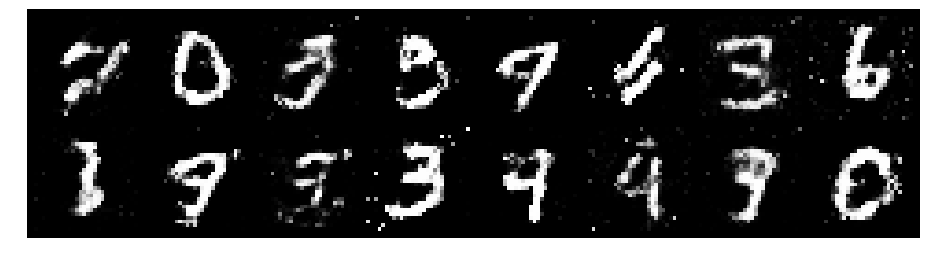

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.0484, Generator Loss: 1.4343
D(x): 0.6716, D(G(z)): 0.3634
68 min	 37.59586572647095 sec


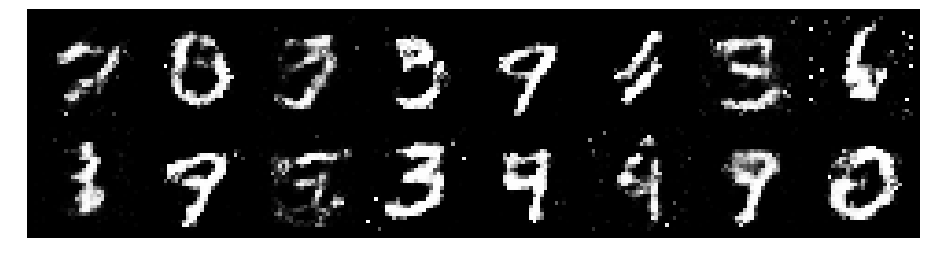

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.0824, Generator Loss: 1.5790
D(x): 0.5554, D(G(z)): 0.2675
68 min	 53.66577219963074 sec


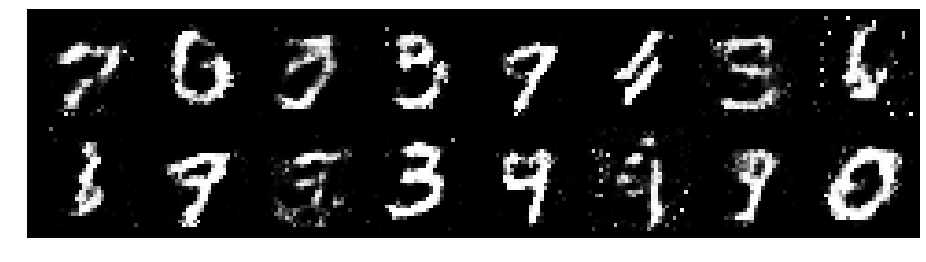

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.1621, Generator Loss: 1.4129
D(x): 0.5513, D(G(z)): 0.2978
69 min	 10.478191614151001 sec


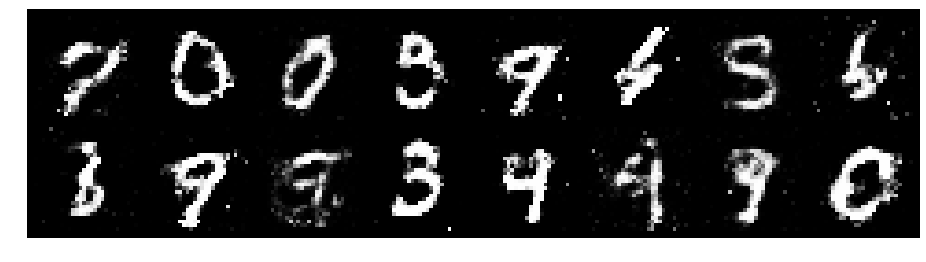

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 0.9621, Generator Loss: 1.2172
D(x): 0.6808, D(G(z)): 0.3553
69 min	 26.30357074737549 sec


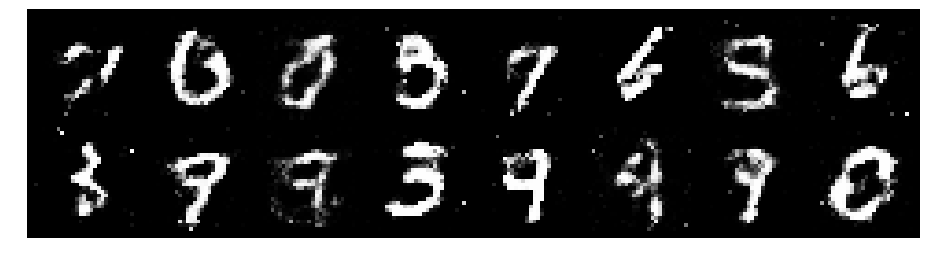

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.0562, Generator Loss: 1.2728
D(x): 0.6307, D(G(z)): 0.3489
69 min	 43.6526620388031 sec


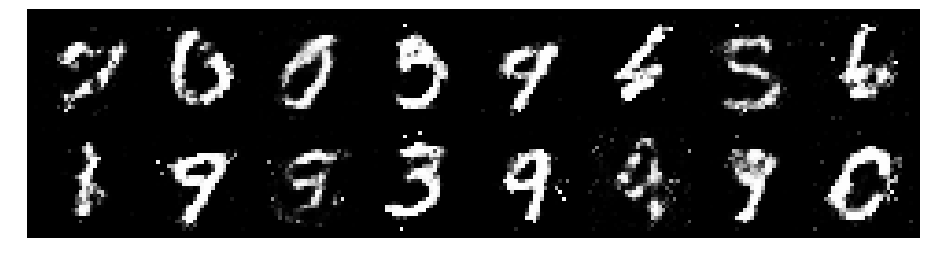

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 0.9075, Generator Loss: 1.2718
D(x): 0.6721, D(G(z)): 0.3510
70 min	 0.8474960327148438 sec


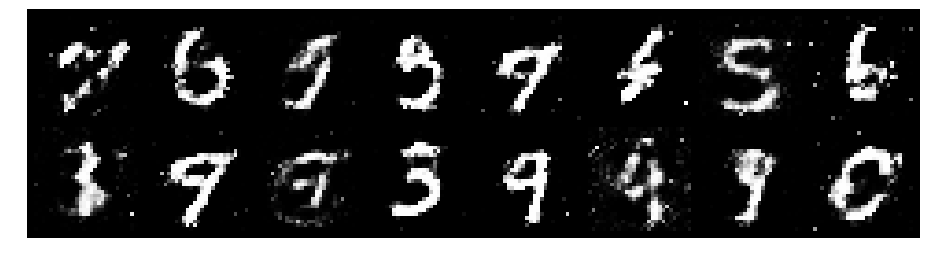

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 0.9873, Generator Loss: 1.4362
D(x): 0.6604, D(G(z)): 0.3580
70 min	 17.5299654006958 sec


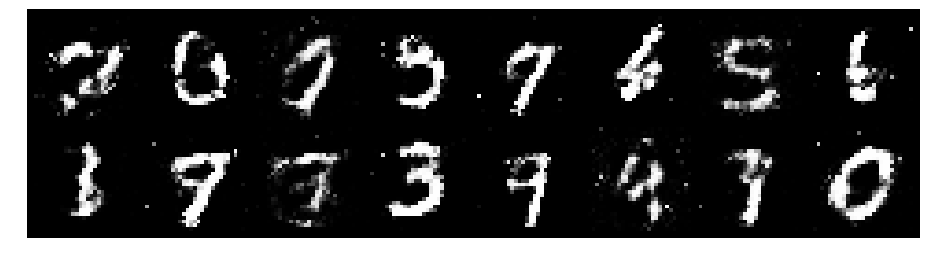

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.1585, Generator Loss: 1.2416
D(x): 0.5728, D(G(z)): 0.3123
70 min	 34.60873603820801 sec


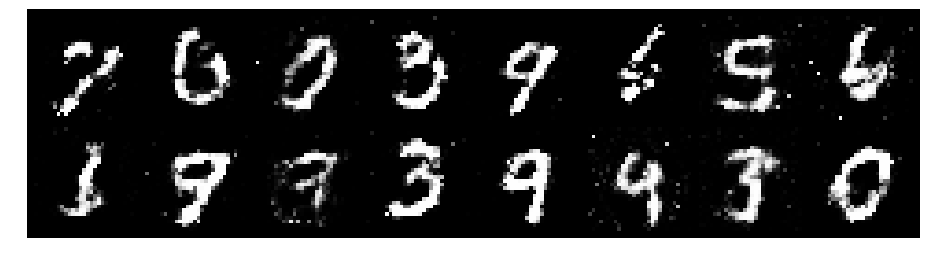

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.0930, Generator Loss: 1.3630
D(x): 0.5709, D(G(z)): 0.3143
70 min	 50.8914258480072 sec


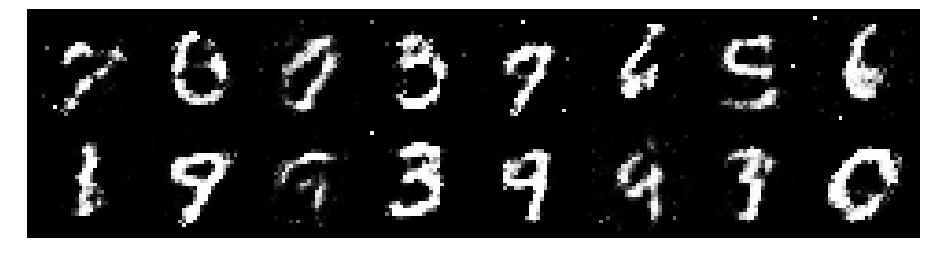

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.2299, Generator Loss: 1.2274
D(x): 0.5776, D(G(z)): 0.3621
71 min	 8.176037073135376 sec


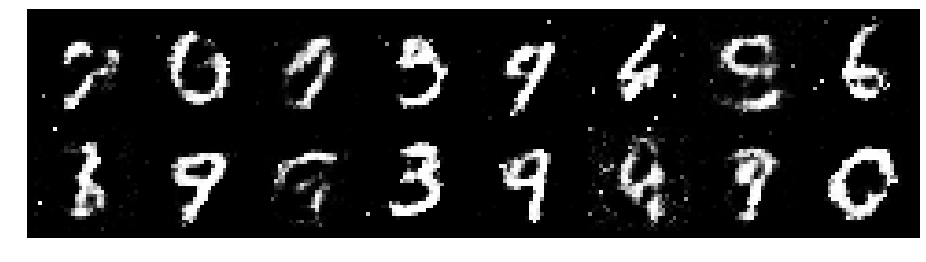

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.2832, Generator Loss: 1.2464
D(x): 0.5555, D(G(z)): 0.3811
71 min	 24.411608695983887 sec


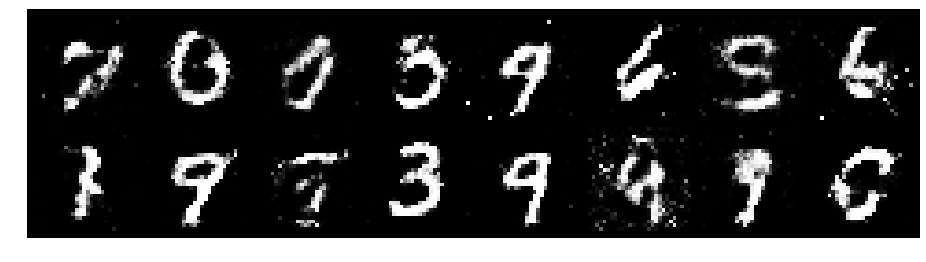

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.1928, Generator Loss: 1.4598
D(x): 0.6162, D(G(z)): 0.3781
71 min	 41.69572329521179 sec


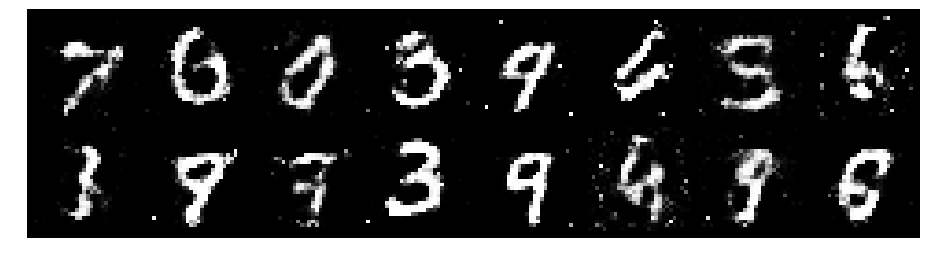

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.0379, Generator Loss: 1.4955
D(x): 0.6503, D(G(z)): 0.3439
71 min	 57.6346869468689 sec


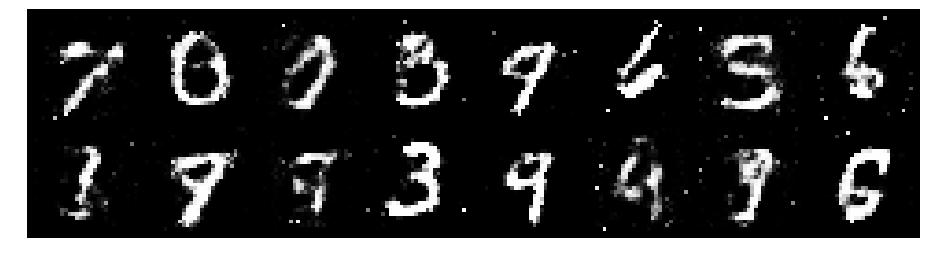

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.1318, Generator Loss: 1.2513
D(x): 0.6078, D(G(z)): 0.3522
72 min	 15.69851541519165 sec


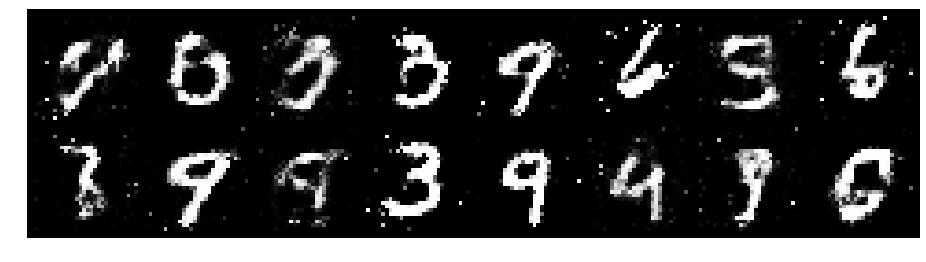

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.1076, Generator Loss: 1.2053
D(x): 0.6464, D(G(z)): 0.3948
72 min	 33.01090145111084 sec


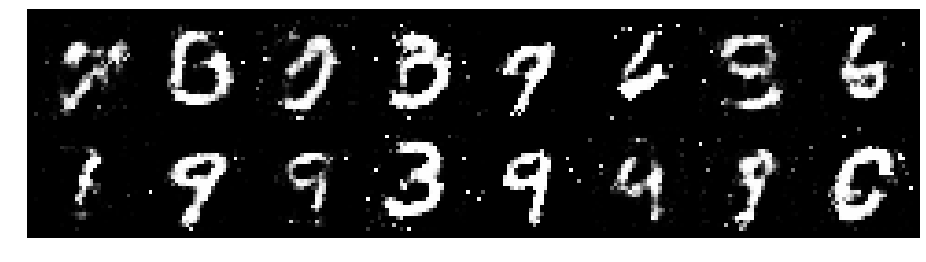

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.1892, Generator Loss: 1.0475
D(x): 0.5723, D(G(z)): 0.3797
72 min	 49.317399978637695 sec


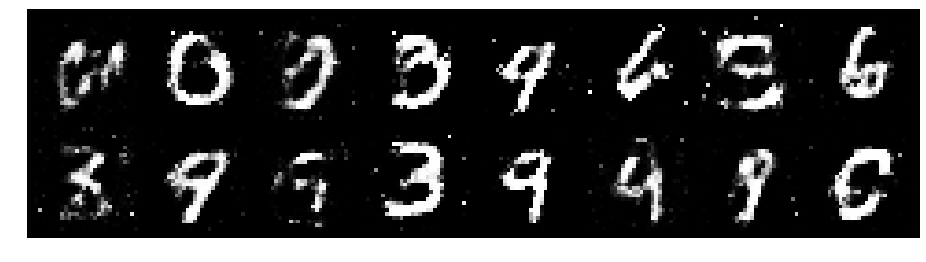

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.1442, Generator Loss: 1.1511
D(x): 0.6022, D(G(z)): 0.3899
73 min	 6.593579292297363 sec


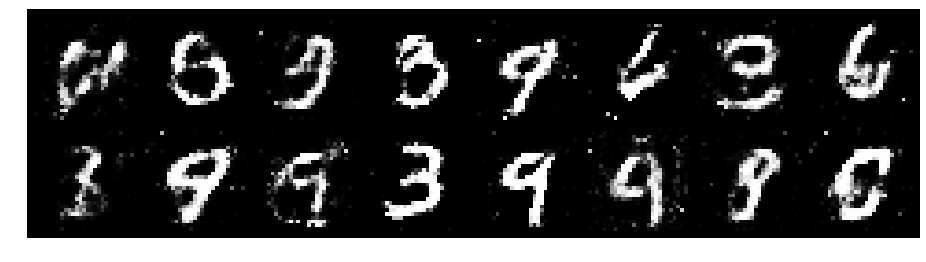

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.0640, Generator Loss: 1.2883
D(x): 0.6051, D(G(z)): 0.3363
73 min	 22.942734479904175 sec


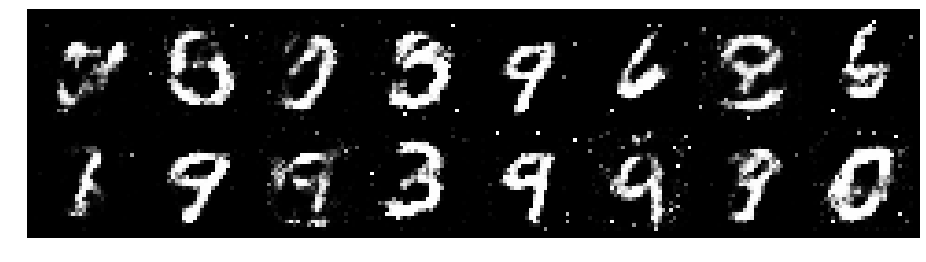

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.0630, Generator Loss: 1.3757
D(x): 0.6082, D(G(z)): 0.3473
73 min	 40.069618940353394 sec


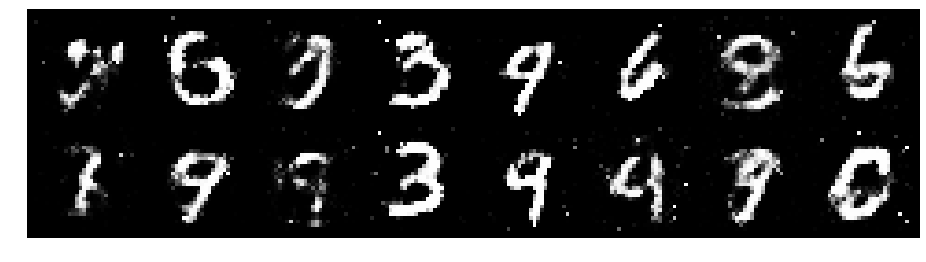

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.0453, Generator Loss: 1.4099
D(x): 0.5925, D(G(z)): 0.2877
73 min	 56.46589279174805 sec


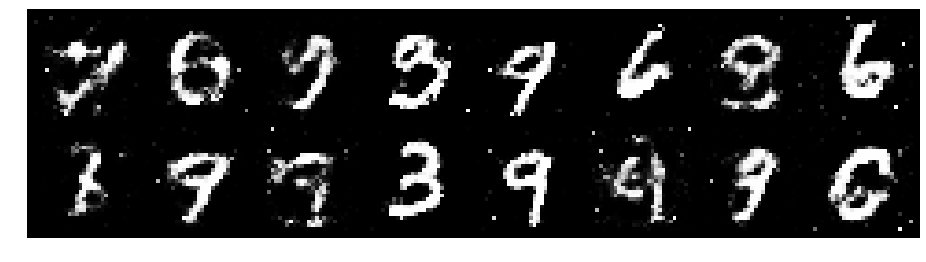

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.0361, Generator Loss: 1.5059
D(x): 0.6112, D(G(z)): 0.3030
74 min	 14.746968984603882 sec


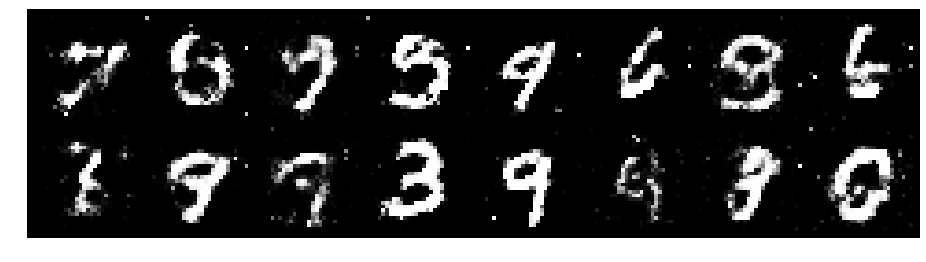

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.0370, Generator Loss: 1.6018
D(x): 0.6565, D(G(z)): 0.3230
74 min	 32.26966094970703 sec


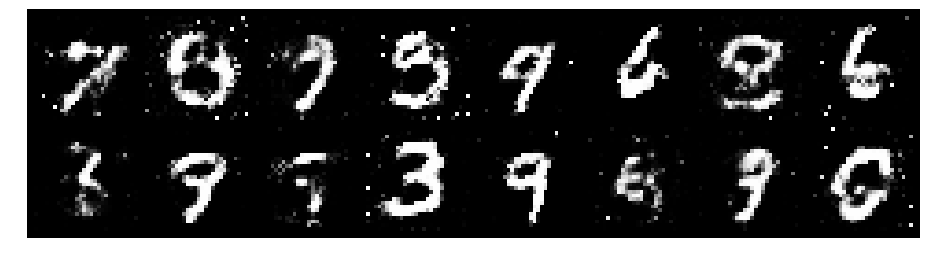

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 0.9747, Generator Loss: 1.4505
D(x): 0.6774, D(G(z)): 0.3538
74 min	 48.097023725509644 sec


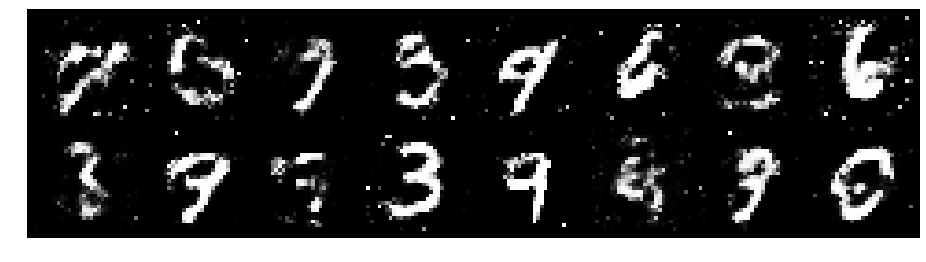

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.0165, Generator Loss: 1.4574
D(x): 0.6847, D(G(z)): 0.3587
75 min	 5.41883397102356 sec


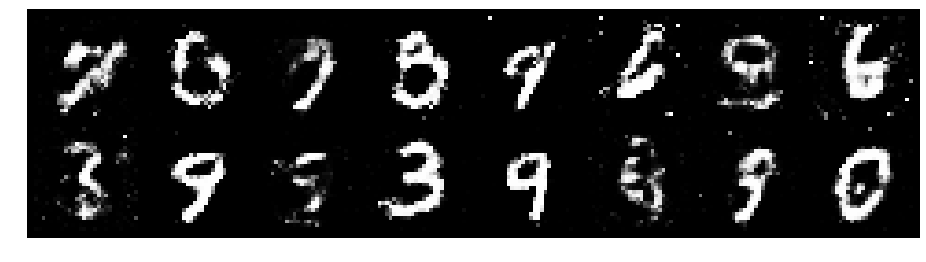

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.1083, Generator Loss: 1.1133
D(x): 0.6606, D(G(z)): 0.3835
75 min	 22.33442211151123 sec


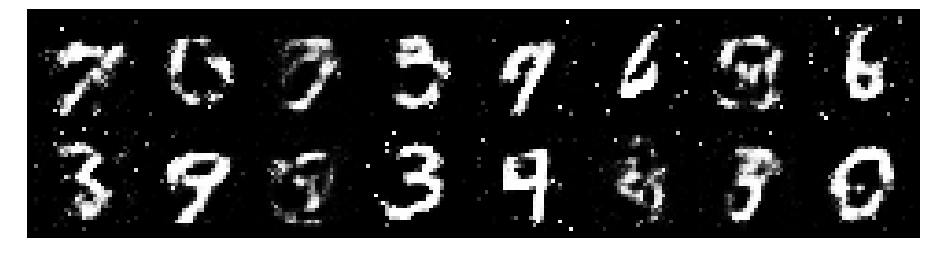

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.0472, Generator Loss: 1.1616
D(x): 0.6451, D(G(z)): 0.3875
75 min	 40.79752850532532 sec


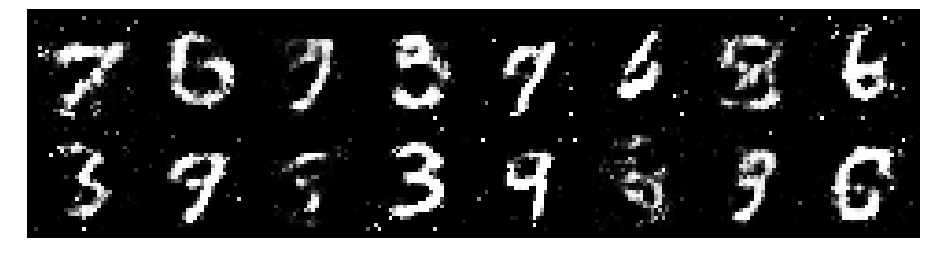

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.1768, Generator Loss: 1.0609
D(x): 0.6062, D(G(z)): 0.4019
75 min	 57.45023560523987 sec


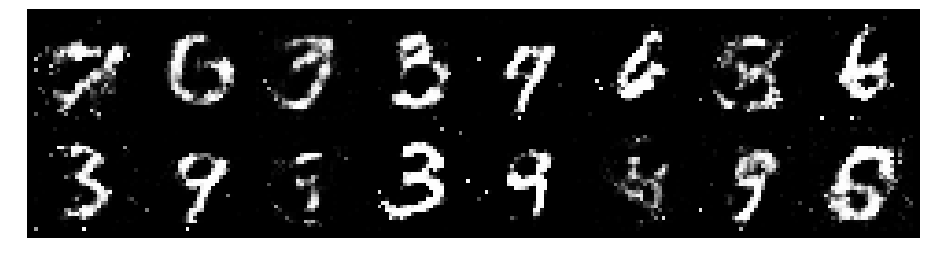

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.1763, Generator Loss: 1.4676
D(x): 0.6498, D(G(z)): 0.3436
76 min	 16.594847917556763 sec


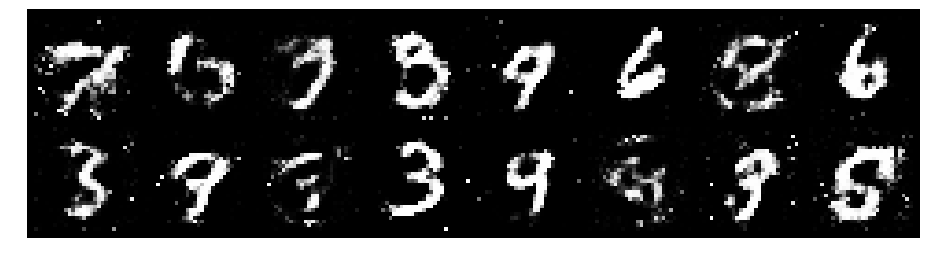

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.1039, Generator Loss: 1.0386
D(x): 0.6568, D(G(z)): 0.4117
76 min	 39.8909797668457 sec


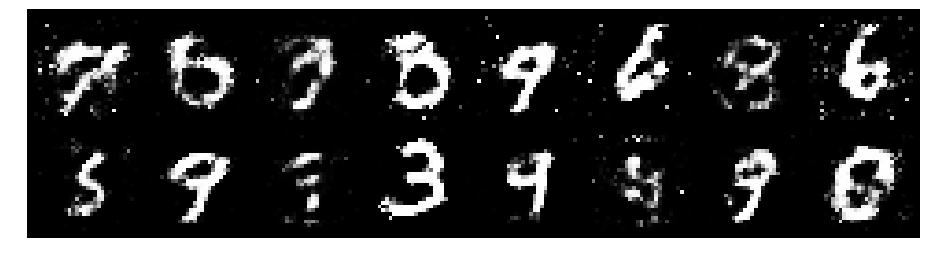

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.2331, Generator Loss: 1.1521
D(x): 0.5217, D(G(z)): 0.3606
77 min	 3.999561071395874 sec


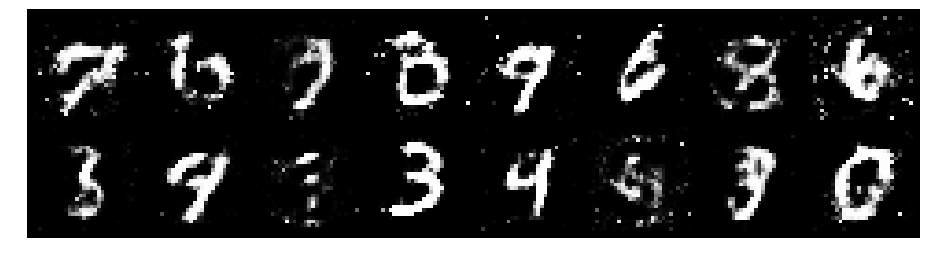

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.2687, Generator Loss: 1.0244
D(x): 0.6038, D(G(z)): 0.4279
77 min	 20.996492385864258 sec


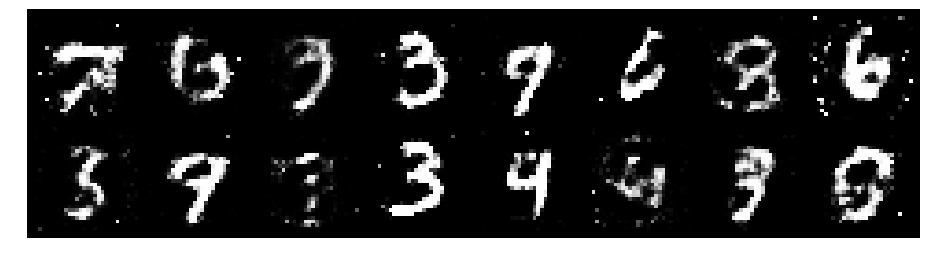

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.2631, Generator Loss: 1.4339
D(x): 0.5641, D(G(z)): 0.3805
77 min	 38.00383996963501 sec


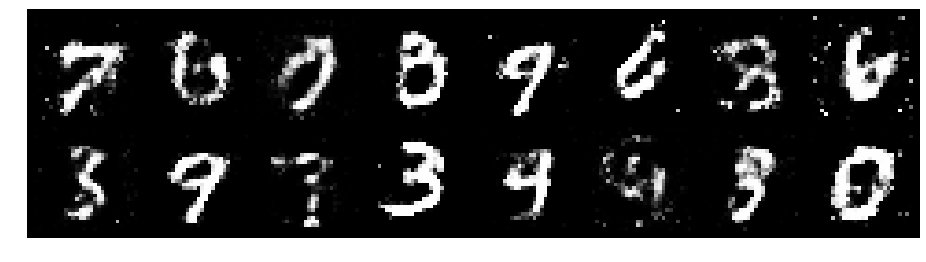

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.2208, Generator Loss: 0.9967
D(x): 0.6073, D(G(z)): 0.4140
77 min	 54.29496192932129 sec


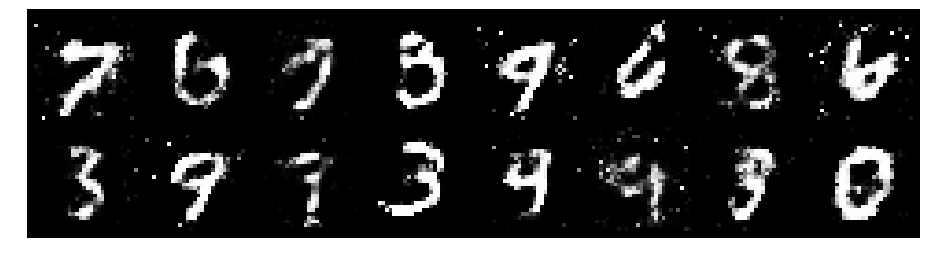

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.1631, Generator Loss: 1.0419
D(x): 0.6303, D(G(z)): 0.3961
78 min	 12.450549364089966 sec


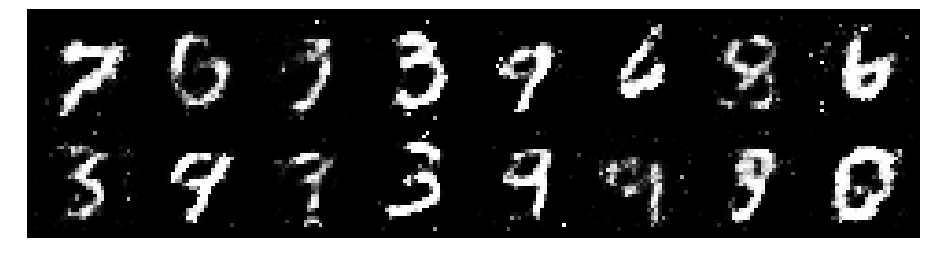

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 0.9404, Generator Loss: 1.0890
D(x): 0.6658, D(G(z)): 0.3139
78 min	 28.99215292930603 sec


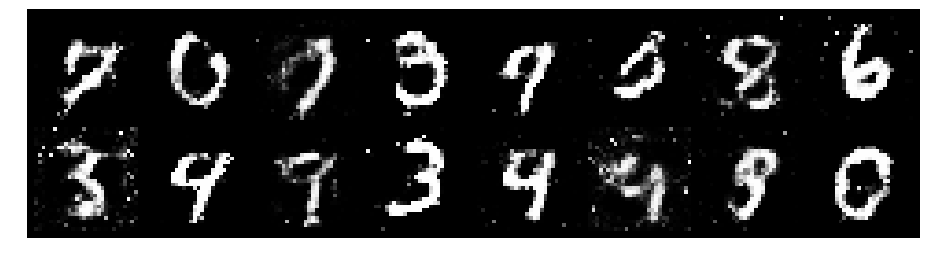

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.0793, Generator Loss: 1.2316
D(x): 0.6021, D(G(z)): 0.3586
78 min	 46.31991672515869 sec


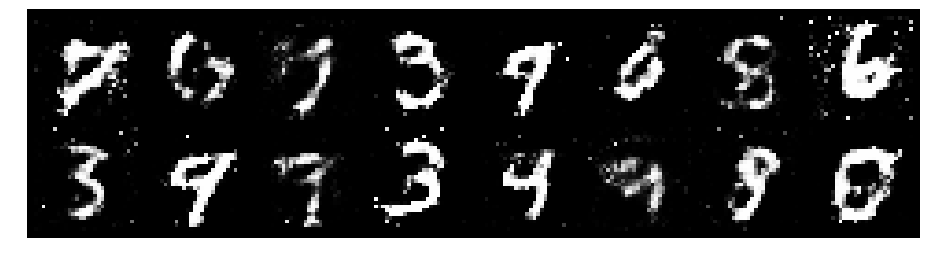

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.0306, Generator Loss: 1.0658
D(x): 0.6177, D(G(z)): 0.3660
79 min	 3.9289114475250244 sec


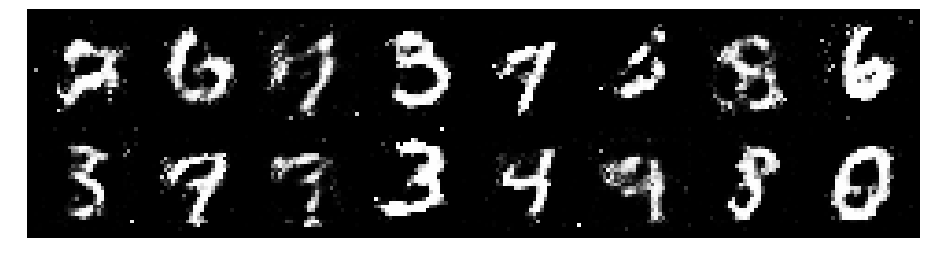

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.0662, Generator Loss: 1.0558
D(x): 0.6427, D(G(z)): 0.4056
79 min	 19.644177675247192 sec


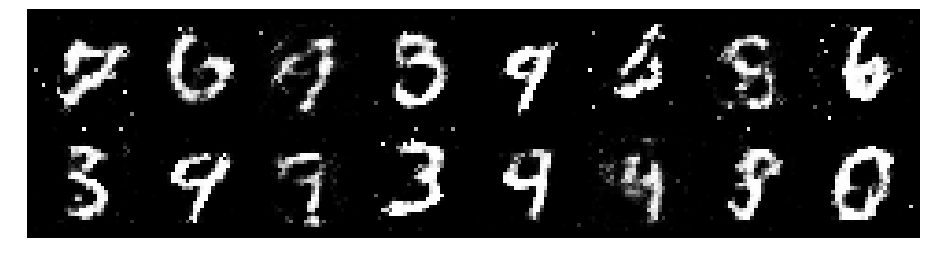

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.1248, Generator Loss: 1.0052
D(x): 0.5765, D(G(z)): 0.3805
79 min	 37.2422616481781 sec


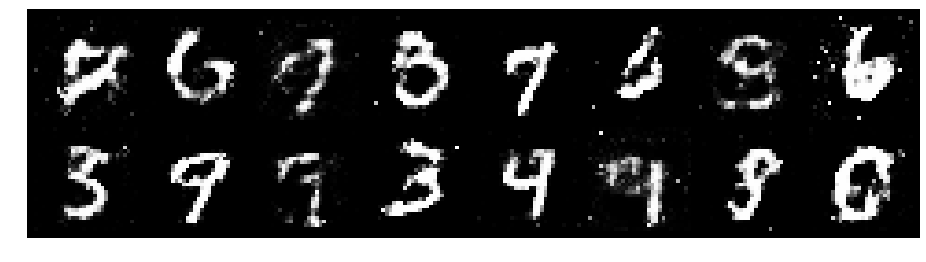

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.2908, Generator Loss: 1.0938
D(x): 0.6151, D(G(z)): 0.4391
79 min	 53.98821759223938 sec


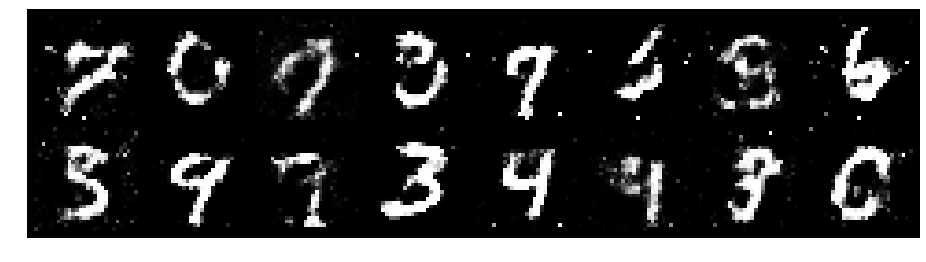

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.0623, Generator Loss: 1.4090
D(x): 0.6040, D(G(z)): 0.3180
80 min	 12.328811883926392 sec


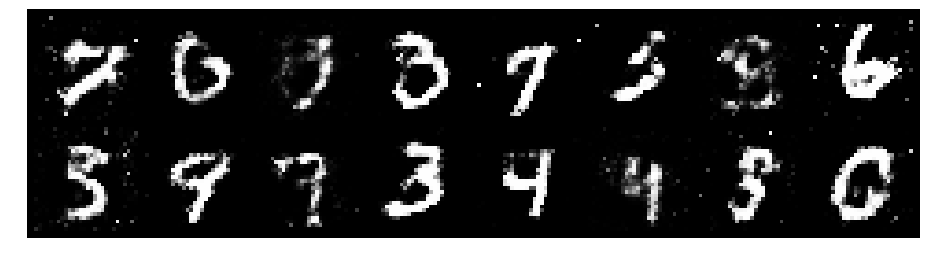

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.0655, Generator Loss: 1.2025
D(x): 0.6424, D(G(z)): 0.3742
80 min	 29.17892861366272 sec


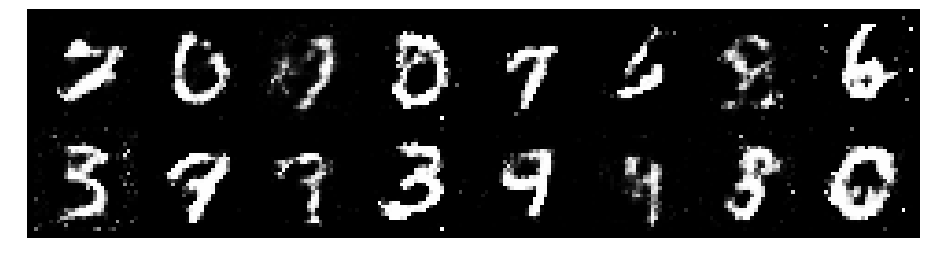

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.0120, Generator Loss: 1.5000
D(x): 0.6215, D(G(z)): 0.3014
80 min	 46.18280267715454 sec


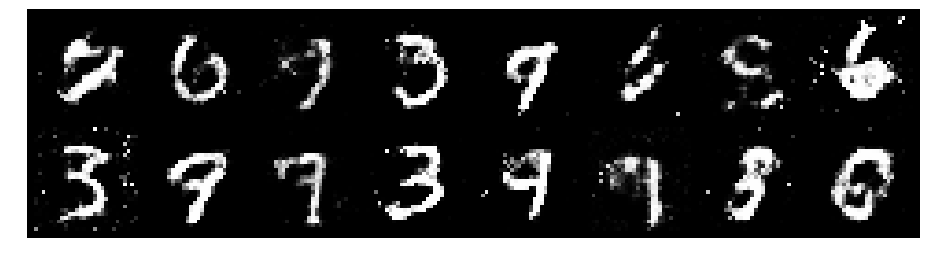

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.2409, Generator Loss: 1.1232
D(x): 0.6674, D(G(z)): 0.4868
81 min	 3.2754621505737305 sec


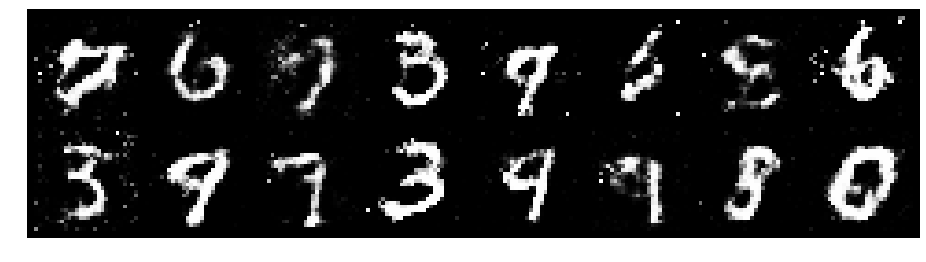

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.2429, Generator Loss: 0.9140
D(x): 0.5577, D(G(z)): 0.4215
81 min	 20.225769519805908 sec


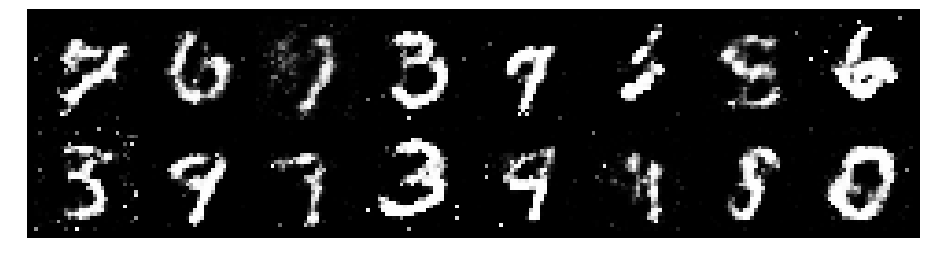

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.0924, Generator Loss: 1.1040
D(x): 0.6494, D(G(z)): 0.3811
81 min	 38.20676374435425 sec


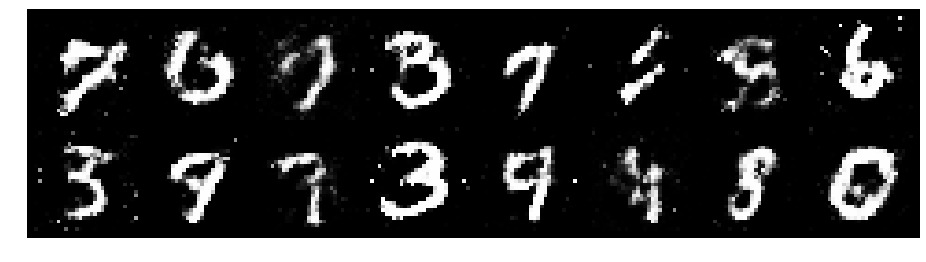

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.3544, Generator Loss: 1.0087
D(x): 0.5751, D(G(z)): 0.4308
81 min	 54.71712064743042 sec


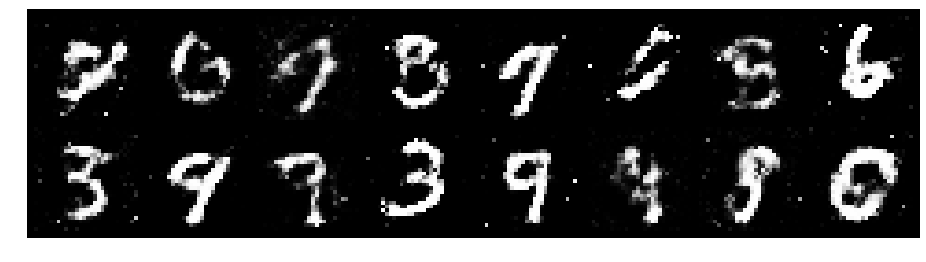

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.2607, Generator Loss: 1.2533
D(x): 0.5827, D(G(z)): 0.3926
82 min	 13.821059465408325 sec


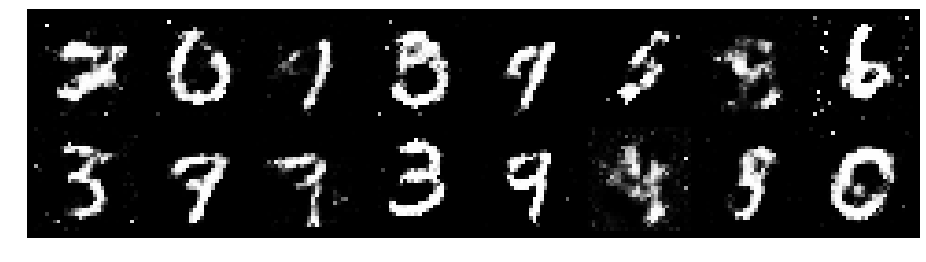

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.1239, Generator Loss: 1.0033
D(x): 0.5919, D(G(z)): 0.3828
82 min	 30.679607152938843 sec


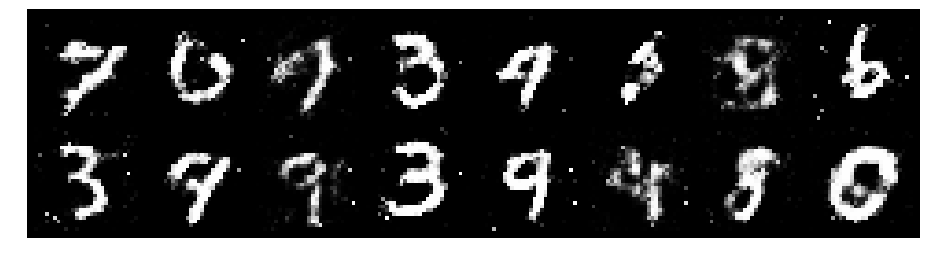

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.1369, Generator Loss: 1.2162
D(x): 0.6067, D(G(z)): 0.3963
82 min	 48.08226561546326 sec


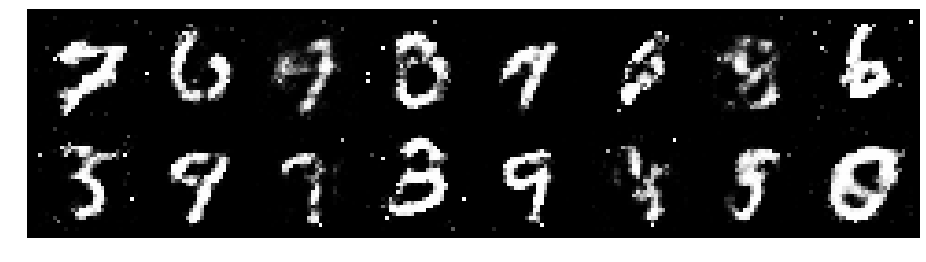

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.0204, Generator Loss: 1.0669
D(x): 0.6751, D(G(z)): 0.4079
83 min	 5.884204387664795 sec


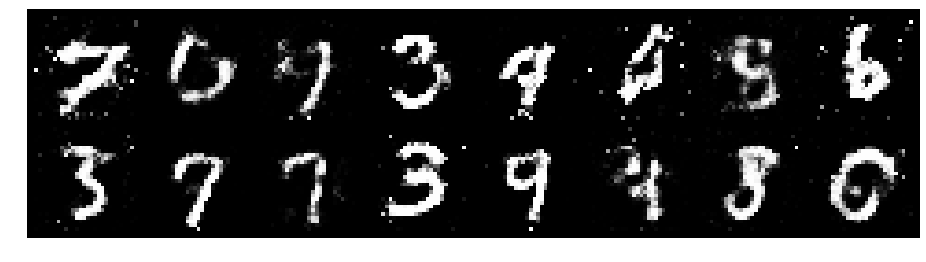

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.0385, Generator Loss: 1.0585
D(x): 0.6504, D(G(z)): 0.3954
83 min	 22.53988766670227 sec


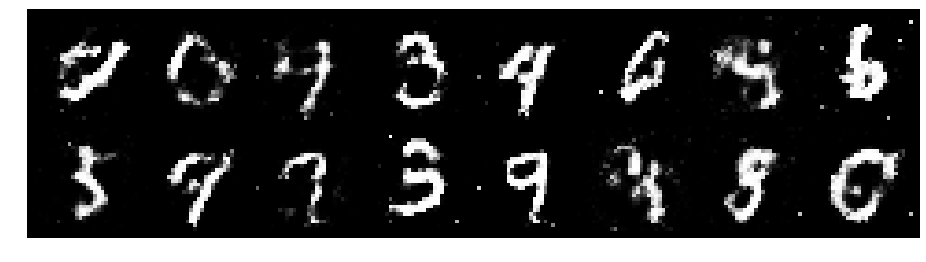

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.1673, Generator Loss: 0.9654
D(x): 0.6036, D(G(z)): 0.4258
83 min	 39.864179372787476 sec


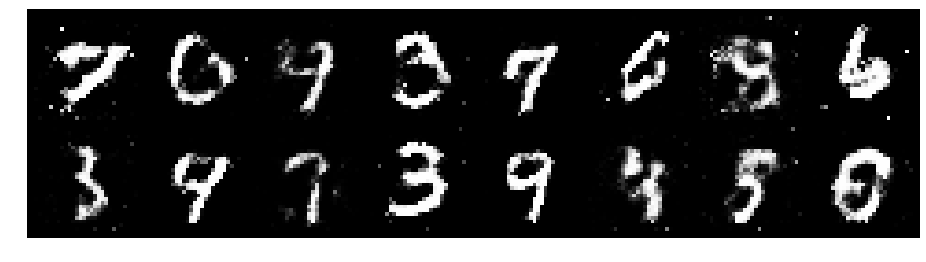

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.0551, Generator Loss: 1.3352
D(x): 0.6445, D(G(z)): 0.3656
83 min	 55.66823053359985 sec


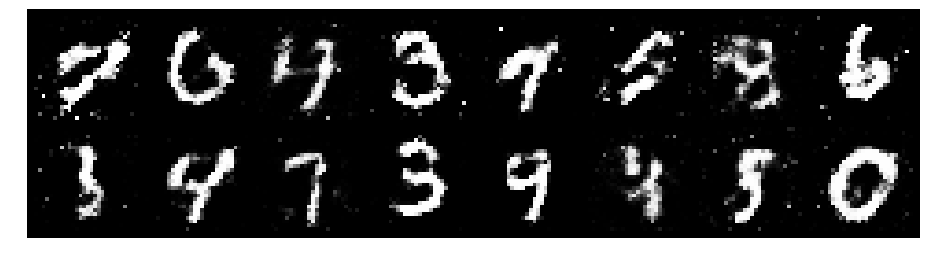

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.1983, Generator Loss: 1.2167
D(x): 0.6128, D(G(z)): 0.3898
84 min	 19.45193123817444 sec


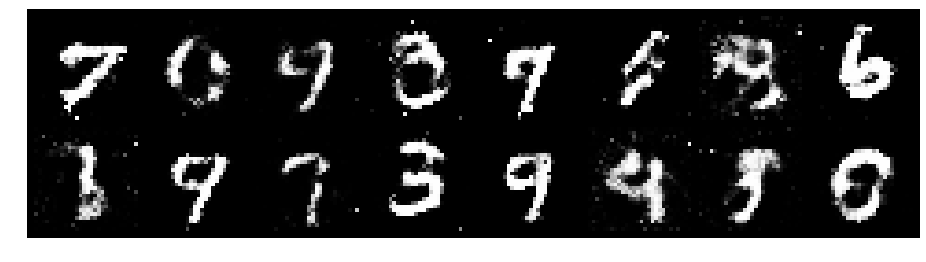

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.0520, Generator Loss: 1.2220
D(x): 0.6190, D(G(z)): 0.3232
109 min	 0.7937531471252441 sec


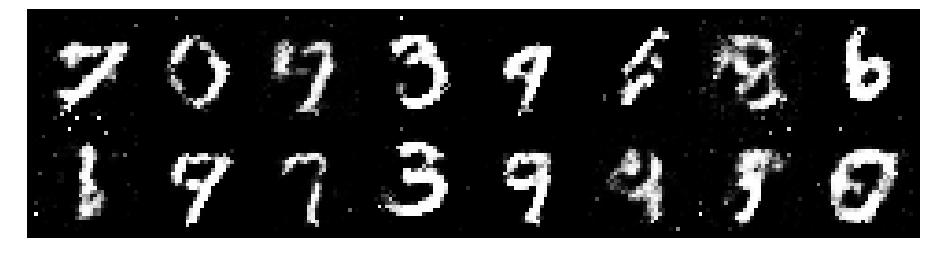

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.1312, Generator Loss: 1.0389
D(x): 0.5917, D(G(z)): 0.3969
164 min	 35.04941010475159 sec


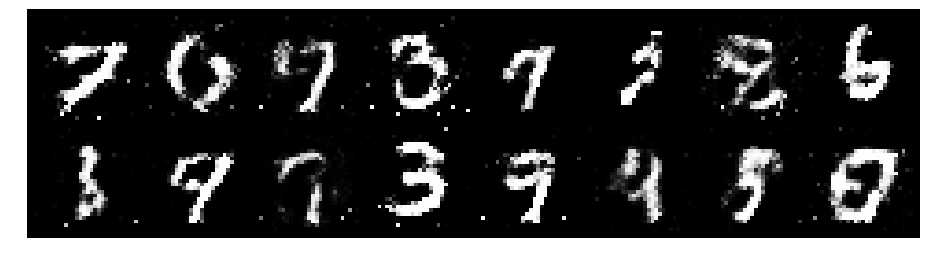

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.1559, Generator Loss: 1.0043
D(x): 0.5969, D(G(z)): 0.4204
165 min	 3.9890313148498535 sec


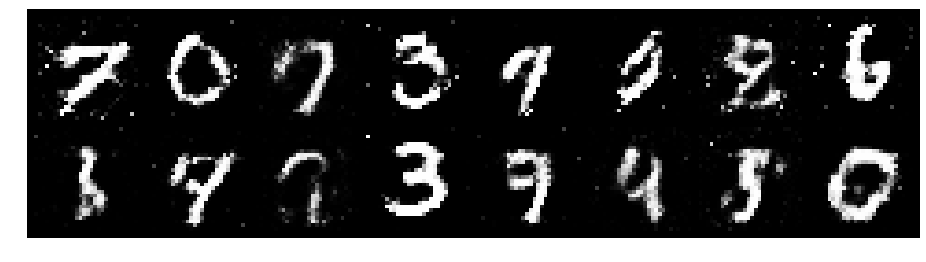

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.2315, Generator Loss: 1.0558
D(x): 0.5782, D(G(z)): 0.4031
165 min	 30.285468339920044 sec


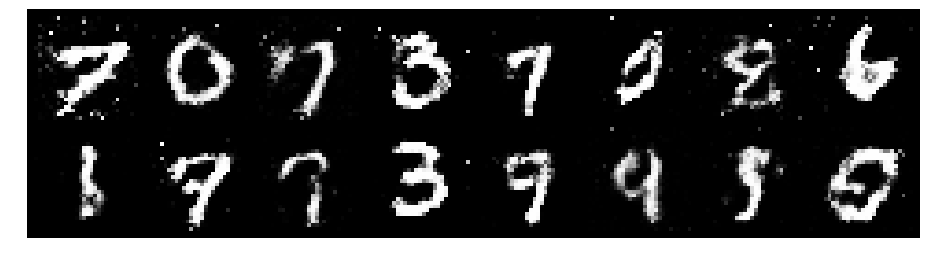

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.2080, Generator Loss: 1.2113
D(x): 0.6690, D(G(z)): 0.4383
165 min	 57.721713066101074 sec


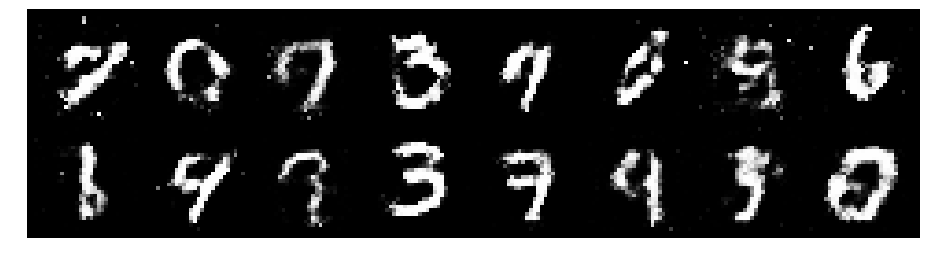

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.2140, Generator Loss: 1.2166
D(x): 0.5704, D(G(z)): 0.4075
166 min	 26.290327787399292 sec


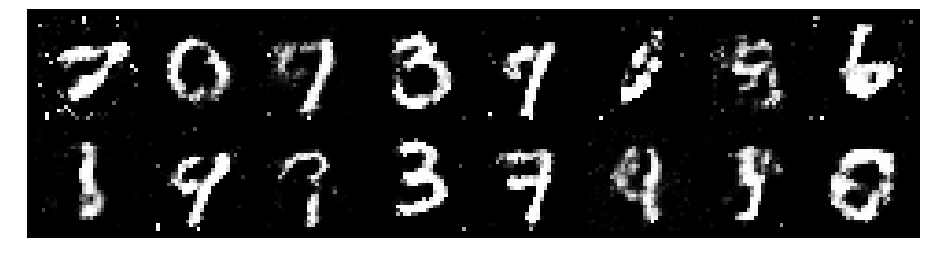

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.1792, Generator Loss: 1.1248
D(x): 0.5920, D(G(z)): 0.3725
166 min	 52.89775633811951 sec


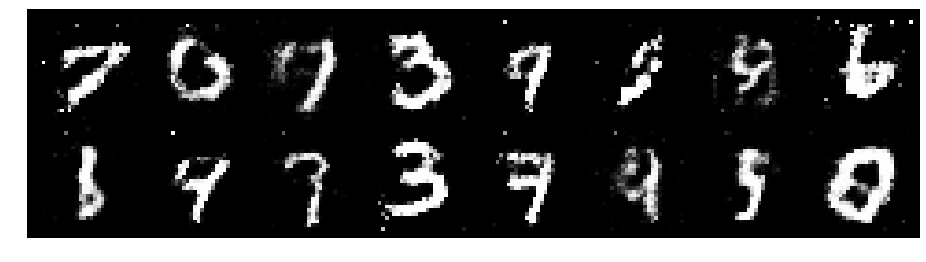

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.2033, Generator Loss: 1.0431
D(x): 0.5845, D(G(z)): 0.4288
167 min	 15.169156074523926 sec


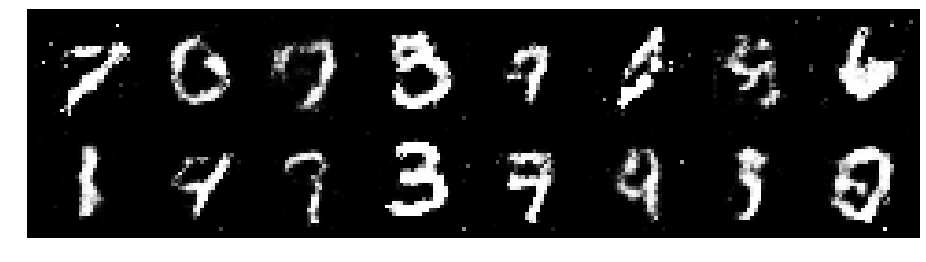

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.1726, Generator Loss: 1.1286
D(x): 0.6009, D(G(z)): 0.4150
167 min	 38.66715717315674 sec


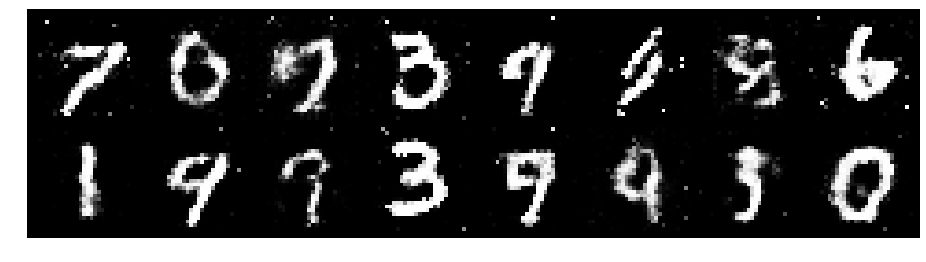

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.3345, Generator Loss: 1.0451
D(x): 0.5508, D(G(z)): 0.4432
168 min	 4.390713691711426 sec


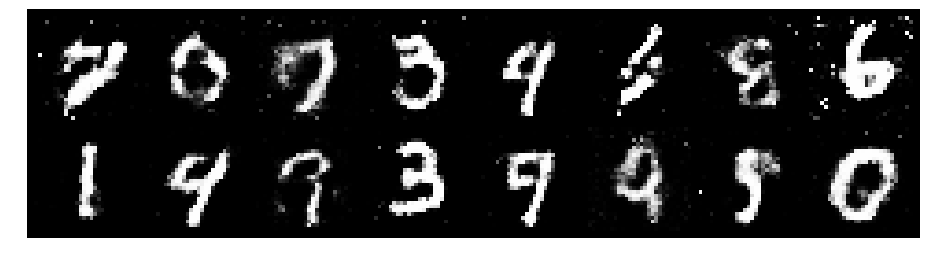

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.2635, Generator Loss: 0.9121
D(x): 0.5785, D(G(z)): 0.4230
168 min	 27.06139063835144 sec


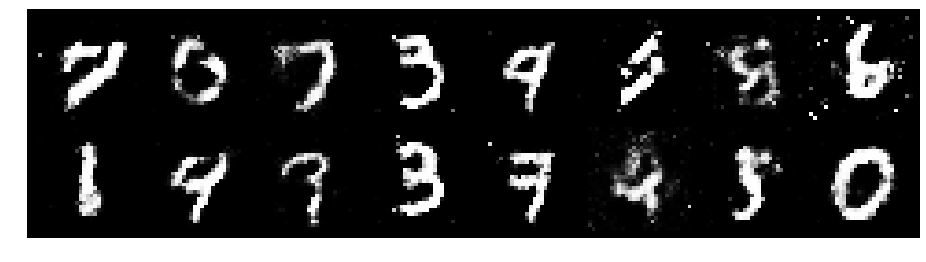

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.2072, Generator Loss: 0.9958
D(x): 0.5667, D(G(z)): 0.3739
168 min	 55.527827501297 sec


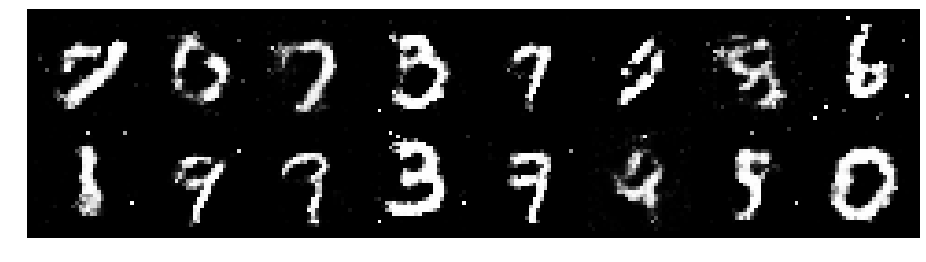

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.2055, Generator Loss: 1.0504
D(x): 0.5907, D(G(z)): 0.4349
169 min	 21.04901671409607 sec


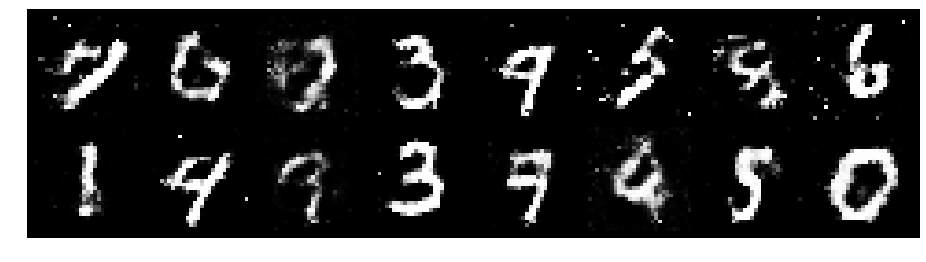

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.0927, Generator Loss: 1.2570
D(x): 0.6487, D(G(z)): 0.3615
169 min	 46.359901666641235 sec


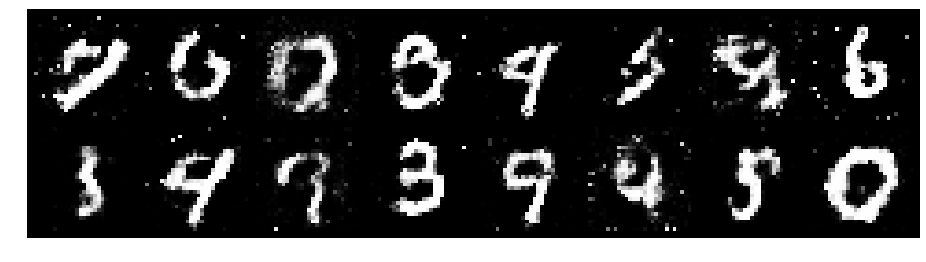

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.1802, Generator Loss: 1.1815
D(x): 0.5858, D(G(z)): 0.4022
170 min	 8.493409395217896 sec


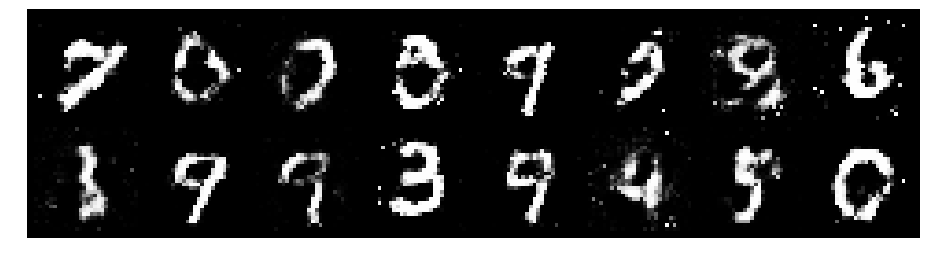

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.1094, Generator Loss: 0.9821
D(x): 0.6035, D(G(z)): 0.3847
170 min	 29.72320580482483 sec


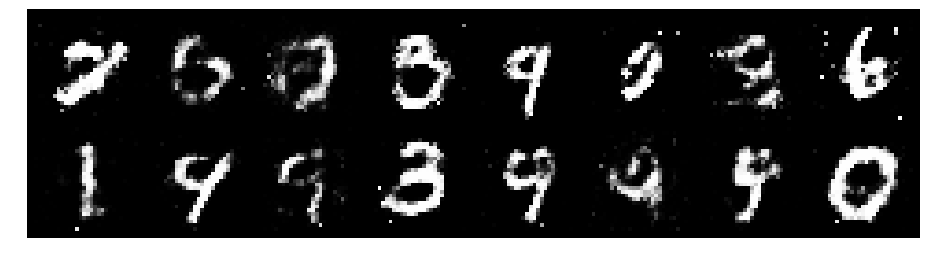

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.1009, Generator Loss: 1.1276
D(x): 0.6171, D(G(z)): 0.3619
171 min	 1.1517550945281982 sec


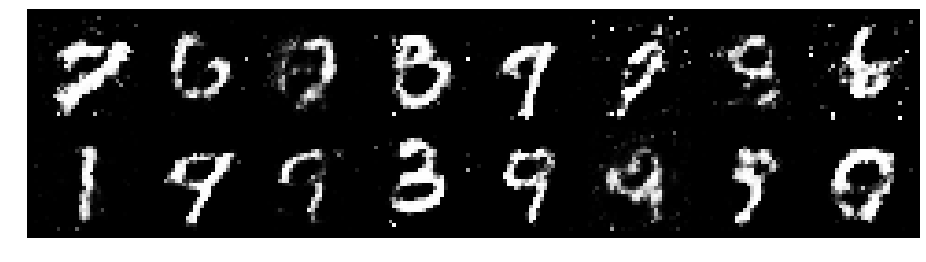

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 0.9775, Generator Loss: 1.3955
D(x): 0.6448, D(G(z)): 0.3270
171 min	 31.48017692565918 sec


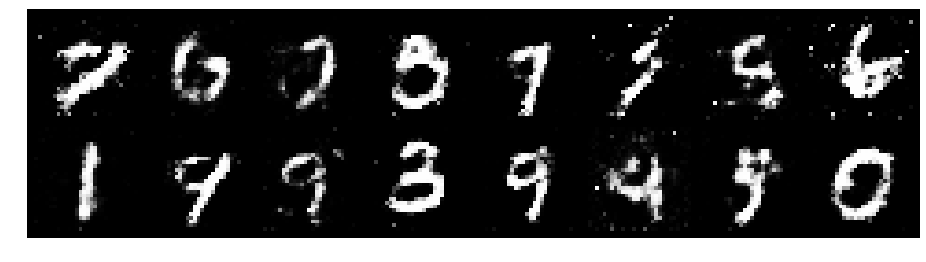

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 0.8618, Generator Loss: 1.2928
D(x): 0.6922, D(G(z)): 0.3114
172 min	 4.524198532104492 sec


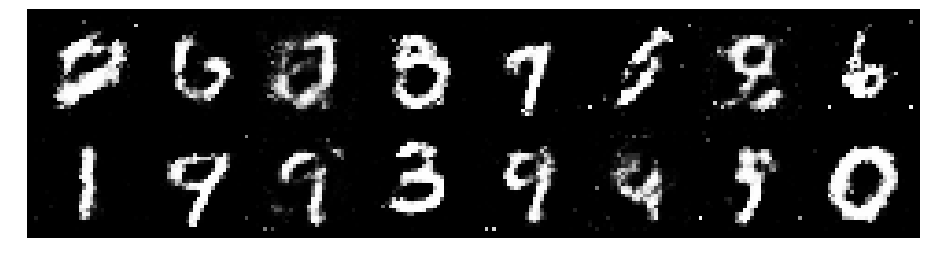

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 0.9864, Generator Loss: 1.1139
D(x): 0.6863, D(G(z)): 0.3899
172 min	 35.43393397331238 sec


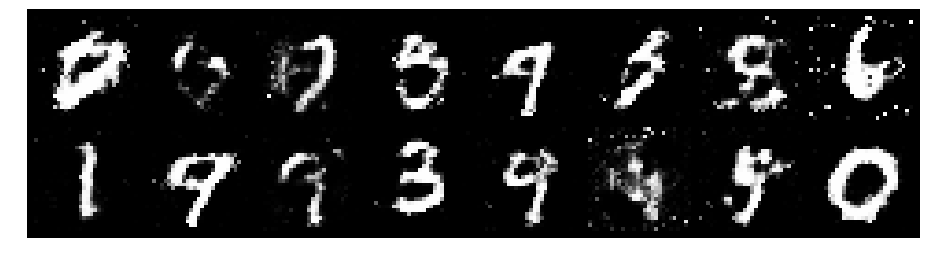

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 0.9836, Generator Loss: 1.4975
D(x): 0.6488, D(G(z)): 0.3356
172 min	 59.294513463974 sec


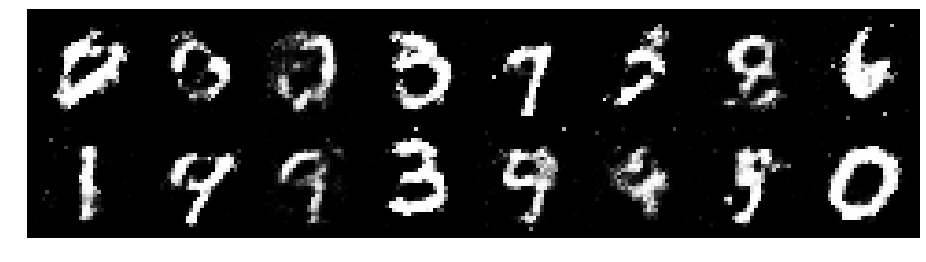

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.2524, Generator Loss: 0.9273
D(x): 0.5652, D(G(z)): 0.4124
173 min	 24.628710746765137 sec


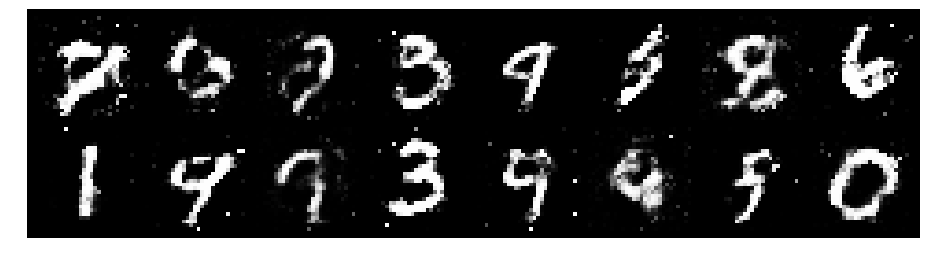

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.2966, Generator Loss: 0.8957
D(x): 0.5676, D(G(z)): 0.4380
173 min	 49.50112986564636 sec


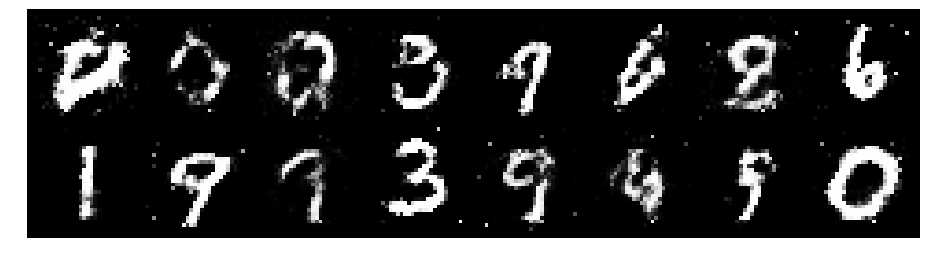

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.2303, Generator Loss: 0.8812
D(x): 0.5834, D(G(z)): 0.4027
174 min	 15.048111200332642 sec


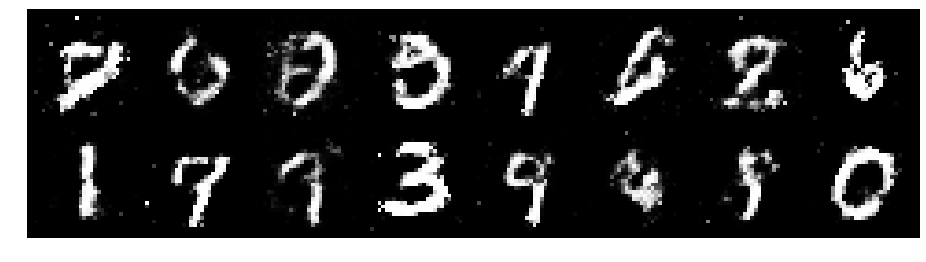

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.2118, Generator Loss: 0.7891
D(x): 0.5755, D(G(z)): 0.4229
174 min	 37.5635404586792 sec


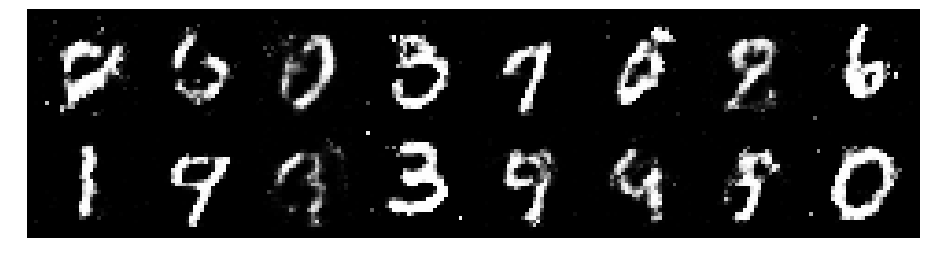

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.4281, Generator Loss: 1.0568
D(x): 0.5259, D(G(z)): 0.4064
175 min	 1.6949362754821777 sec


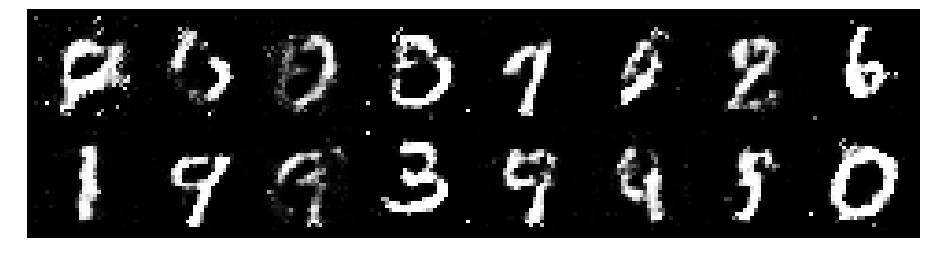

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.1469, Generator Loss: 1.3470
D(x): 0.6244, D(G(z)): 0.3950
175 min	 23.75999665260315 sec


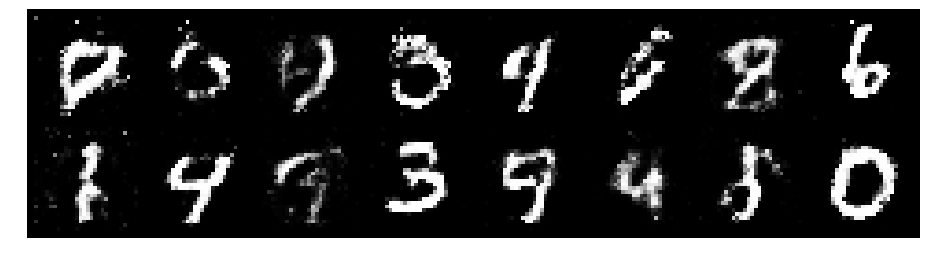

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.1367, Generator Loss: 0.8649
D(x): 0.6171, D(G(z)): 0.4247
175 min	 46.447041511535645 sec


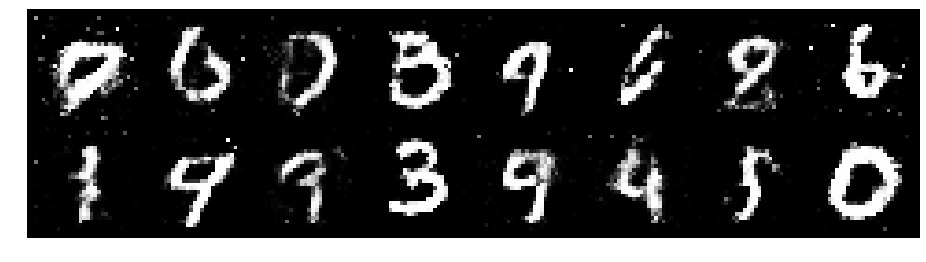

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.3918, Generator Loss: 0.9534
D(x): 0.5060, D(G(z)): 0.4245
176 min	 6.895637273788452 sec


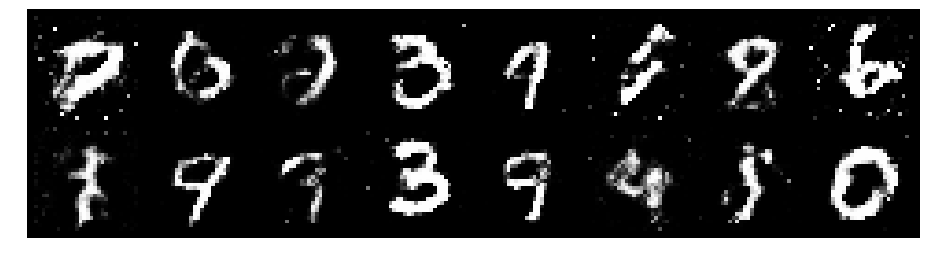

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.3063, Generator Loss: 0.9801
D(x): 0.5668, D(G(z)): 0.4602
176 min	 27.32637667655945 sec


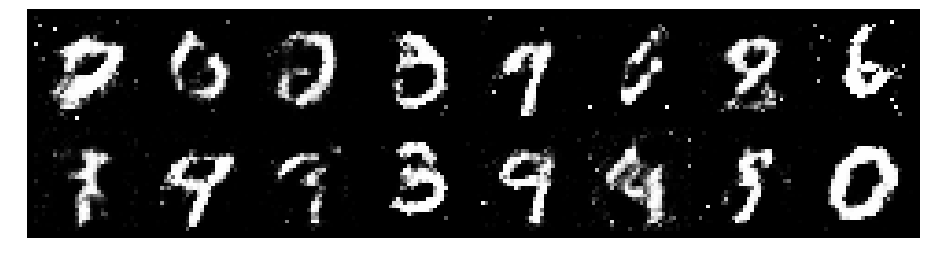

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.1910, Generator Loss: 1.1516
D(x): 0.6167, D(G(z)): 0.4166
176 min	 48.50558137893677 sec


KeyboardInterrupt: 

In [9]:
# Create logger instance
t = time.time()
logger = Logger(model_name='VGAN9', data_name='MNIST')
# Total number of epochs to train
num_epochs = 200
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch))
        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()
        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        # Generate fake data
        fake_data = generator(noise(N))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            dsc_error.append(d_error)
            gen_error.append(g_error)
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )
            print(int((time.time()-t)/60),'min\t',(time.time()-t)%60,'sec')

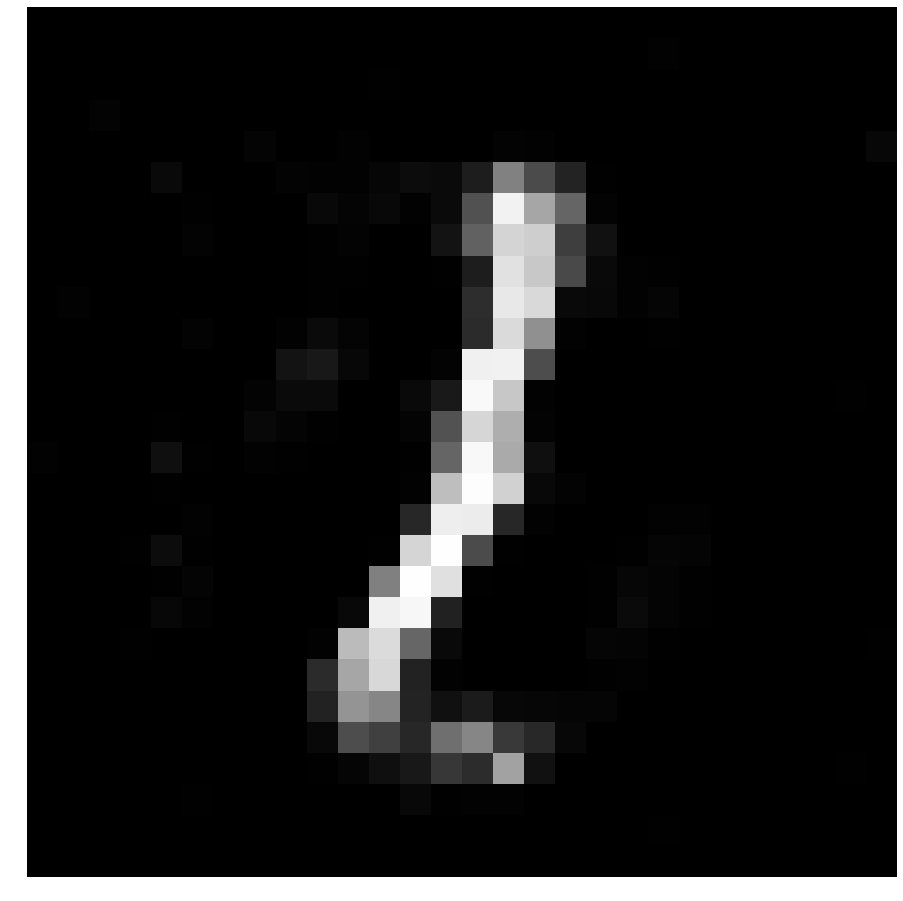

In [16]:
def generate_num():    
    normalize = True
    
    images = vectors_to_images(generator(noise(1))).data
    horizontal_grid = vutils.make_grid(images, normalize=normalize, scale_each=True)
        # Make vertical grid from image tensor
    nrows = int(np.sqrt(1))
    grid = vutils.make_grid( images, nrow=nrows, normalize=True, scale_each=True)
    fig = plt.figure(figsize=(16, 16))
    plt.imshow(np.moveaxis(horizontal_grid.numpy(), 0, -1))
    plt.axis('off')
    #display(plt.gcf())
    #plt.show()
generate_num()